In [18]:
import glob
import astropy
import importlib
import math
import numpy as np
import xlwt
import xlsxwriter
import warnings
warnings.filterwarnings('ignore')

from xlwt import Workbook
from reduct_funcs import funcs_calib_and_plot
from reduct_funcs import funcs_star_finder
from reduct_funcs import funcs_apt_phot
from reduct_funcs import funcs_utils

importlib.reload(funcs_calib_and_plot)
importlib.reload(funcs_star_finder)
importlib.reload(funcs_apt_phot)
importlib.reload(funcs_utils)

<module 'reduct_funcs.funcs_utils' from 'C:\\Users\\afiq-Astro\\Desktop\\TSSP\\reductions_3\\reduct_funcs\\funcs_utils.py'>

In [2]:
#fp = 'C:/Users/afiq-Astro/Desktop/TSSP/reductions_3/files_sorted/2020-04-08'
#funcs_utils.make_dir(fp )

In [9]:
#MJD = '2020-03-05'
#pol_flat_MJD = '2020-03-26'
#pol_flat_filter = 'P1-R'

#bias = glob.glob('./files_sorted/'+MJD+'/bias/*')
#dark = glob.glob('./files_sorted/'+MJD+'/dark/*')
#flat = glob.glob('./files_sorted/'+MJD+'/flat/*') #Work with this. 
#pol_std_flat = glob.glob('./files_sorted/pol_flats/'+pol_flat_MJD+'/'+pol_flat_filter +'/*')
#target = glob.glob('./files_sorted/'+MJD+'/ee_cep/*')
#pol_std = glob.glob('./files_sorted/'+MJD+'/pol_std/*')

#print("Bias:", str(len(bias))+".", 
#      "Dark:", str(len(dark))+".", 
#      "Flat:", str(len(pol_std_flat))+".", 
#      "Target:", str(len(target))+".", 
#      "Polarization Standard:", str(len(pol_std))+".")

#funcs_calib_and_plot.file_splits(bias)
#funcs_calib_and_plot.file_splits(dark)
#funcs_calib_and_plot.file_splits(flat)
#funcs_calib_and_plot.file_splits(pol_std_flat)
#funcs_calib_and_plot.file_splits(target)
#funcs_calib_and_plot.file_splits(pol_std)

In [19]:
#Takes into consideration the pol flat
MJD = '2020-04-08'
pol_flat_MJD = 'moaf' #26 was the first flat thing
pol_flat_filter = 'P1-R'
target_name='HD104860'

bias = glob.glob('./files_sorted/'+MJD+'/bias/*')
dark = glob.glob('./files_sorted/'+MJD+'/dark/*')
pol_std_flat = glob.glob('./files_sorted/pol_flats/'+pol_flat_MJD+'/'+pol_flat_filter +'/*')
target = glob.glob('./files_sorted/'+MJD+'/'+target_name+'/*')
pol_std = glob.glob('./files_sorted/'+MJD+'/pol_std/*')

print("Bias:", str(len(bias))+".", 
      "Dark:", str(len(dark))+".", 
      "Flat:", str(len(pol_std_flat))+".", 
      "Target:", str(len(target))+".", 
      "Polarization Standard:", str(len(pol_std))+".")

funcs_calib_and_plot.file_splits(bias)
funcs_calib_and_plot.file_splits(dark)
funcs_calib_and_plot.file_splits(pol_std_flat)
funcs_calib_and_plot.file_splits(target)
funcs_calib_and_plot.file_splits(pol_std)

Bias: 50. Dark: 270. Flat: 101. Target: 622. Polarization Standard: 5.
zero {'bias'} Filters: [('SU', 50)] 
dark {'dark'} Filters: [('SU', 220), ('N-B', 50)] 
flat {'flat'} Filters: [('P1-R', 101)] 
object {'hd10486'} Filters: [('P1-I', 50), ('P3-R', 50), ('P3-I', 50), ('P3-V', 91), ('N-R', 80), ('P1-R', 50), ('N-I', 80), ('P1-V', 91), ('N-V', 80)] total 18.0 min exposure time
object {'G191B2B', 'HD215806'} Filters: [('P1-R', 3), ('P3-R', 2)] total 2.0 min exposure time


In [4]:
#Takes into consideration the pol flat
#MJD = '2020-03-14'
#pol_flat_MJD = 'moaf' #26 was the first flat thing
#pol_flat_filter = 'P1-R'

#bias = glob.glob('./files_sorted/'+MJD+'/bias/*')
#dark = glob.glob('./files_sorted/'+MJD+'/dark/*')
#pol_std_flat = glob.glob('./files_sorted/pol_flats/'+pol_flat_MJD+'/'+pol_flat_filter +'/*')
#target = glob.glob('./files_sorted/'+MJD+'/ee_cep/*')
#pol_std = glob.glob('./files_sorted/'+MJD+'/pol_std/*')

#print("Bias:", str(len(bias))+".", 
#      "Dark:", str(len(dark))+".", 
#      "Flat:", str(len(pol_std_flat))+".", 
#      "Target:", str(len(target))+".", 
#      "Polarization Standard:", str(len(pol_std))+".")

#funcs_calib_and_plot.file_splits(bias)
#funcs_calib_and_plot.file_splits(dark)
#funcs_calib_and_plot.file_splits(pol_std_flat)
#funcs_calib_and_plot.file_splits(target)
#funcs_calib_and_plot.file_splits(pol_std)

In [20]:
#m_biast, m_dark, m_flat = funcs_calib_and_plot.make_calib_files(bias, dark, flat) #unable to make 

m_biast, m_dark, m_flat = funcs_calib_and_plot.make_calib_files(bias, dark, pol_std_flat)

#Where do the R bands start?

In [21]:
funcs_utils.print_list(MJD, target)

2020-04-08
0 00:04:32.97 N-I 1.0 hd10486
1 00:04:48.21 N-I 1.0 hd10486
2 00:05:03.39 N-I 1.0 hd10486
3 00:05:18.53 N-I 1.0 hd10486
4 00:05:33.70 N-I 1.0 hd10486
5 00:05:48.84 N-I 1.0 hd10486
6 00:06:04.03 N-I 1.0 hd10486
7 00:06:19.25 N-I 1.0 hd10486
8 00:06:34.44 N-I 1.0 hd10486
9 00:06:49.66 N-I 1.0 hd10486
10 00:07:04.80 N-I 1.0 hd10486
11 00:07:19.99 N-I 1.0 hd10486
12 00:07:35.20 N-I 1.0 hd10486
13 00:07:50.41 N-I 1.0 hd10486
14 00:08:05.58 N-I 1.0 hd10486
15 00:08:20.72 N-I 1.0 hd10486
16 00:08:35.89 N-I 1.0 hd10486
17 00:08:51.08 N-I 1.0 hd10486
18 00:09:06.28 N-I 1.0 hd10486
19 00:09:21.45 N-I 1.0 hd10486
20 00:09:36.62 N-I 1.0 hd10486
21 00:09:51.76 N-I 1.0 hd10486
22 00:10:06.94 N-I 1.0 hd10486
23 00:10:22.16 N-I 1.0 hd10486
24 00:10:37.34 N-I 1.0 hd10486
25 00:10:52.48 N-I 1.0 hd10486
26 00:11:07.66 N-I 1.0 hd10486
27 00:11:22.88 N-I 1.0 hd10486
28 00:11:38.05 N-I 1.0 hd10486
29 00:11:53.19 N-I 1.0 hd10486
30 00:12:08.38 N-I 1.0 hd10486
31 00:12:23.58 N-I 1.0 hd10486
32 00:1

265 01:11:59.70 P1-I 2.0 hd10486
266 01:12:15.23 P1-I 2.0 hd10486
267 01:12:30.76 P1-I 2.0 hd10486
268 01:12:46.22 P1-I 2.0 hd10486
269 01:13:01.68 P1-I 2.0 hd10486
270 01:13:17.15 P1-I 2.0 hd10486
271 01:13:32.71 P1-I 2.0 hd10486
272 01:13:48.25 P1-I 2.0 hd10486
273 01:14:03.80 P1-I 2.0 hd10486
274 01:14:19.36 P1-I 2.0 hd10486
275 01:14:34.92 P1-I 2.0 hd10486
276 01:14:50.46 P1-I 2.0 hd10486
277 01:15:05.99 P1-I 2.0 hd10486
278 01:15:21.52 P1-I 2.0 hd10486
279 01:15:36.99 P1-I 2.0 hd10486
280 01:15:52.45 P1-I 2.0 hd10486
281 01:16:07.91 P1-I 2.0 hd10486
282 01:16:23.38 P1-I 2.0 hd10486
283 01:16:38.86 P1-I 2.0 hd10486
284 01:16:54.40 P1-I 2.0 hd10486
285 01:17:09.94 P1-I 2.0 hd10486
286 01:17:25.38 P1-I 2.0 hd10486
287 01:17:40.84 P1-I 2.0 hd10486
288 01:17:56.30 P1-I 2.0 hd10486
289 01:18:11.76 P1-I 2.0 hd10486
290 00:51:46.75 P1-R 2.0 hd10486
291 00:52:02.20 P1-R 2.0 hd10486
292 00:52:17.67 P1-R 2.0 hd10486
293 00:52:33.23 P1-R 2.0 hd10486
294 00:52:48.78 P1-R 2.0 hd10486
295 00:53:

516 01:00:56.90 P3-R 2.0 hd10486
517 01:01:12.36 P3-R 2.0 hd10486
518 01:01:27.83 P3-R 2.0 hd10486
519 01:01:43.37 P3-R 2.0 hd10486
520 01:01:58.90 P3-R 2.0 hd10486
521 01:02:14.43 P3-R 2.0 hd10486
522 01:02:29.90 P3-R 2.0 hd10486
523 01:02:45.36 P3-R 2.0 hd10486
524 01:03:00.82 P3-R 2.0 hd10486
525 01:03:16.28 P3-R 2.0 hd10486
526 01:03:31.74 P3-R 2.0 hd10486
527 01:03:47.27 P3-R 2.0 hd10486
528 01:04:02.81 P3-R 2.0 hd10486
529 01:04:18.28 P3-R 2.0 hd10486
530 01:04:33.74 P3-R 2.0 hd10486
531 00:26:57.14 P3-V 2.0 hd10486
532 00:27:12.70 P3-V 2.0 hd10486
533 00:27:28.17 P3-V 2.0 hd10486
534 00:27:43.72 P3-V 2.0 hd10486
535 00:27:59.20 P3-V 2.0 hd10486
536 00:30:20.32 P3-V 2.0 hd10486
537 00:30:35.78 P3-V 2.0 hd10486
538 00:30:51.34 P3-V 2.0 hd10486
539 00:31:06.88 P3-V 2.0 hd10486
540 00:31:22.44 P3-V 2.0 hd10486
541 00:31:37.98 P3-V 2.0 hd10486
542 00:31:53.52 P3-V 2.0 hd10486
543 00:32:08.99 P3-V 2.0 hd10486
544 00:32:24.44 P3-V 2.0 hd10486
545 00:32:39.91 P3-V 2.0 hd10486
546 00:32:

In [ ]:
#Question, what else is a zero polarization standard star

#zeroeing is important

#51 to 102

#Ok. New Procedure. For Each time you run the pipe. Look at all your targets

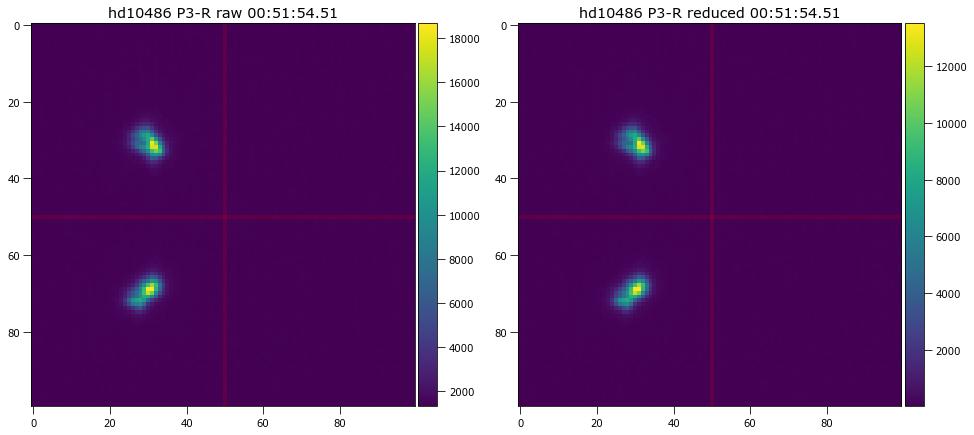

<Figure size 1008x1008 with 0 Axes>

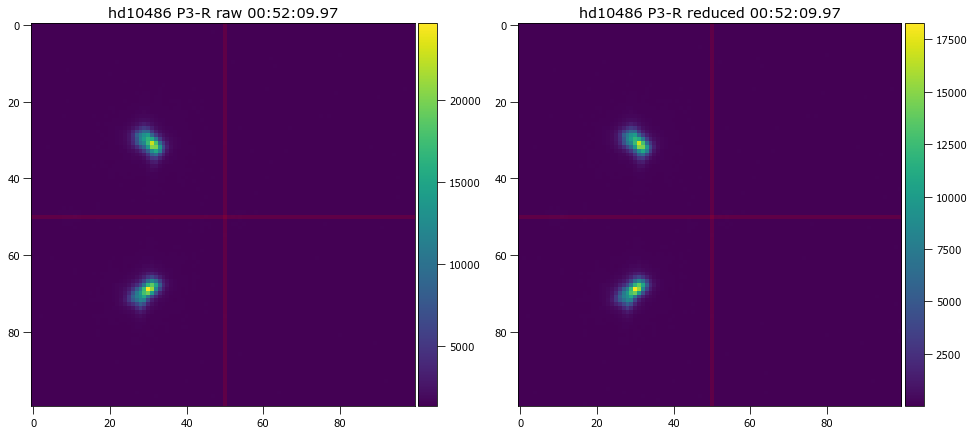

<Figure size 1008x1008 with 0 Axes>

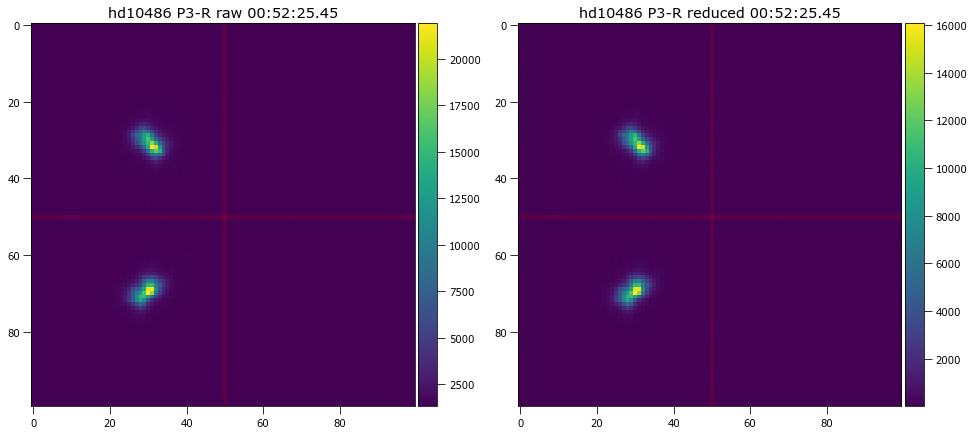

<Figure size 1008x1008 with 0 Axes>

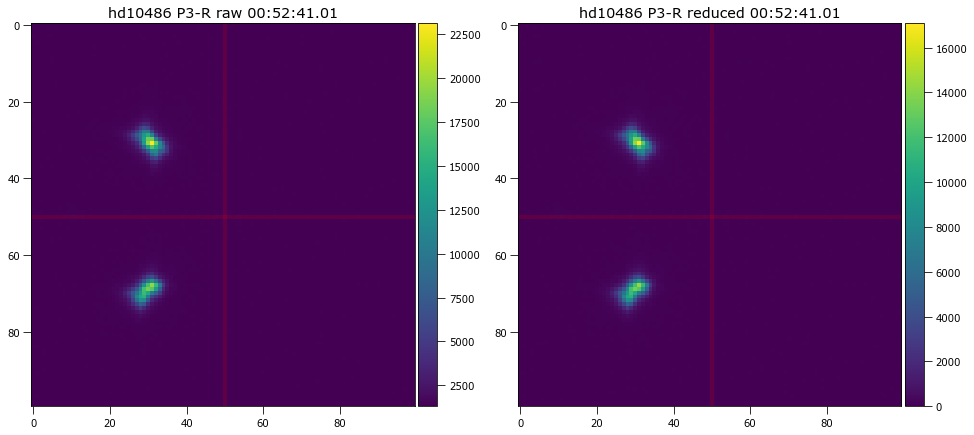

<Figure size 1008x1008 with 0 Axes>

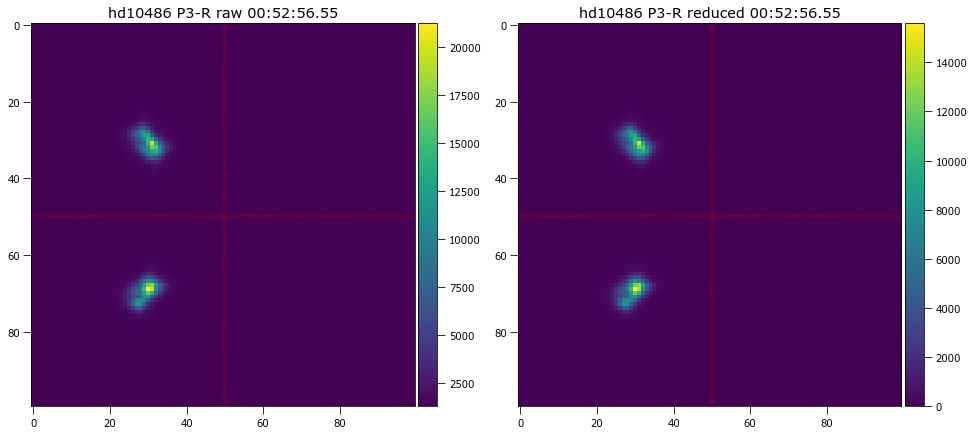

<Figure size 1008x1008 with 0 Axes>

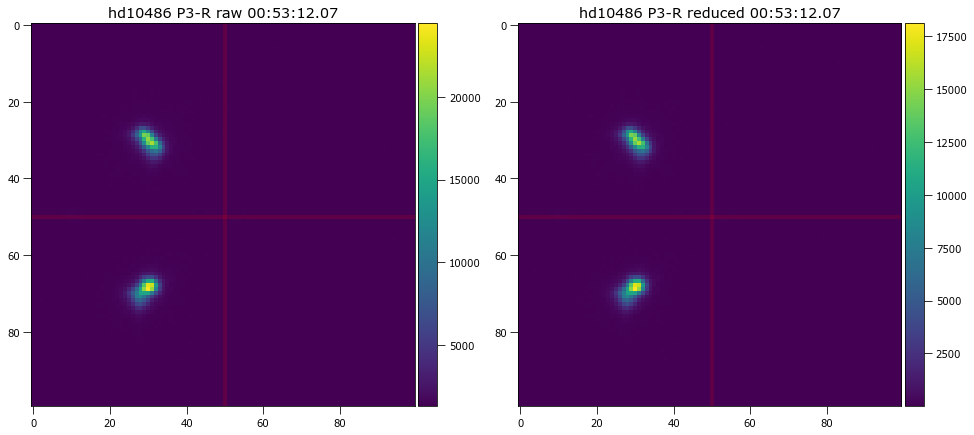

<Figure size 1008x1008 with 0 Axes>

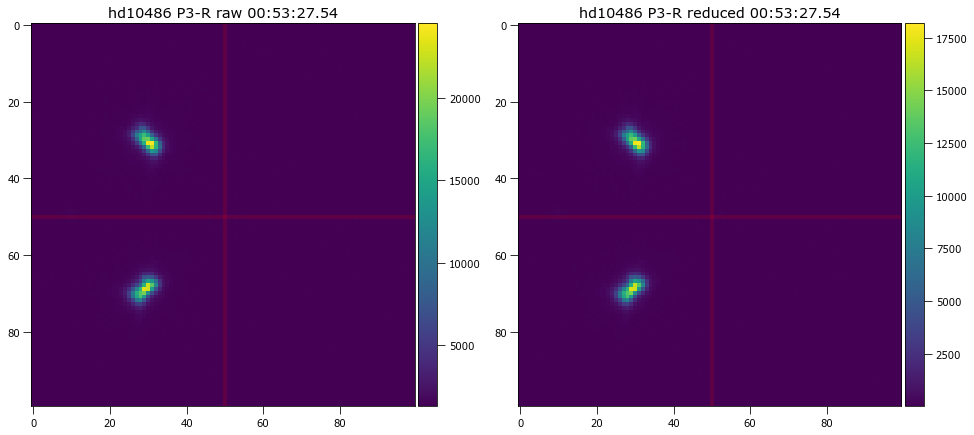

<Figure size 1008x1008 with 0 Axes>

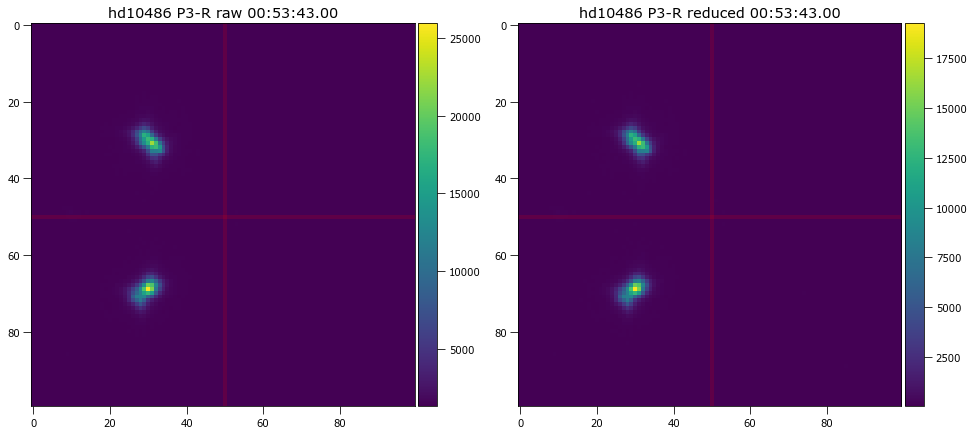

<Figure size 1008x1008 with 0 Axes>

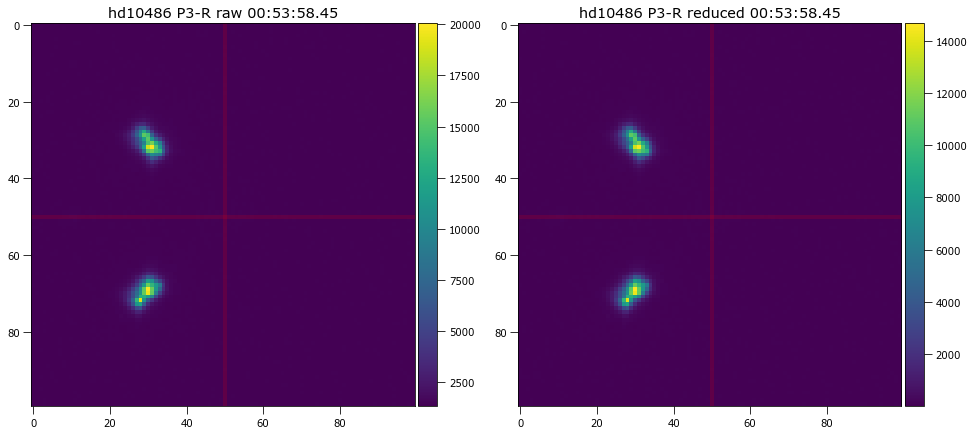

<Figure size 1008x1008 with 0 Axes>

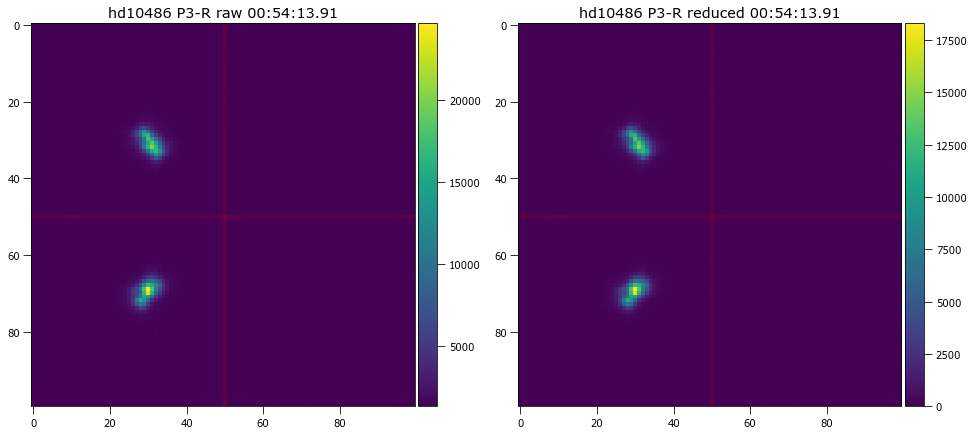

<Figure size 1008x1008 with 0 Axes>

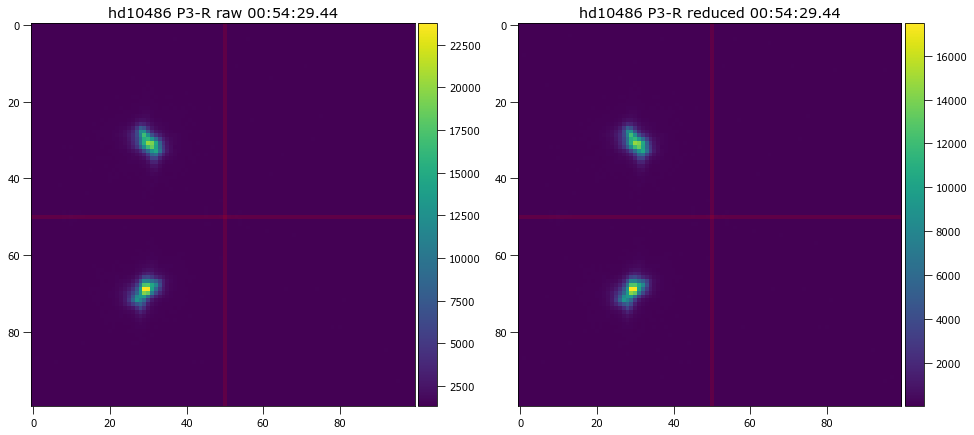

<Figure size 1008x1008 with 0 Axes>

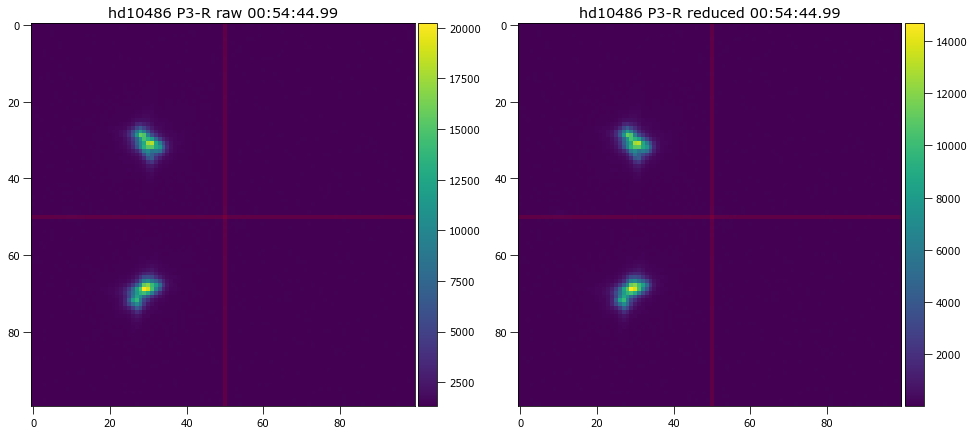

<Figure size 1008x1008 with 0 Axes>

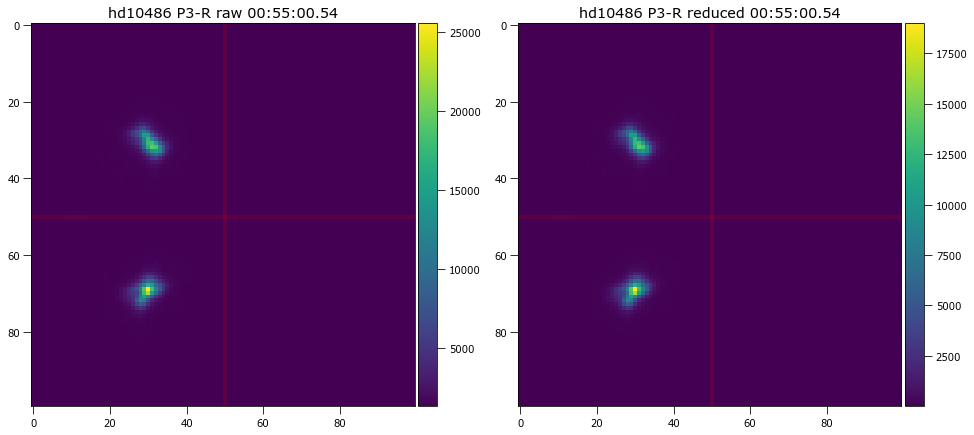

<Figure size 1008x1008 with 0 Axes>

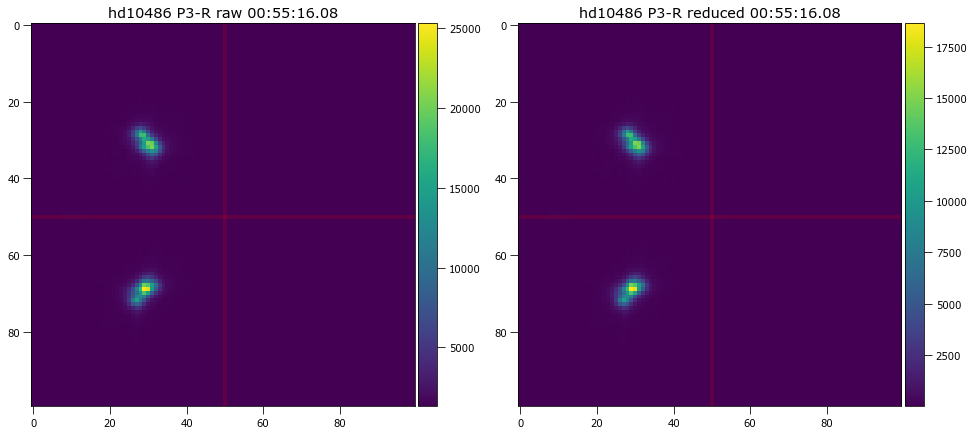

<Figure size 1008x1008 with 0 Axes>

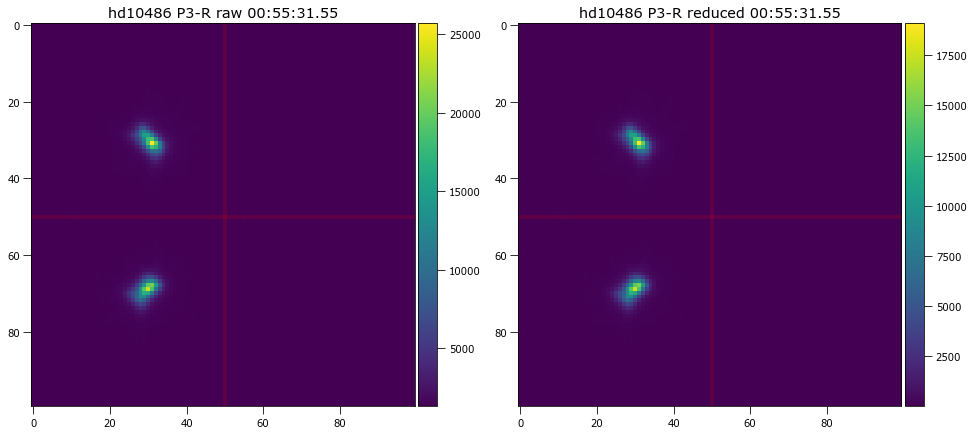

<Figure size 1008x1008 with 0 Axes>

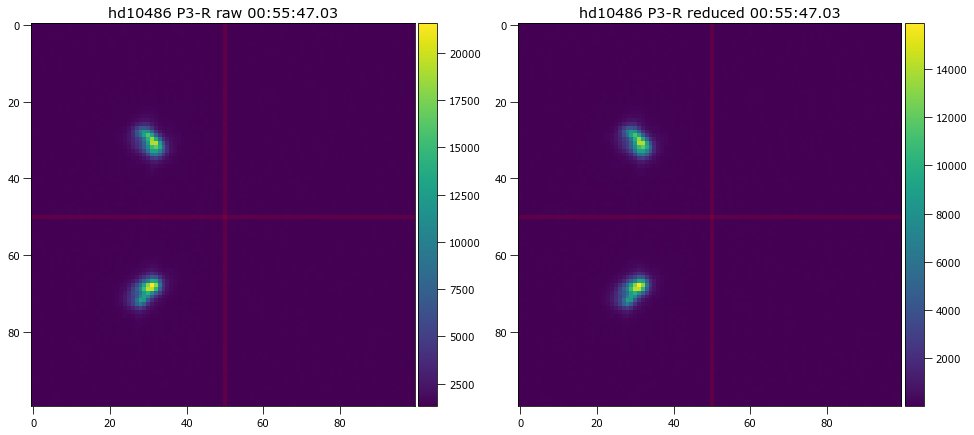

<Figure size 1008x1008 with 0 Axes>

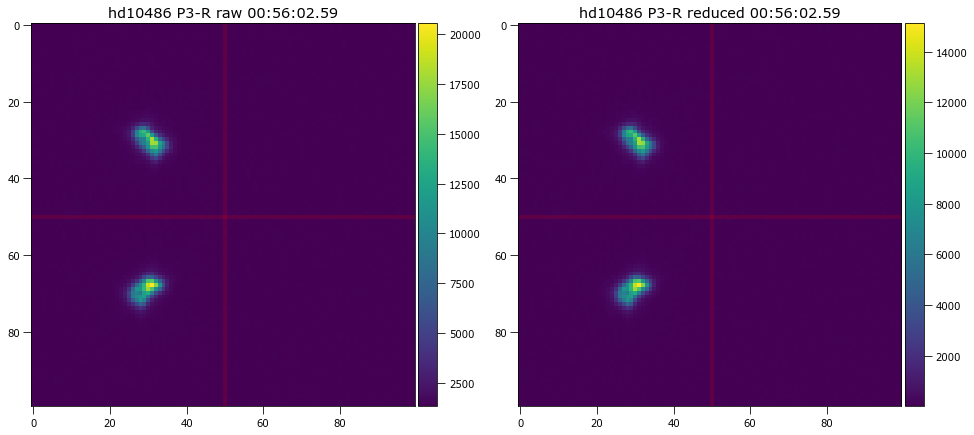

<Figure size 1008x1008 with 0 Axes>

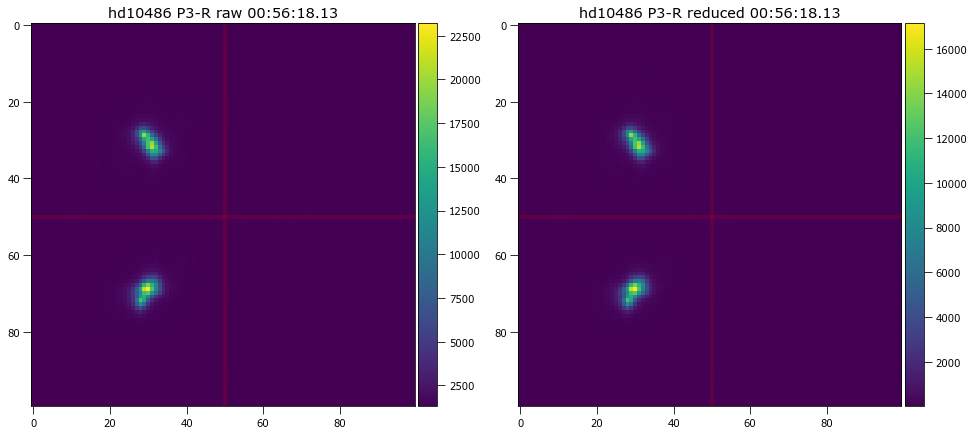

<Figure size 1008x1008 with 0 Axes>

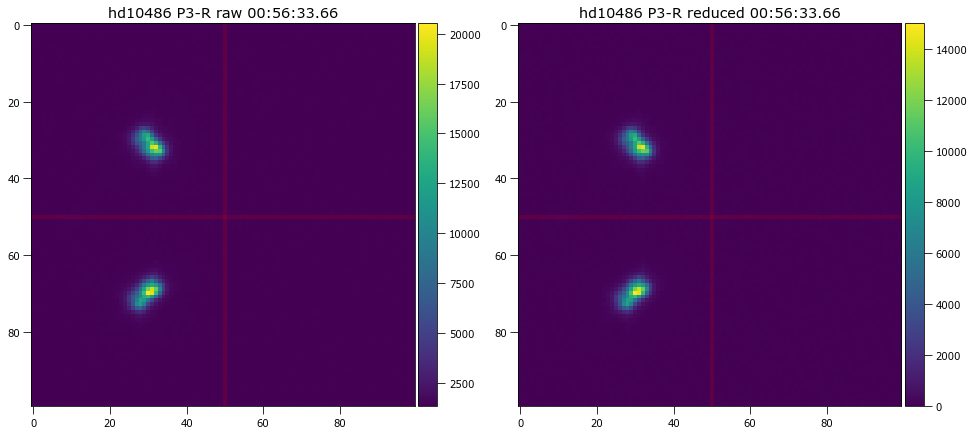

<Figure size 1008x1008 with 0 Axes>

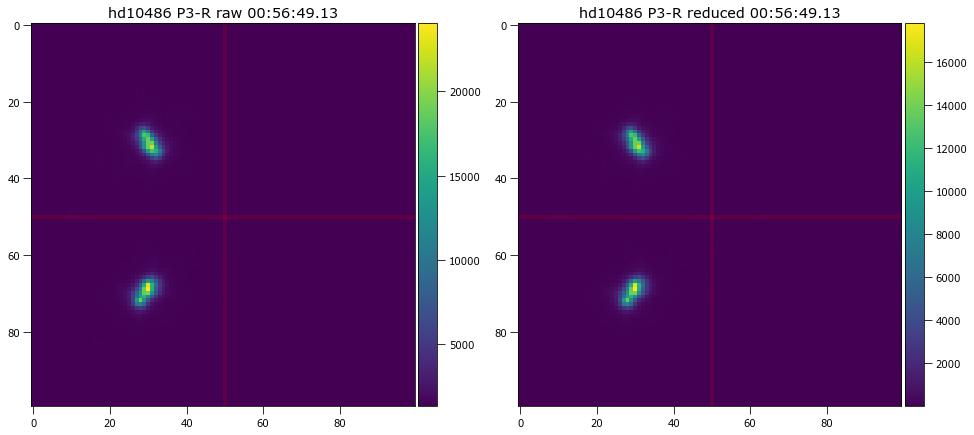

<Figure size 1008x1008 with 0 Axes>

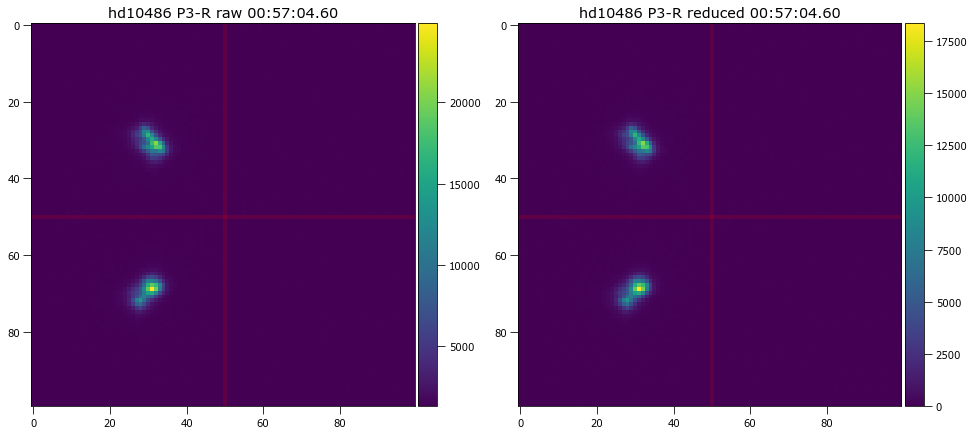

<Figure size 1008x1008 with 0 Axes>

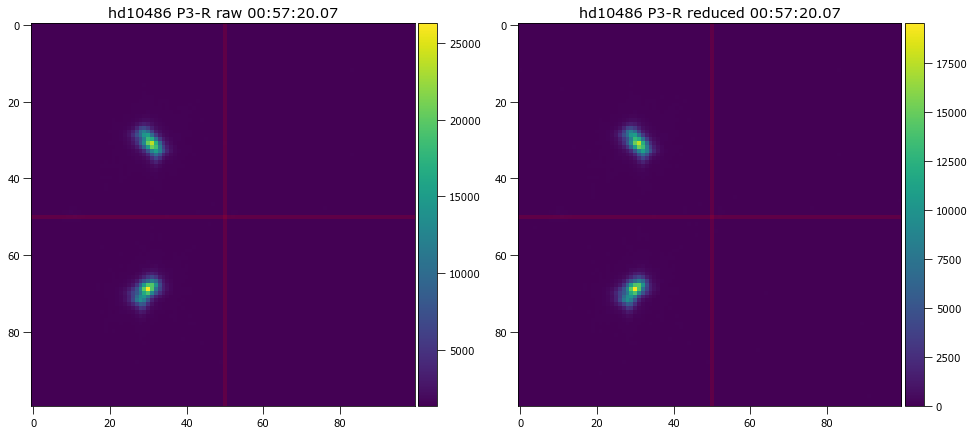

<Figure size 1008x1008 with 0 Axes>

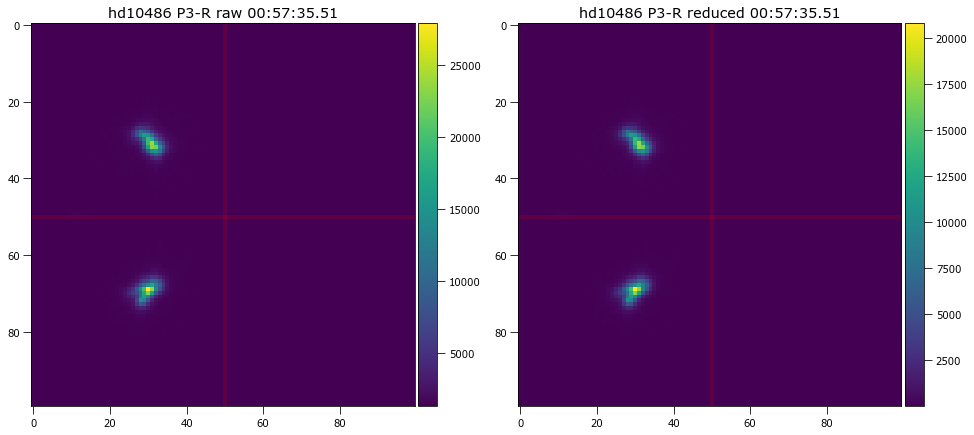

<Figure size 1008x1008 with 0 Axes>

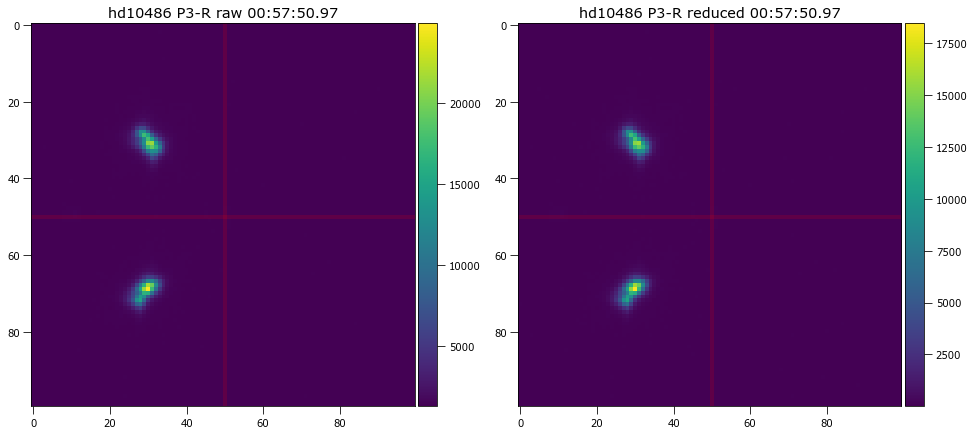

<Figure size 1008x1008 with 0 Axes>

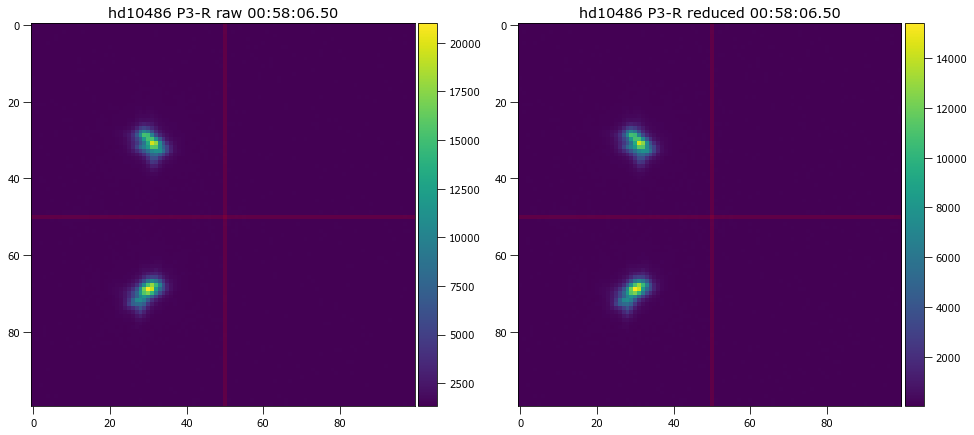

<Figure size 1008x1008 with 0 Axes>

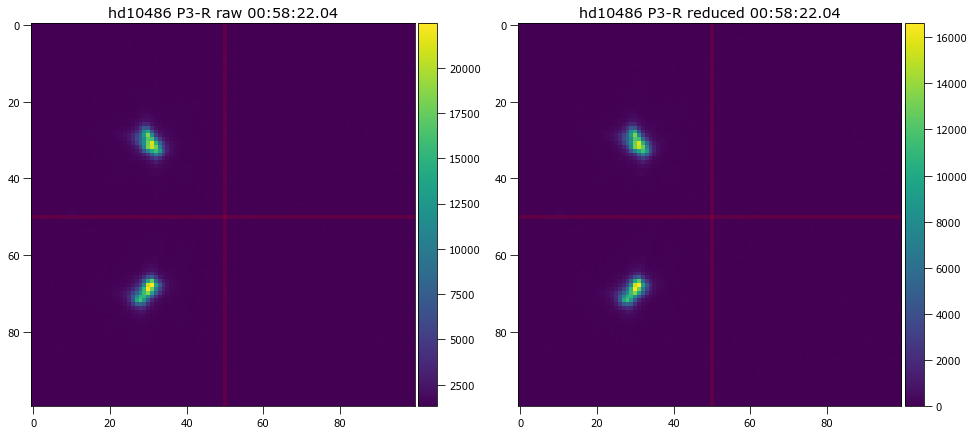

<Figure size 1008x1008 with 0 Axes>

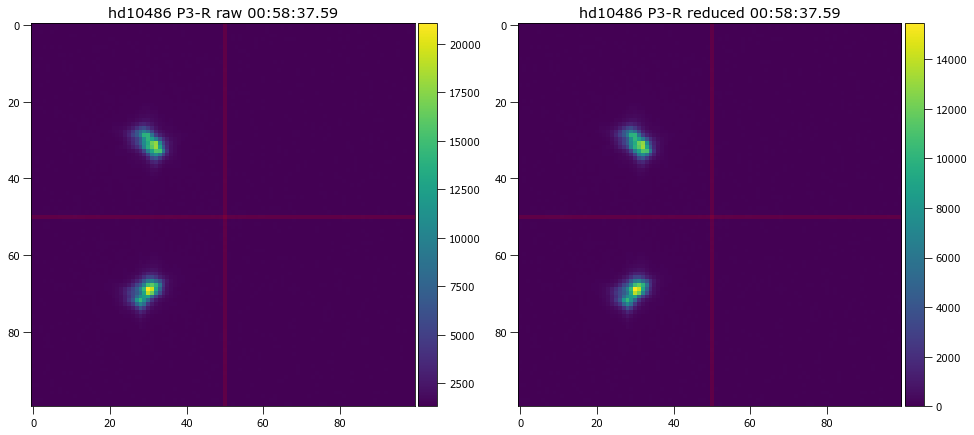

<Figure size 1008x1008 with 0 Axes>

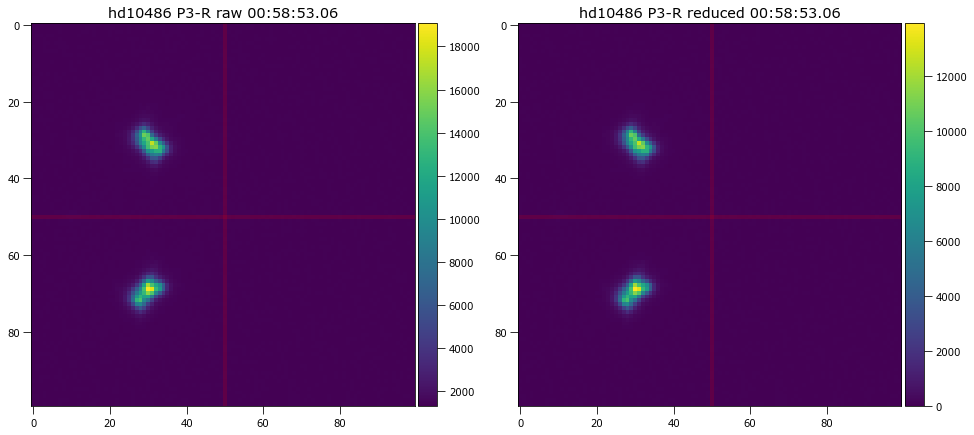

<Figure size 1008x1008 with 0 Axes>

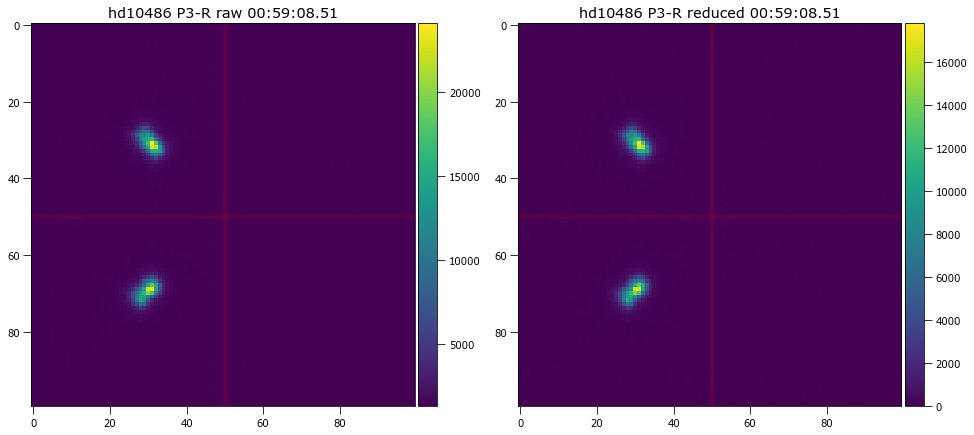

<Figure size 1008x1008 with 0 Axes>

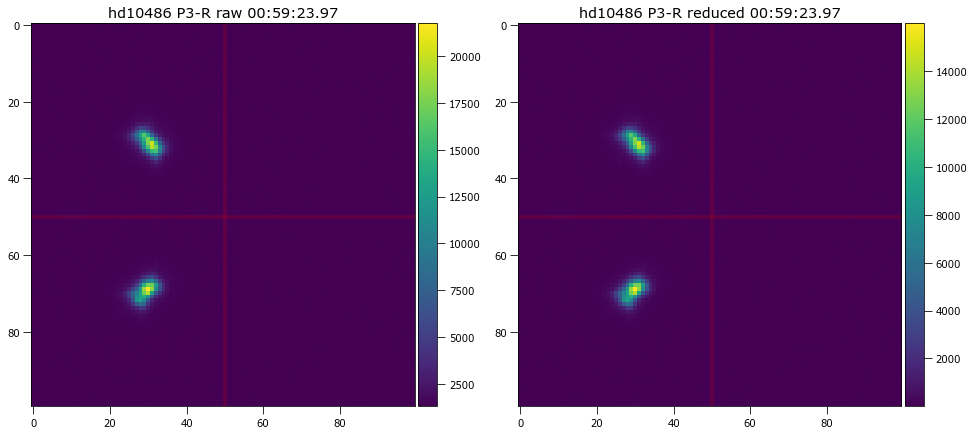

<Figure size 1008x1008 with 0 Axes>

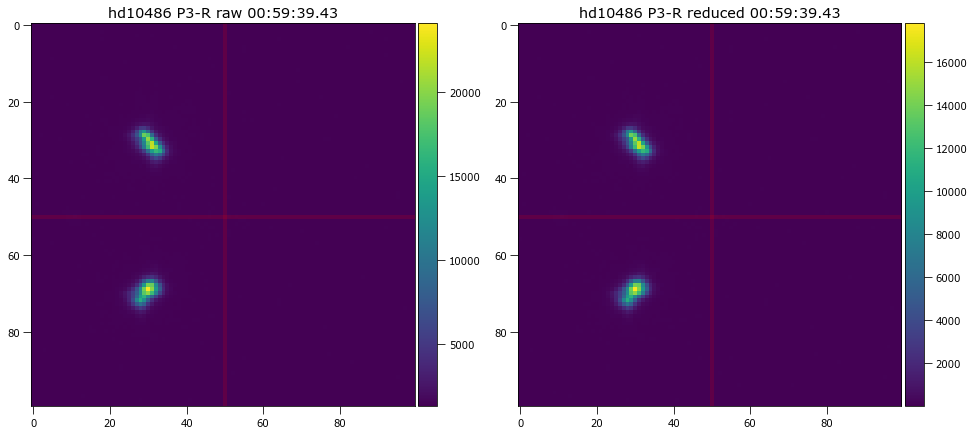

<Figure size 1008x1008 with 0 Axes>

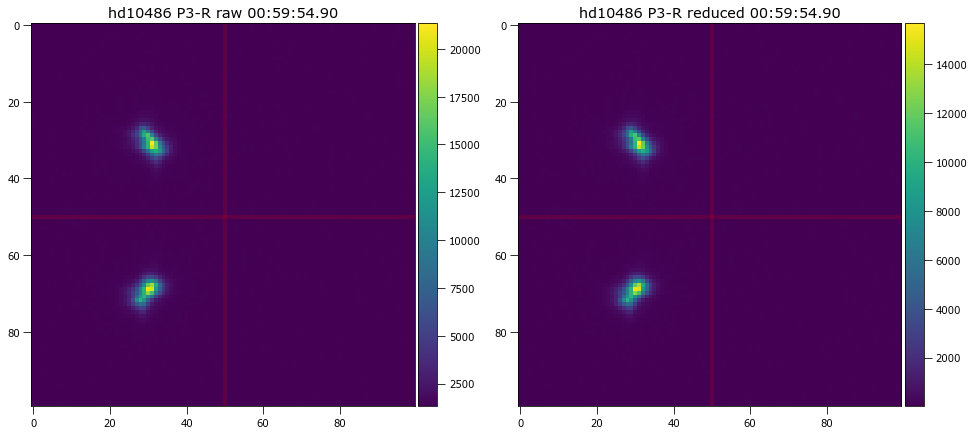

<Figure size 1008x1008 with 0 Axes>

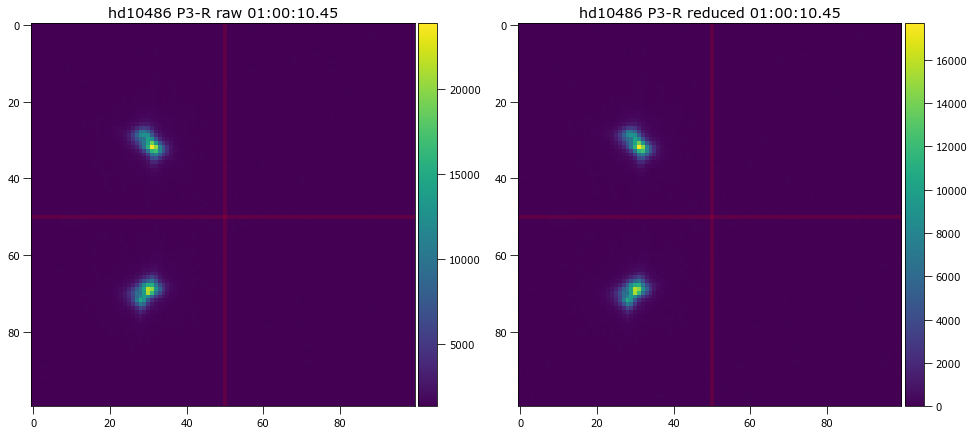

<Figure size 1008x1008 with 0 Axes>

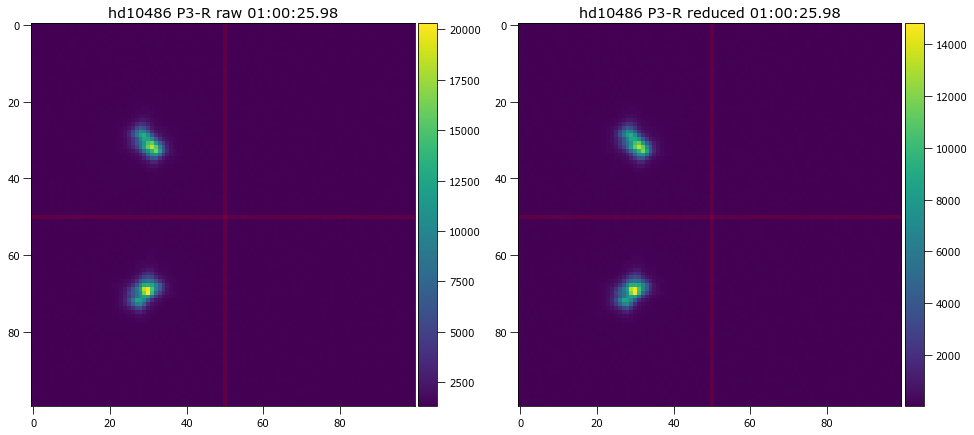

<Figure size 1008x1008 with 0 Axes>

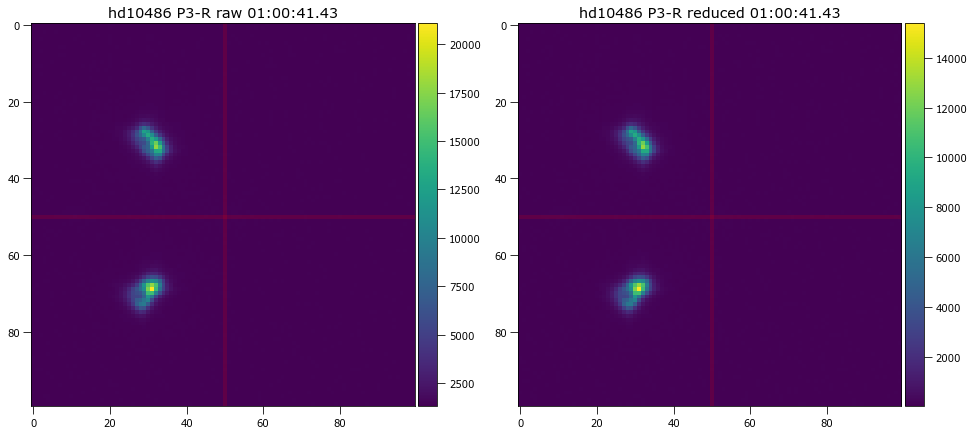

<Figure size 1008x1008 with 0 Axes>

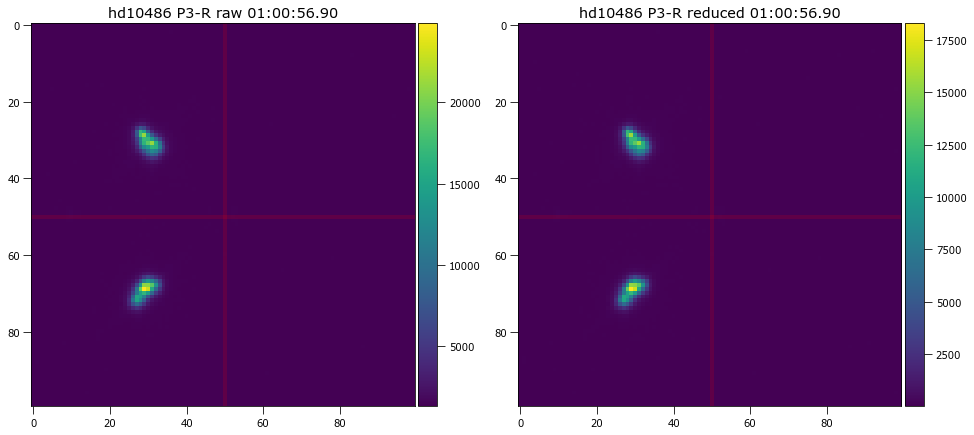

<Figure size 1008x1008 with 0 Axes>

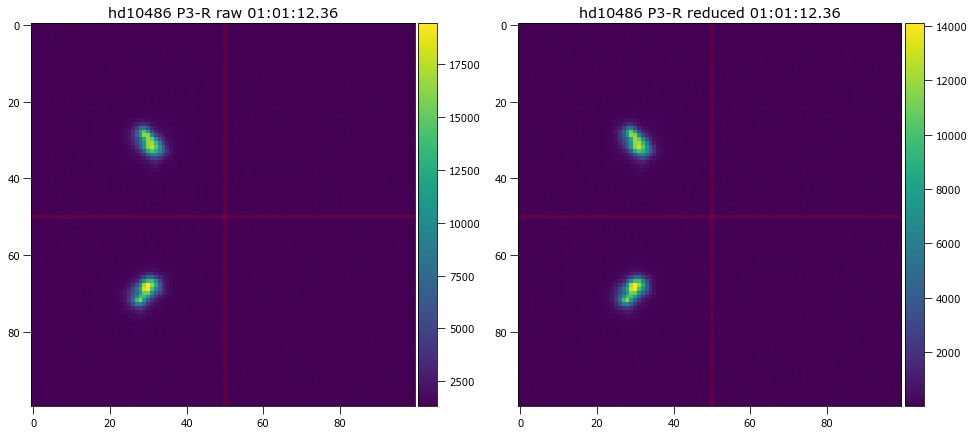

<Figure size 1008x1008 with 0 Axes>

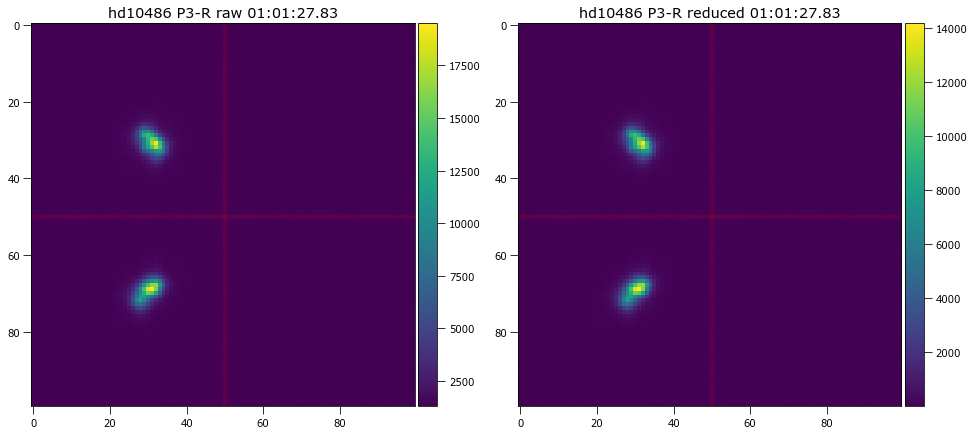

<Figure size 1008x1008 with 0 Axes>

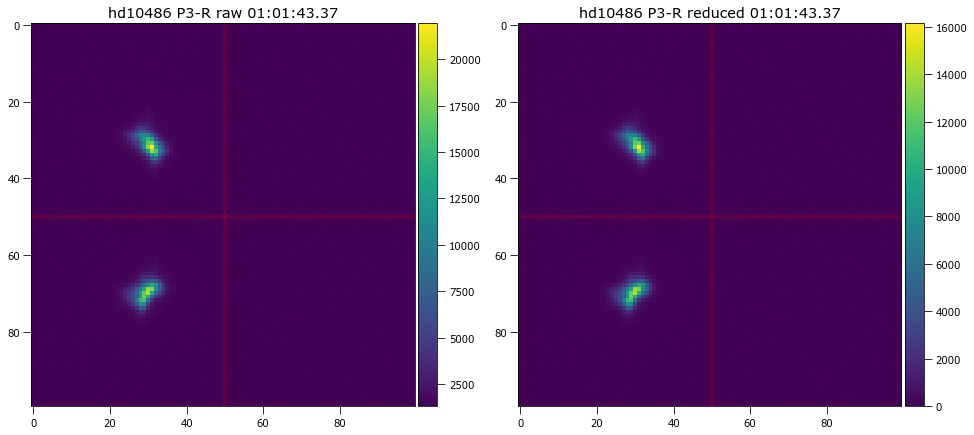

<Figure size 1008x1008 with 0 Axes>

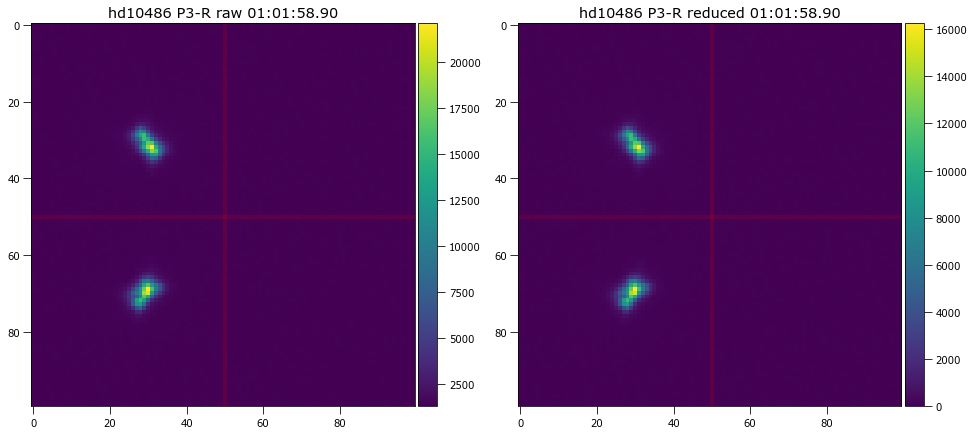

<Figure size 1008x1008 with 0 Axes>

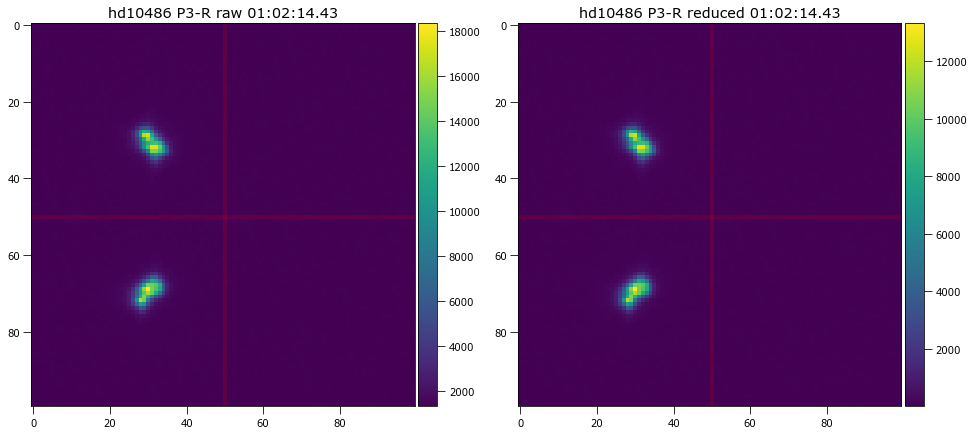

<Figure size 1008x1008 with 0 Axes>

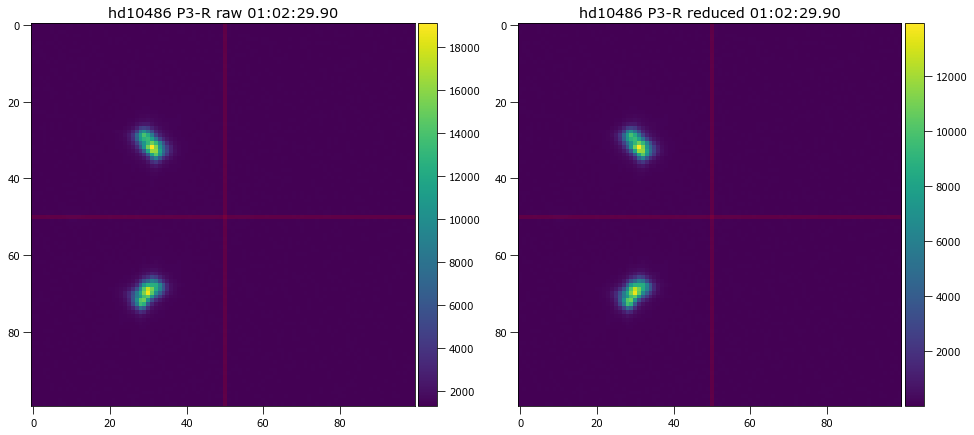

<Figure size 1008x1008 with 0 Axes>

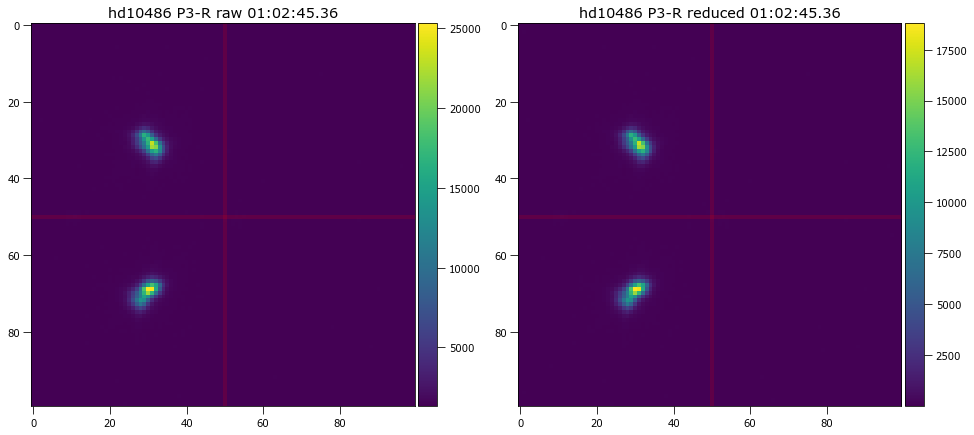

<Figure size 1008x1008 with 0 Axes>

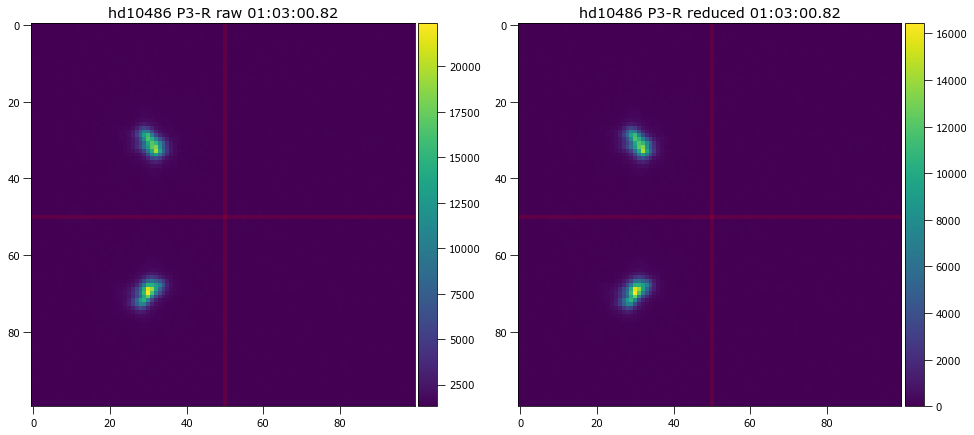

<Figure size 1008x1008 with 0 Axes>

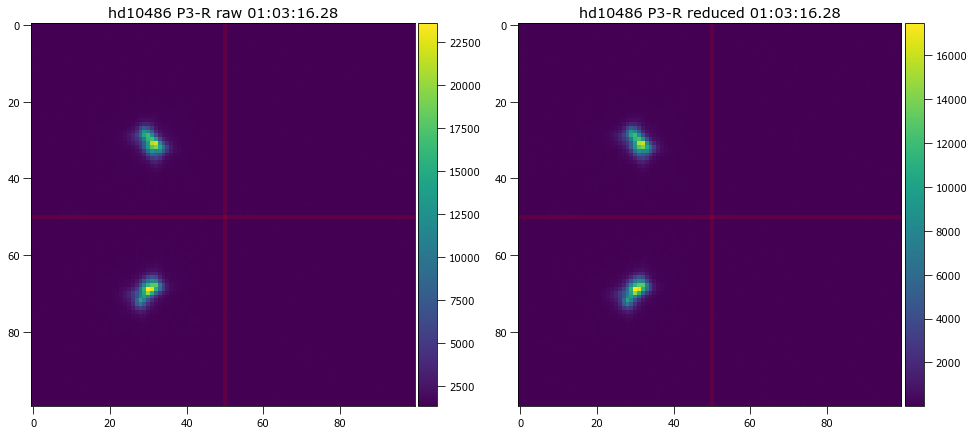

<Figure size 1008x1008 with 0 Axes>

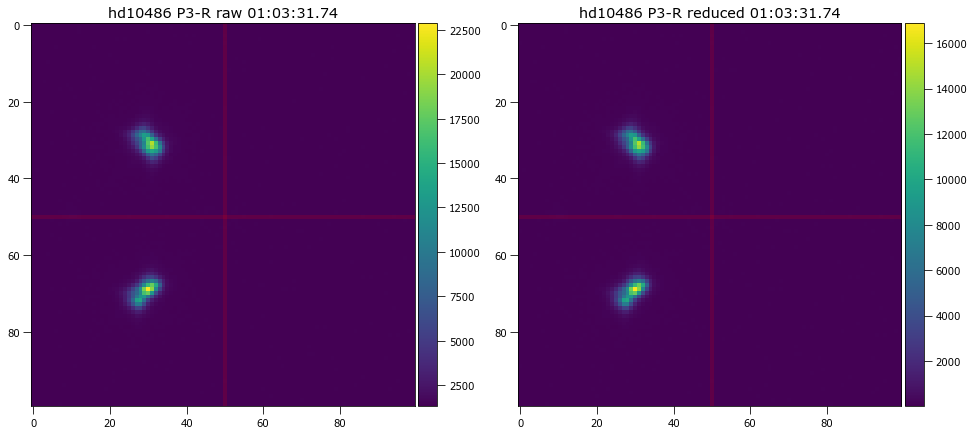

<Figure size 1008x1008 with 0 Axes>

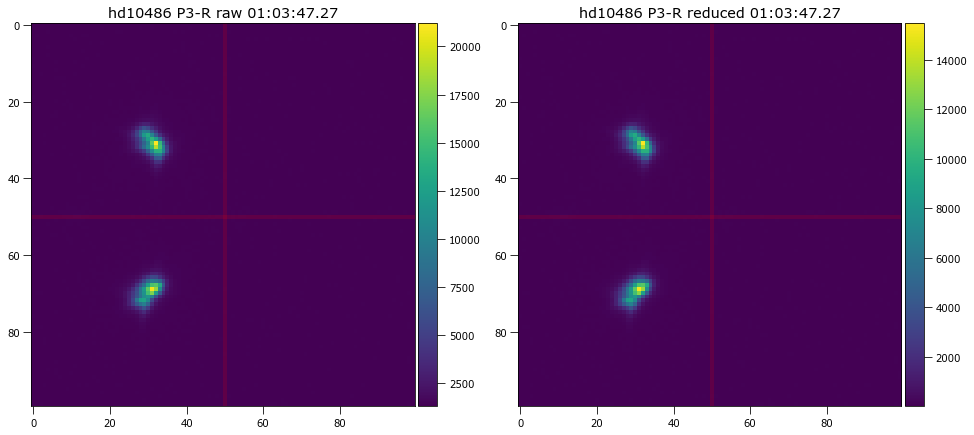

<Figure size 1008x1008 with 0 Axes>

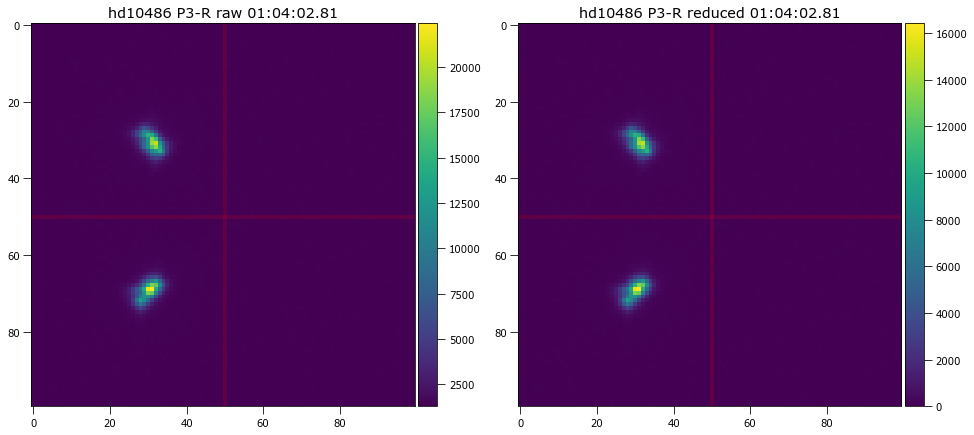

<Figure size 1008x1008 with 0 Axes>

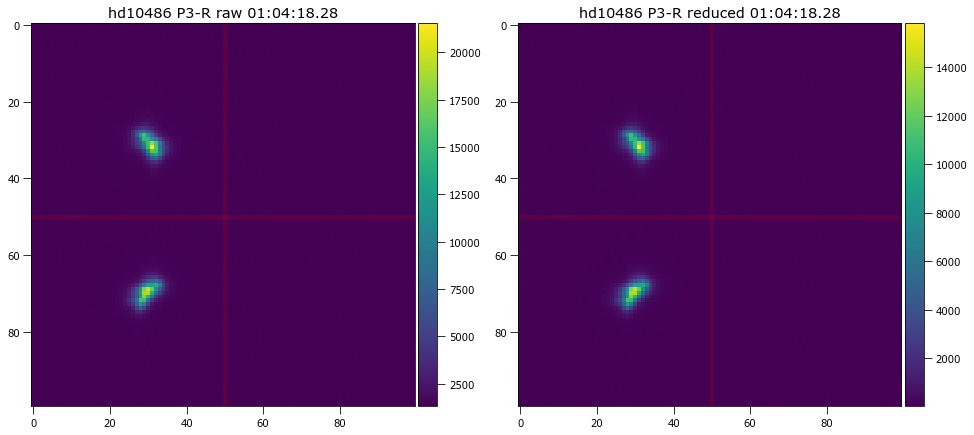

<Figure size 1008x1008 with 0 Axes>

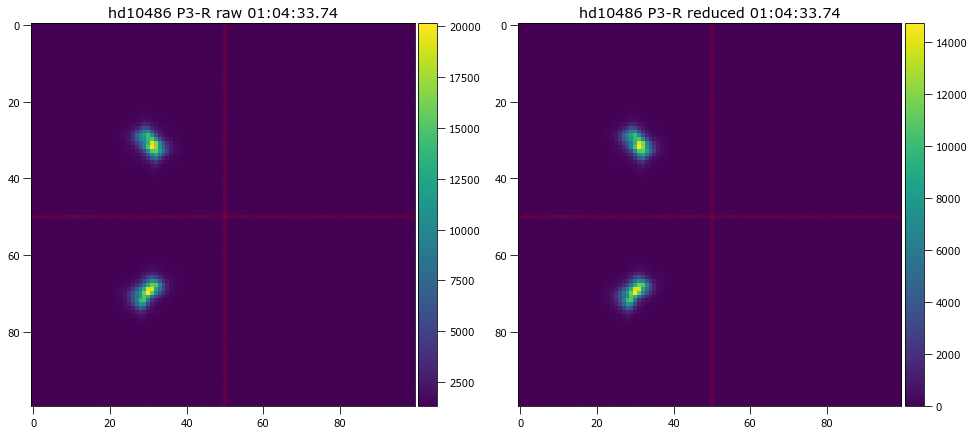

<Figure size 1008x1008 with 0 Axes>

In [5]:
for i in range(481, 531):
    reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(target[i]),
                                    [512, 512, 50, 50], 
                                    (m_biast, m_dark, m_flat),
                                    False, True, True) 
    
    #reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(target[i]),
    #                                    [512, 512, 512, 512], 
    #                                    (m_biast, m_dark, m_flat), 
    #                                    True, True, True)
    
    #reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(target[i]),
    #                                    [512, 512, 512, 512], 
    #                                    (m_biast, m_dark, m_flat), 
    #                                    False, True, True) 

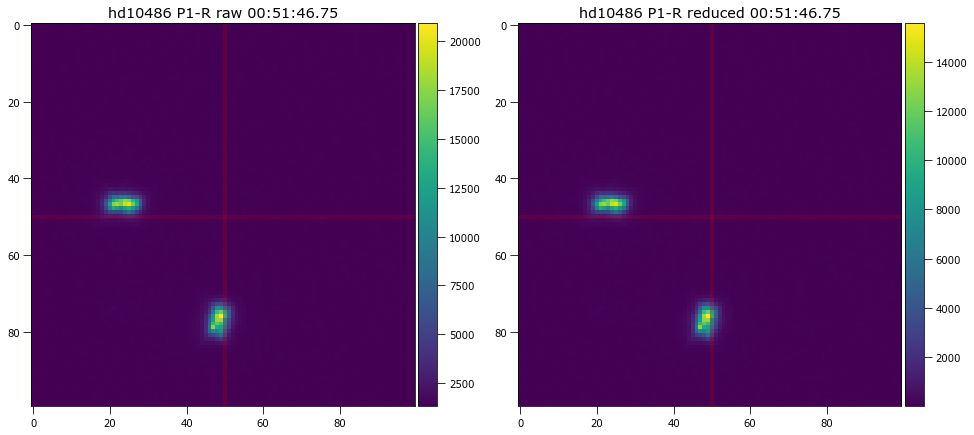

<Figure size 1008x1008 with 0 Axes>

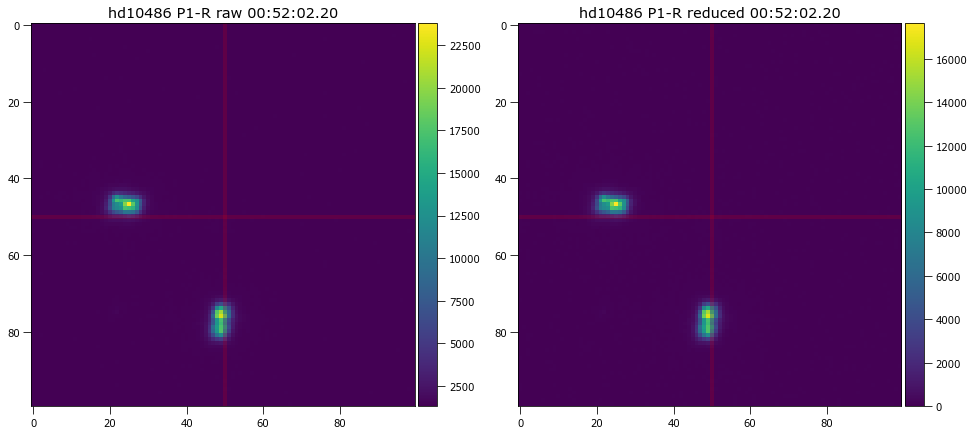

<Figure size 1008x1008 with 0 Axes>

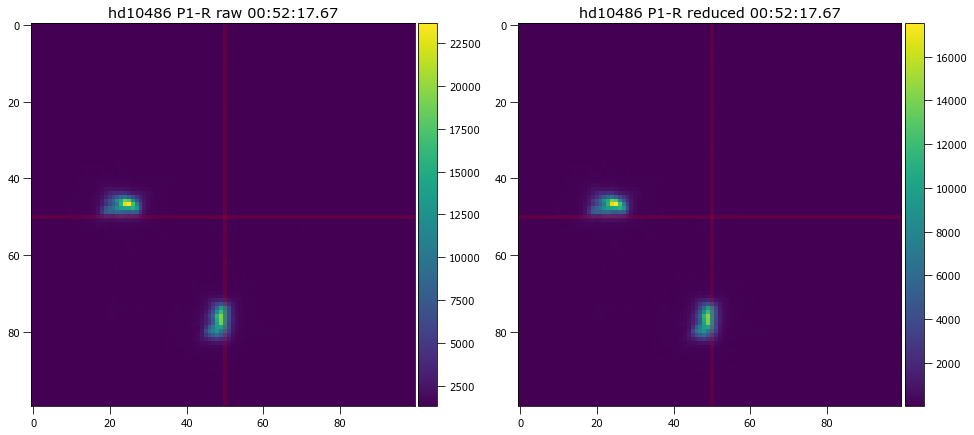

<Figure size 1008x1008 with 0 Axes>

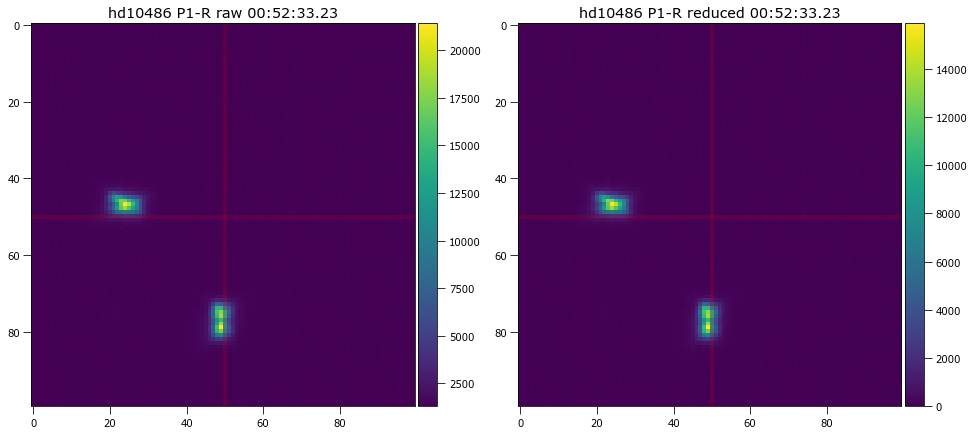

<Figure size 1008x1008 with 0 Axes>

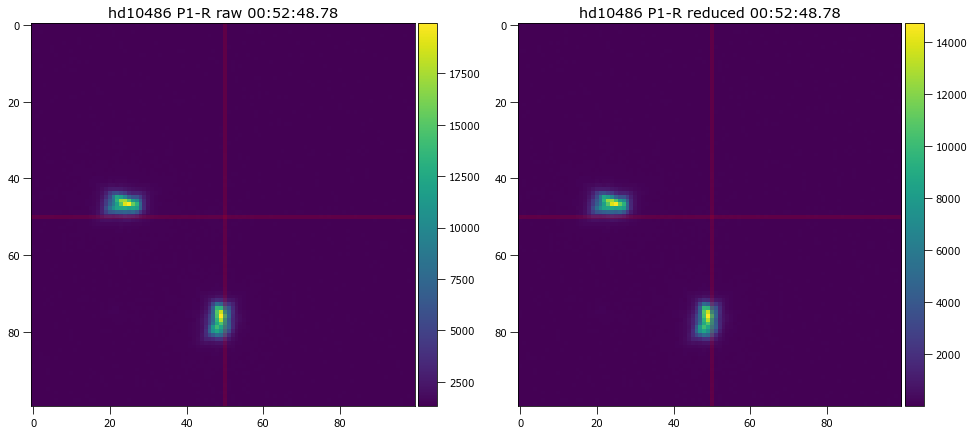

<Figure size 1008x1008 with 0 Axes>

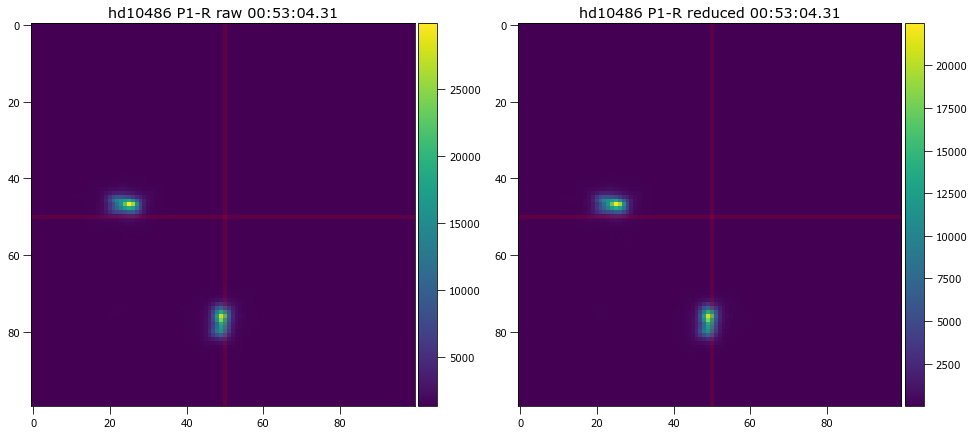

<Figure size 1008x1008 with 0 Axes>

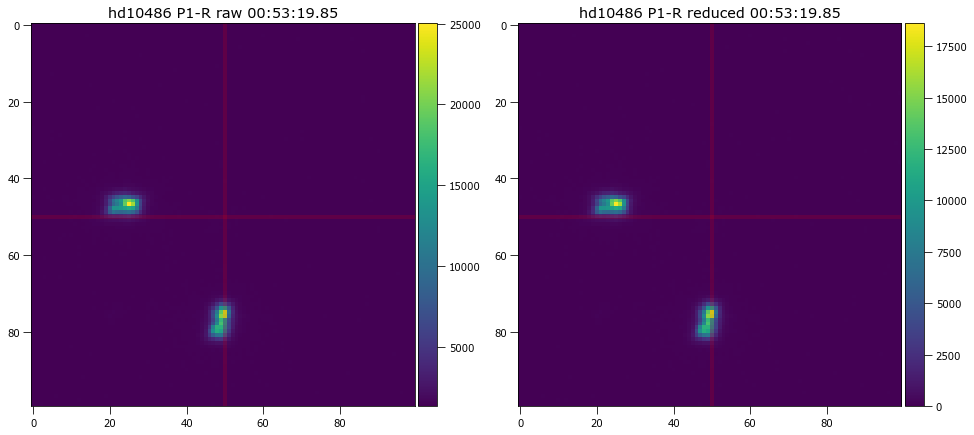

<Figure size 1008x1008 with 0 Axes>

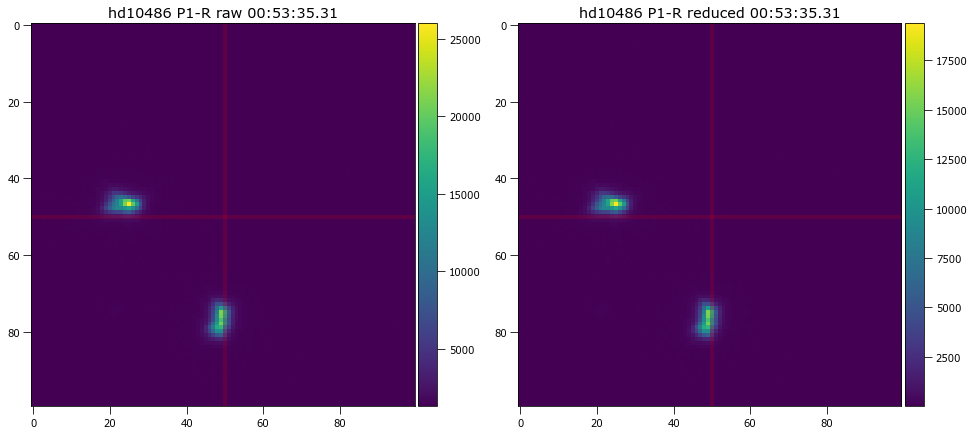

<Figure size 1008x1008 with 0 Axes>

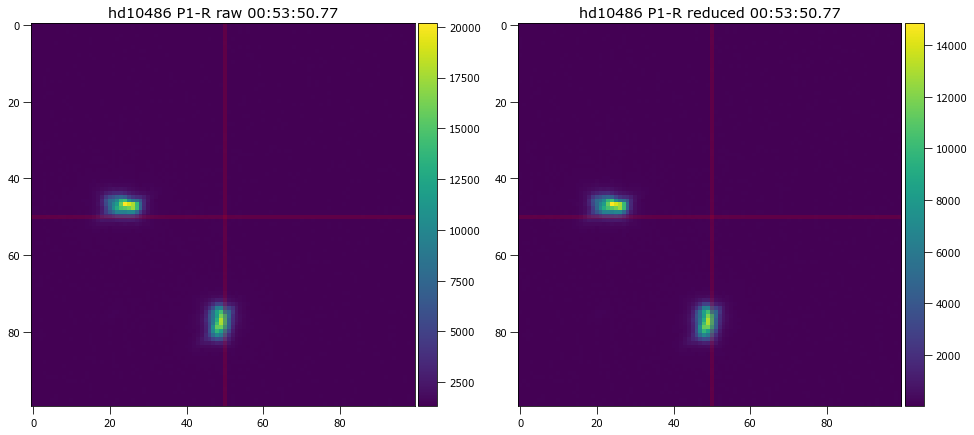

<Figure size 1008x1008 with 0 Axes>

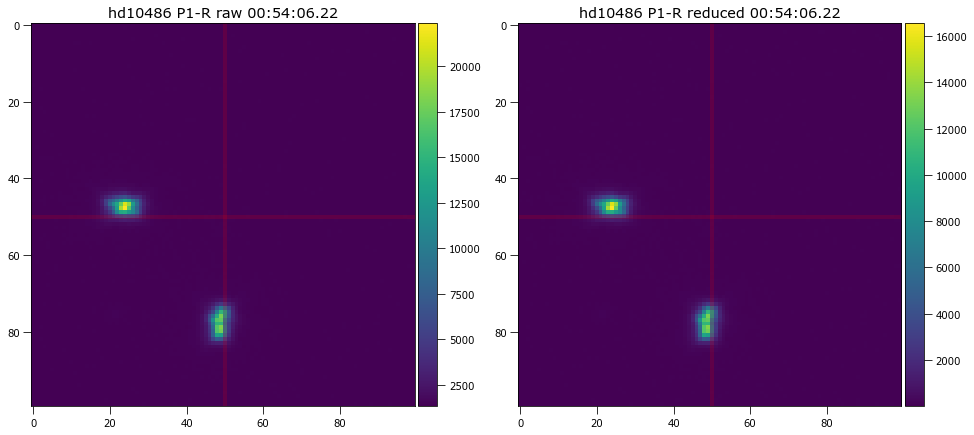

<Figure size 1008x1008 with 0 Axes>

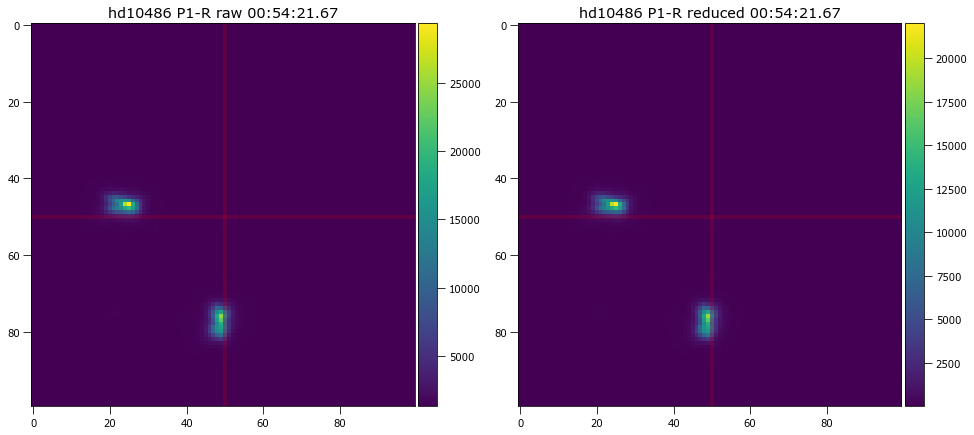

<Figure size 1008x1008 with 0 Axes>

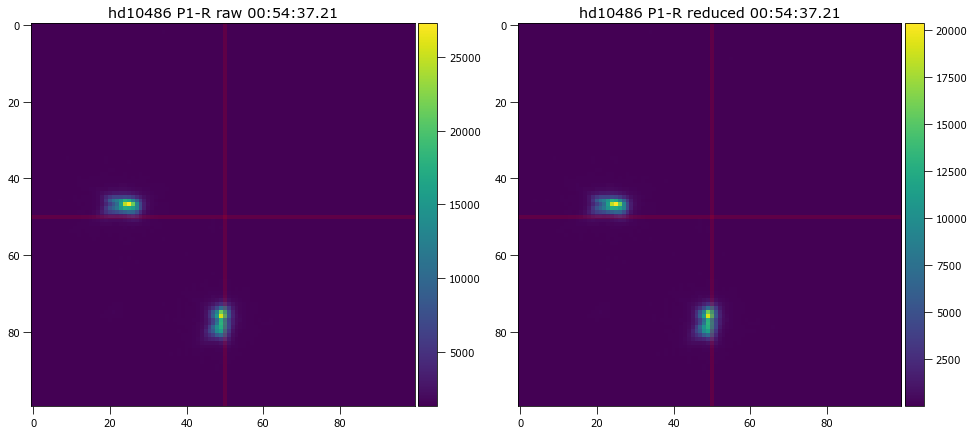

<Figure size 1008x1008 with 0 Axes>

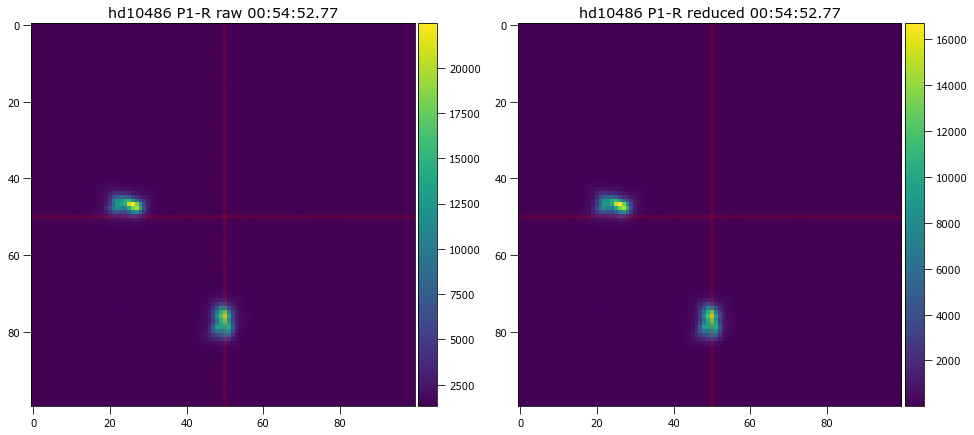

<Figure size 1008x1008 with 0 Axes>

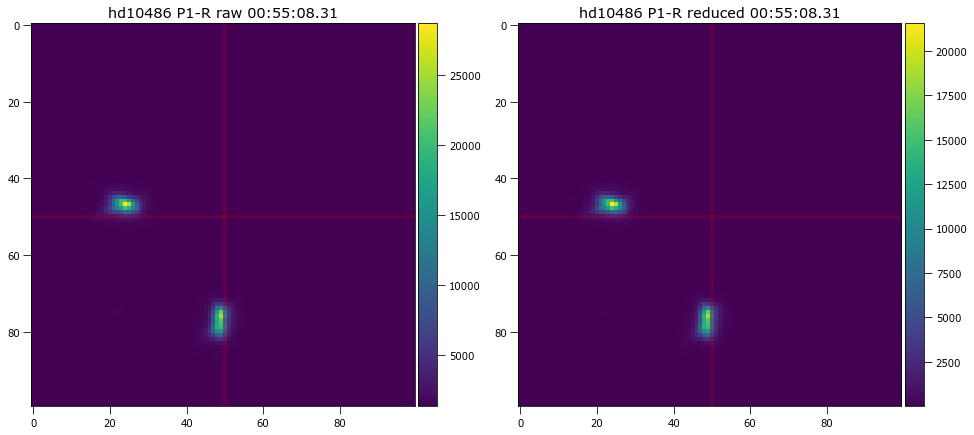

<Figure size 1008x1008 with 0 Axes>

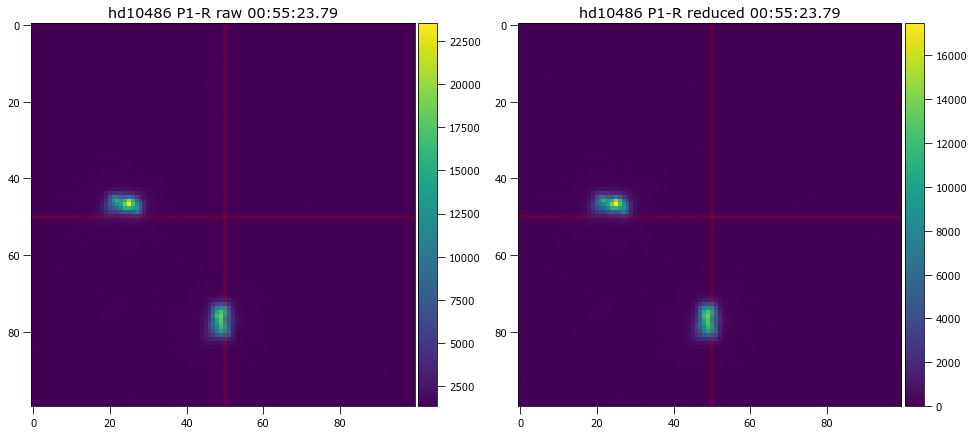

<Figure size 1008x1008 with 0 Axes>

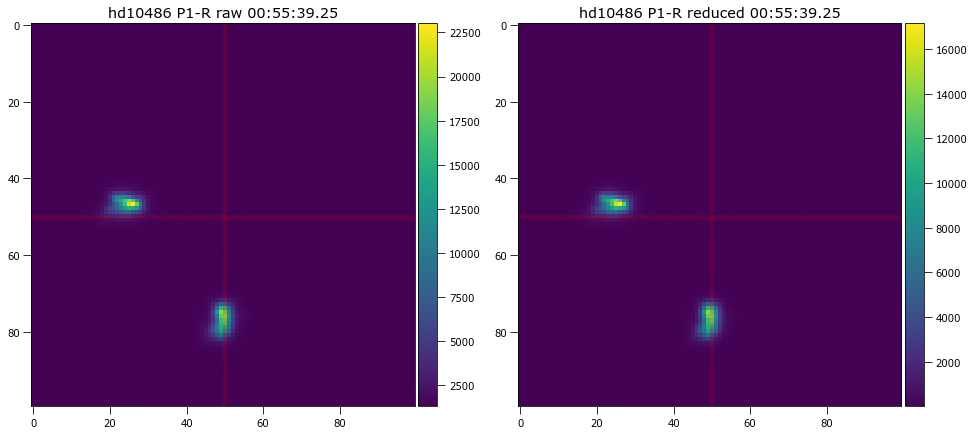

<Figure size 1008x1008 with 0 Axes>

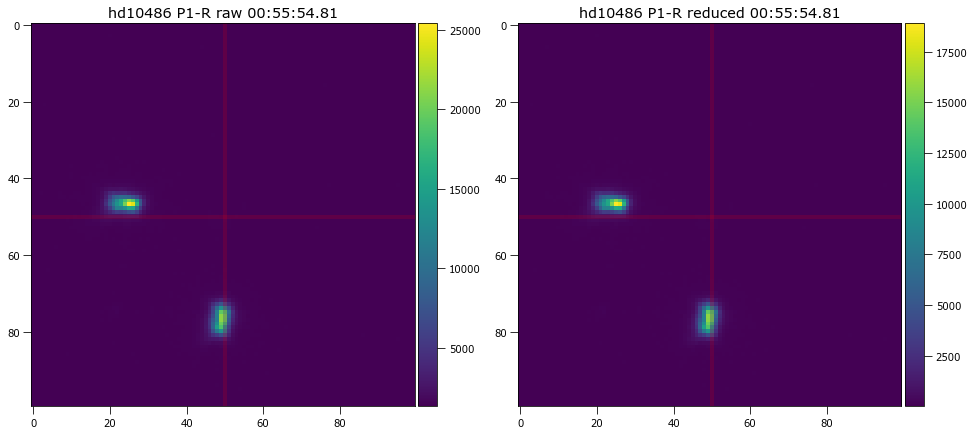

<Figure size 1008x1008 with 0 Axes>

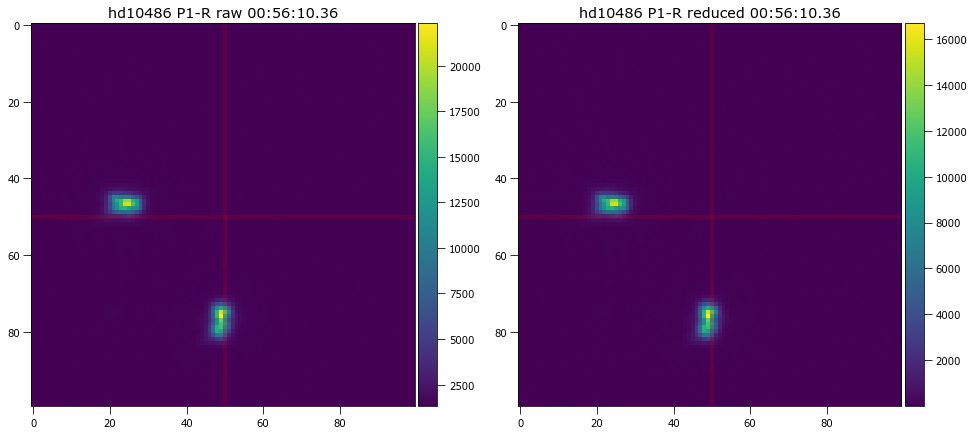

<Figure size 1008x1008 with 0 Axes>

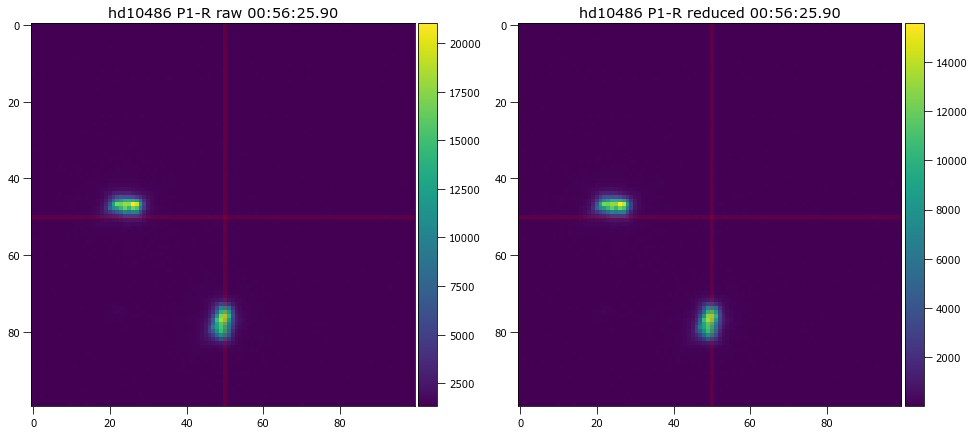

<Figure size 1008x1008 with 0 Axes>

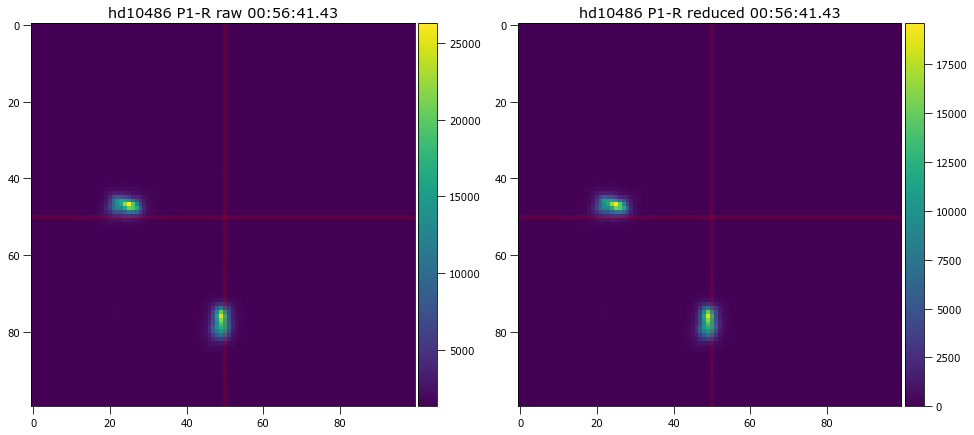

<Figure size 1008x1008 with 0 Axes>

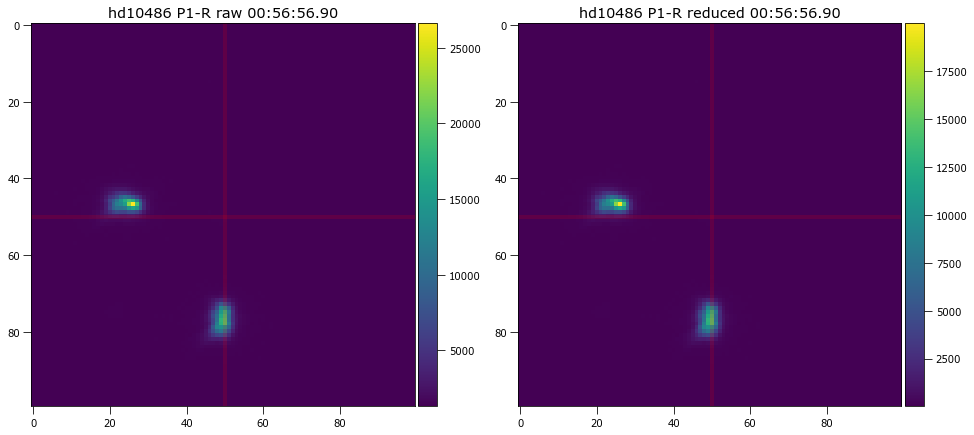

<Figure size 1008x1008 with 0 Axes>

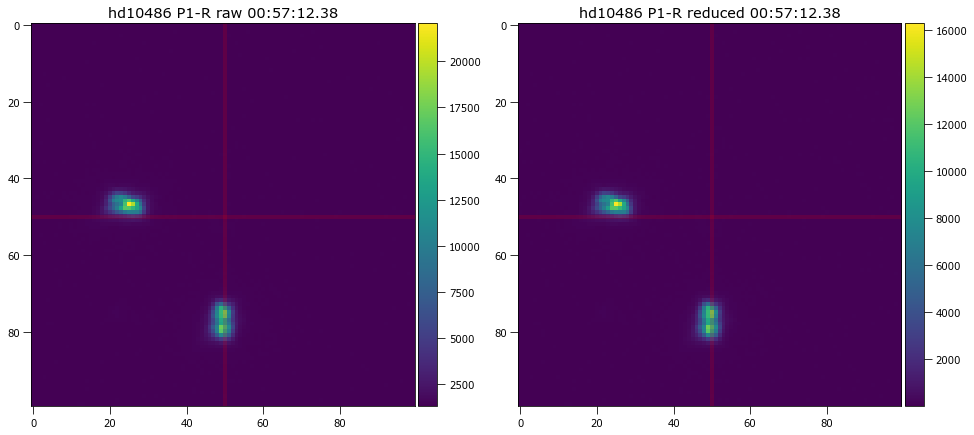

<Figure size 1008x1008 with 0 Axes>

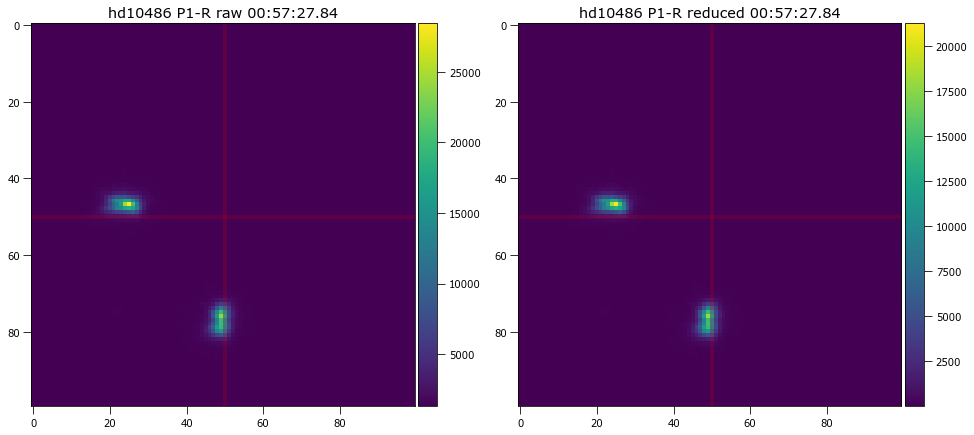

<Figure size 1008x1008 with 0 Axes>

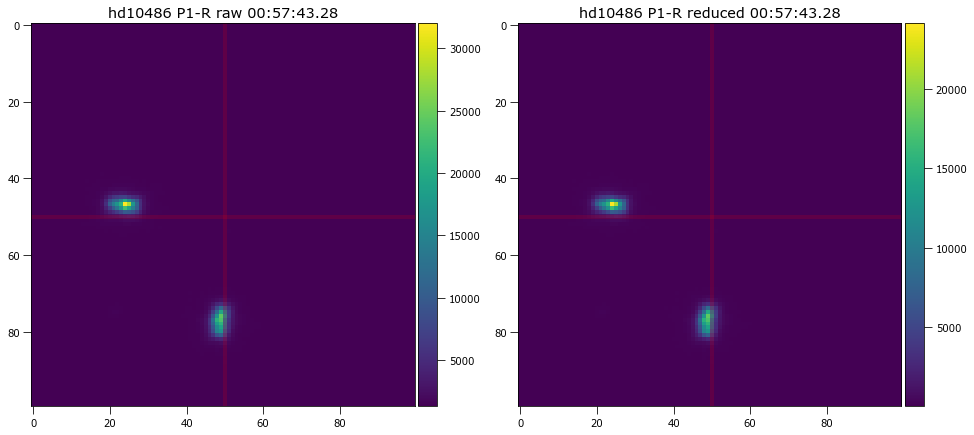

<Figure size 1008x1008 with 0 Axes>

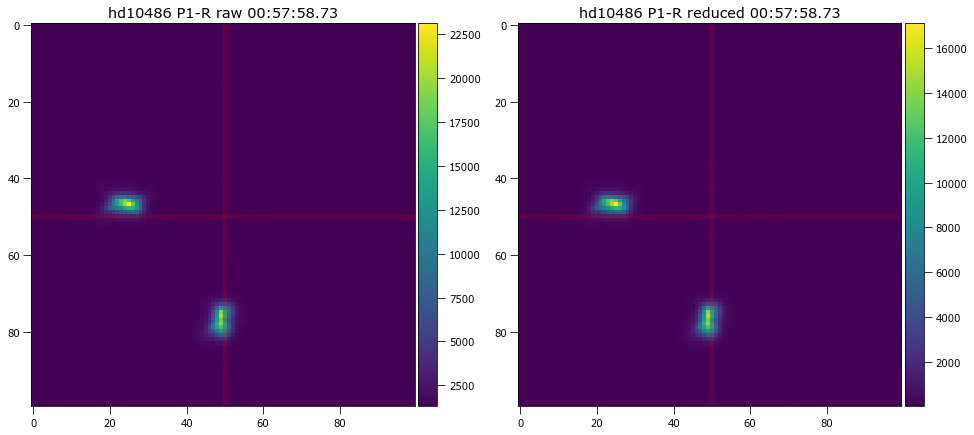

<Figure size 1008x1008 with 0 Axes>

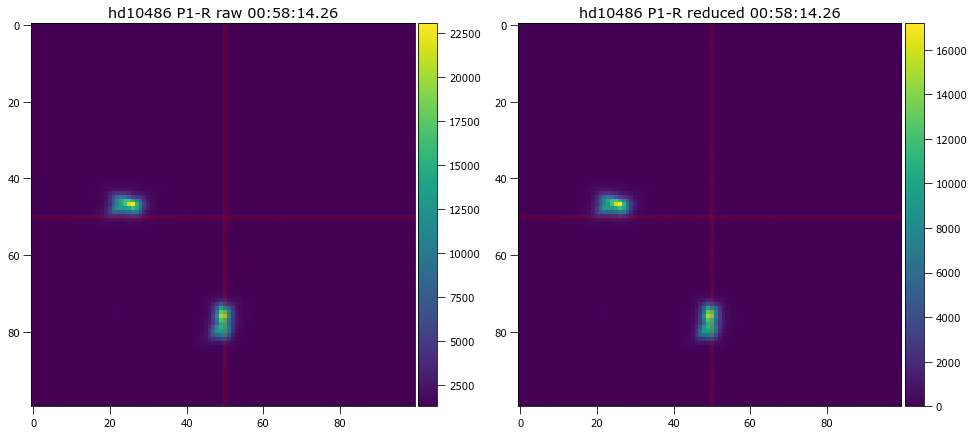

<Figure size 1008x1008 with 0 Axes>

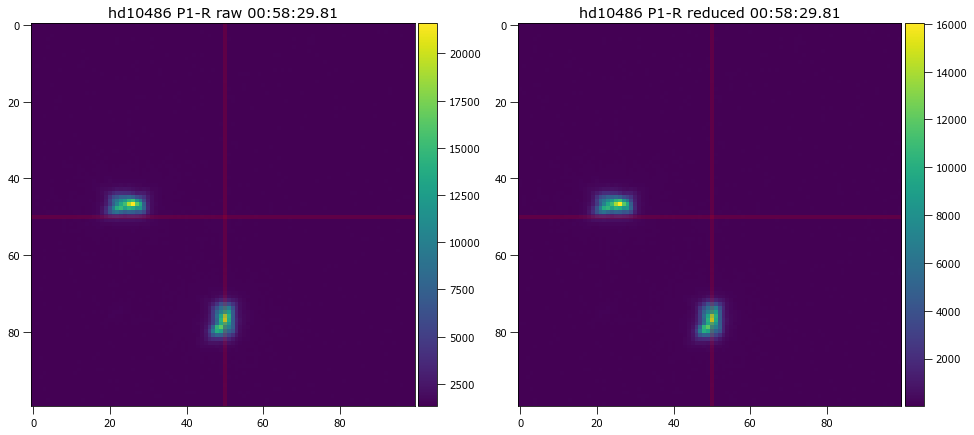

<Figure size 1008x1008 with 0 Axes>

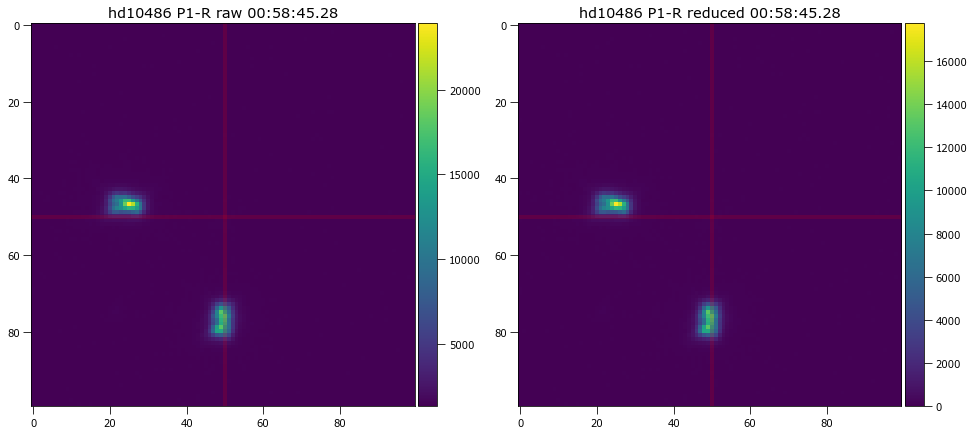

<Figure size 1008x1008 with 0 Axes>

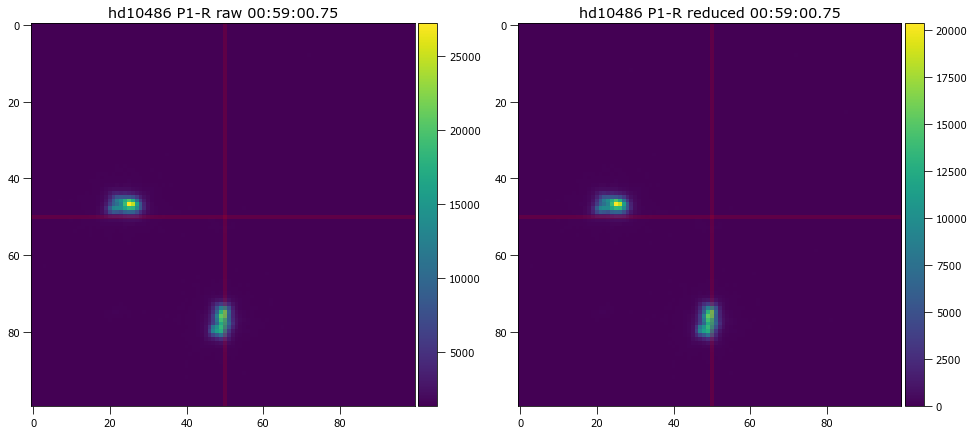

<Figure size 1008x1008 with 0 Axes>

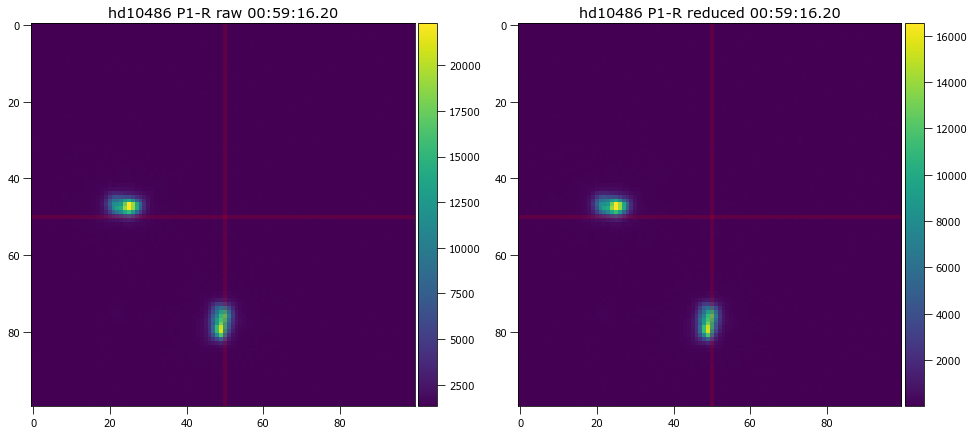

<Figure size 1008x1008 with 0 Axes>

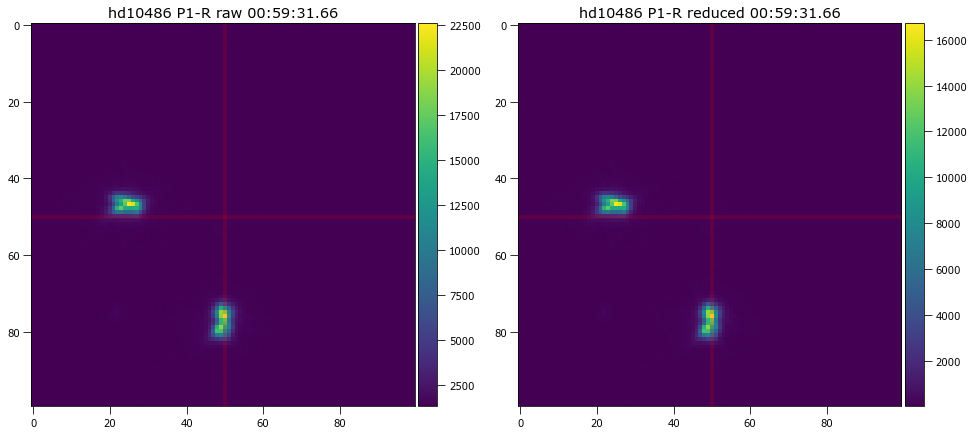

<Figure size 1008x1008 with 0 Axes>

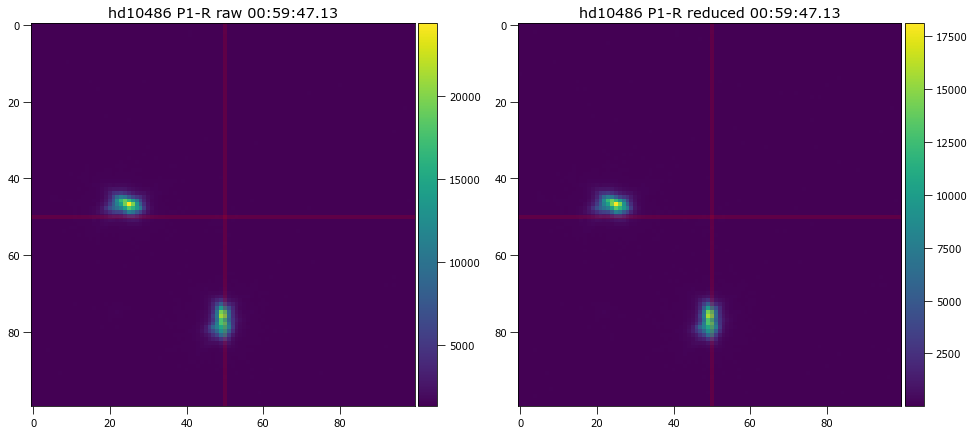

<Figure size 1008x1008 with 0 Axes>

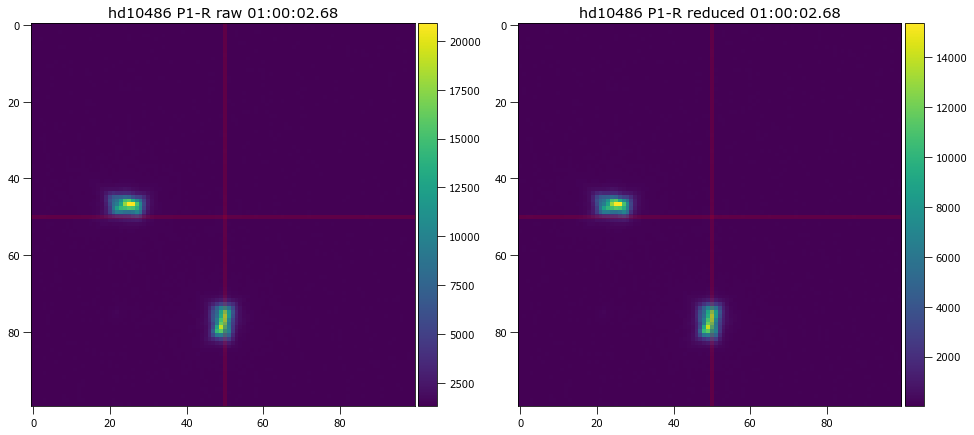

<Figure size 1008x1008 with 0 Axes>

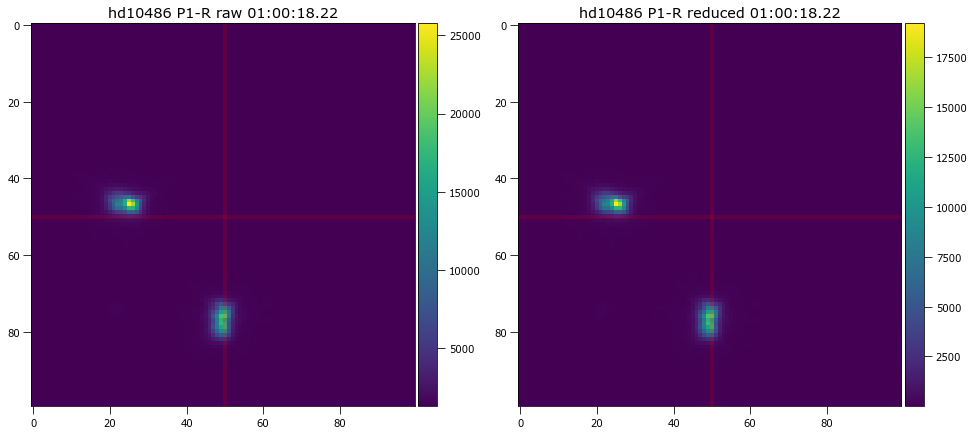

<Figure size 1008x1008 with 0 Axes>

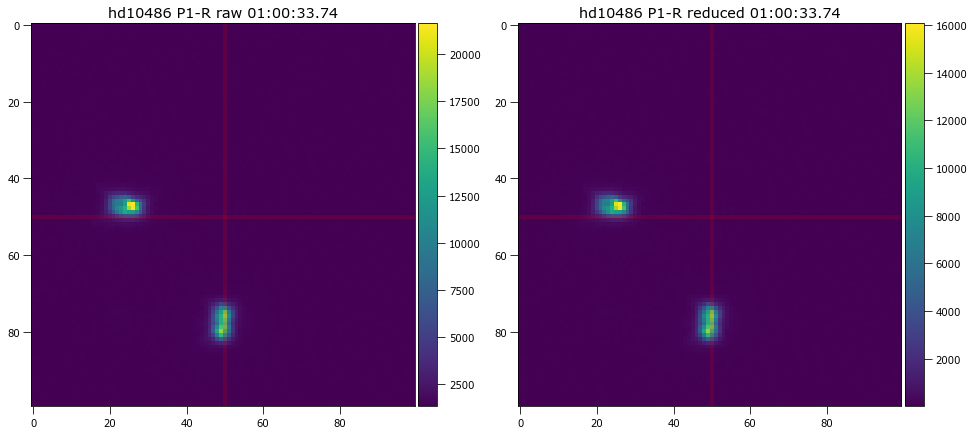

<Figure size 1008x1008 with 0 Axes>

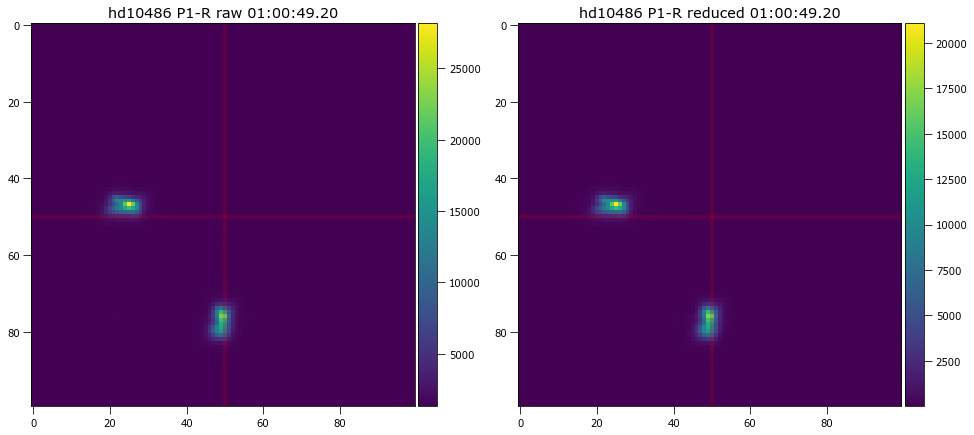

<Figure size 1008x1008 with 0 Axes>

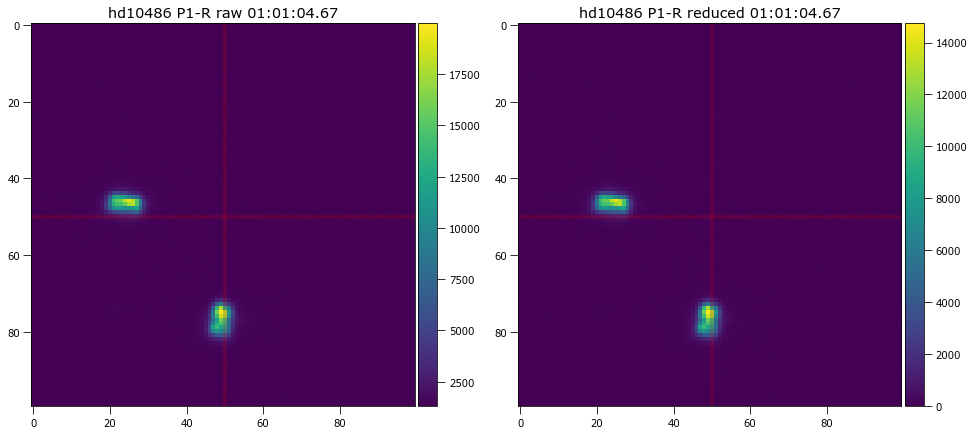

<Figure size 1008x1008 with 0 Axes>

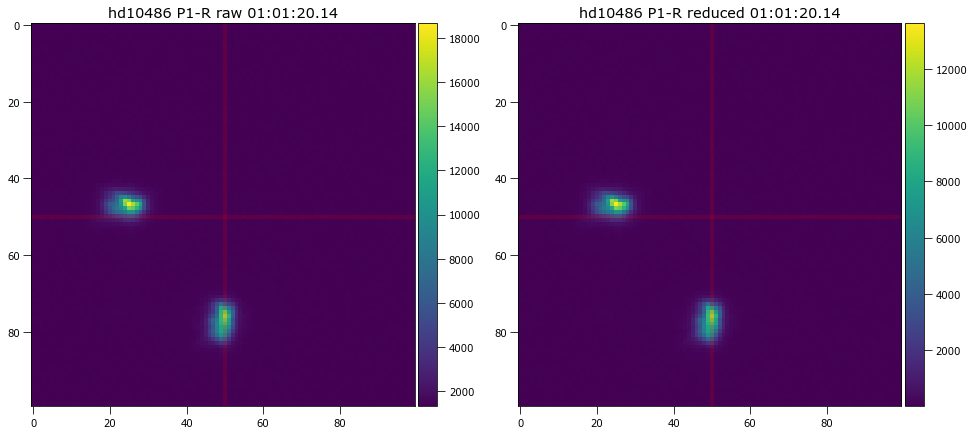

<Figure size 1008x1008 with 0 Axes>

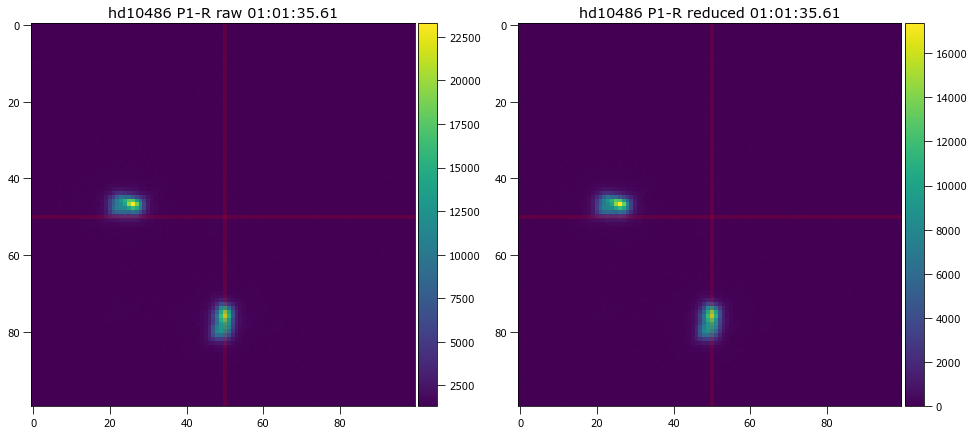

<Figure size 1008x1008 with 0 Axes>

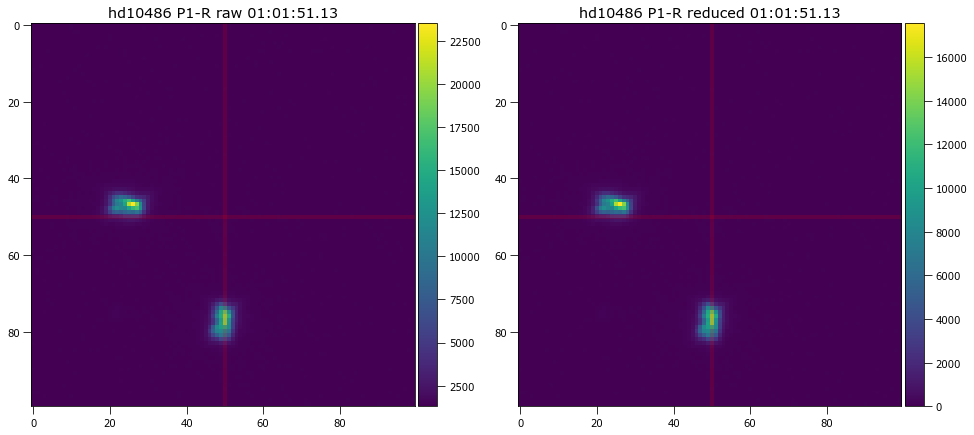

<Figure size 1008x1008 with 0 Axes>

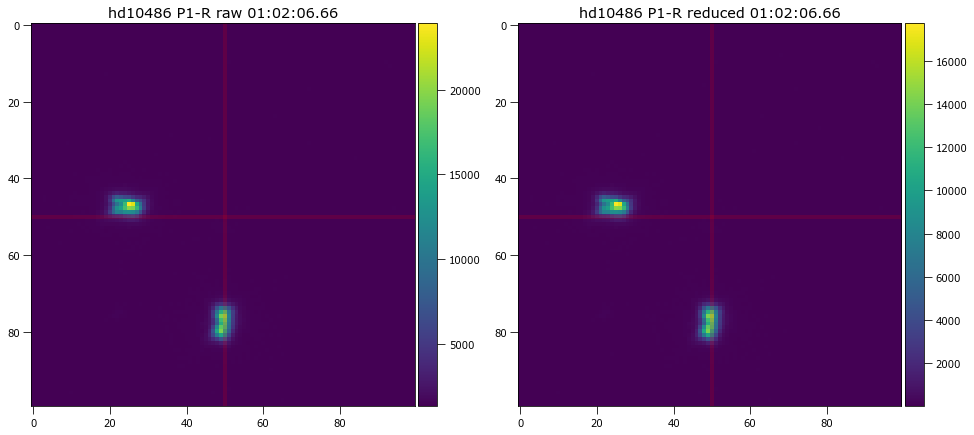

<Figure size 1008x1008 with 0 Axes>

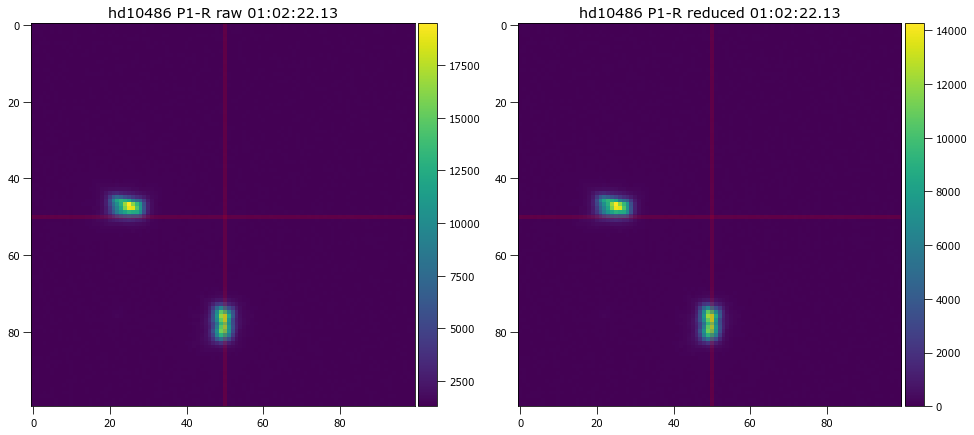

<Figure size 1008x1008 with 0 Axes>

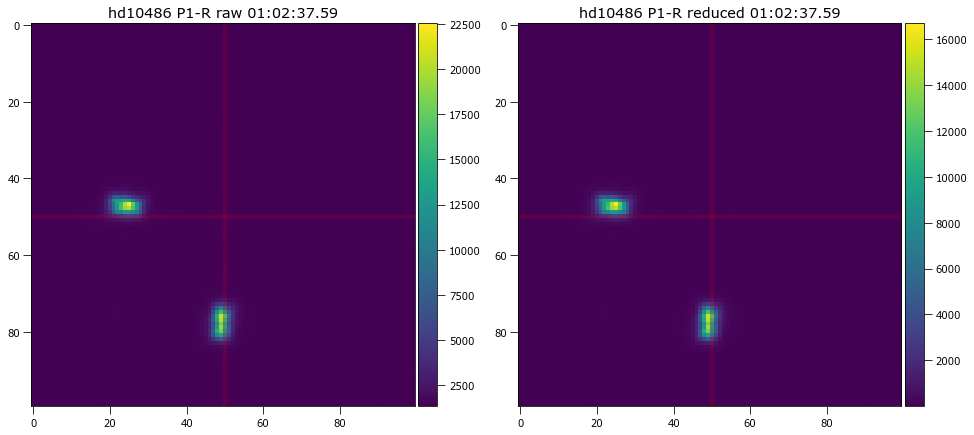

<Figure size 1008x1008 with 0 Axes>

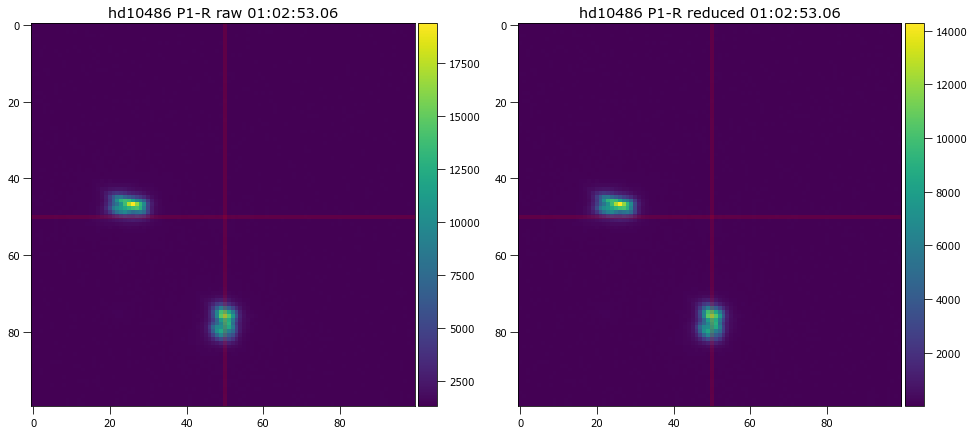

<Figure size 1008x1008 with 0 Axes>

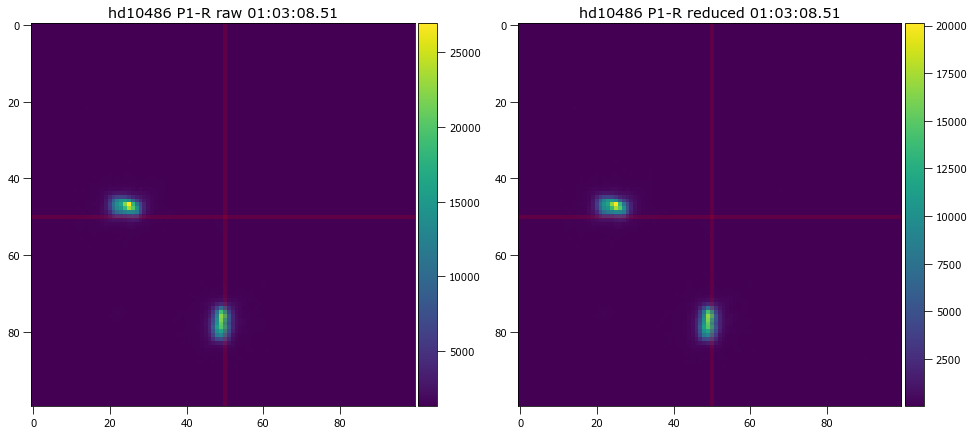

<Figure size 1008x1008 with 0 Axes>

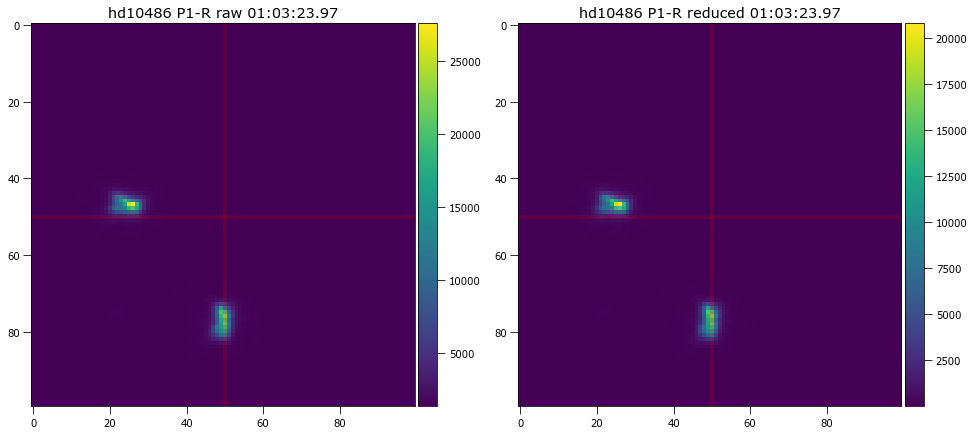

<Figure size 1008x1008 with 0 Axes>

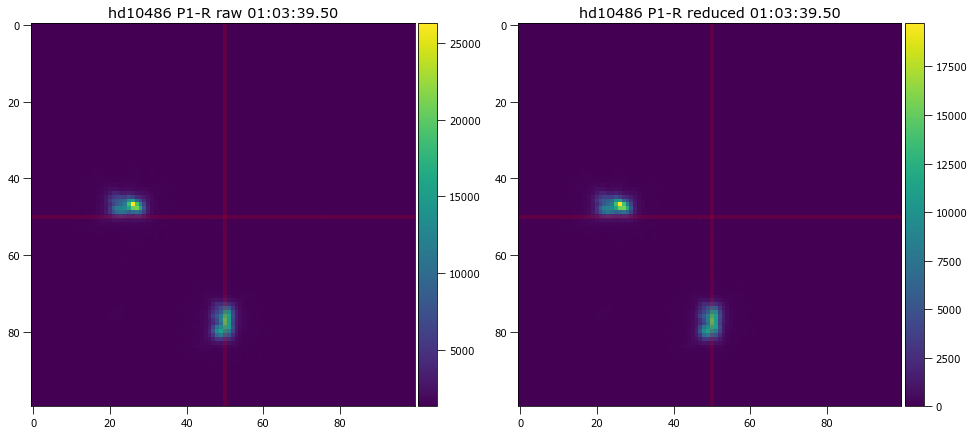

<Figure size 1008x1008 with 0 Axes>

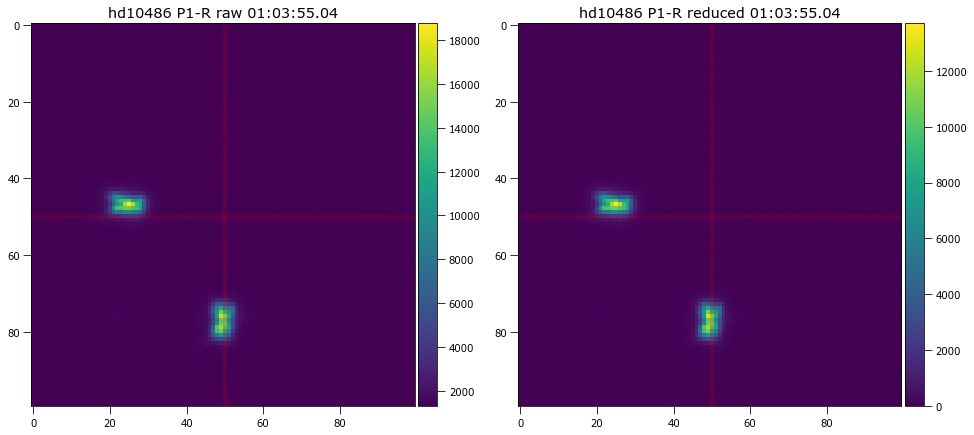

<Figure size 1008x1008 with 0 Axes>

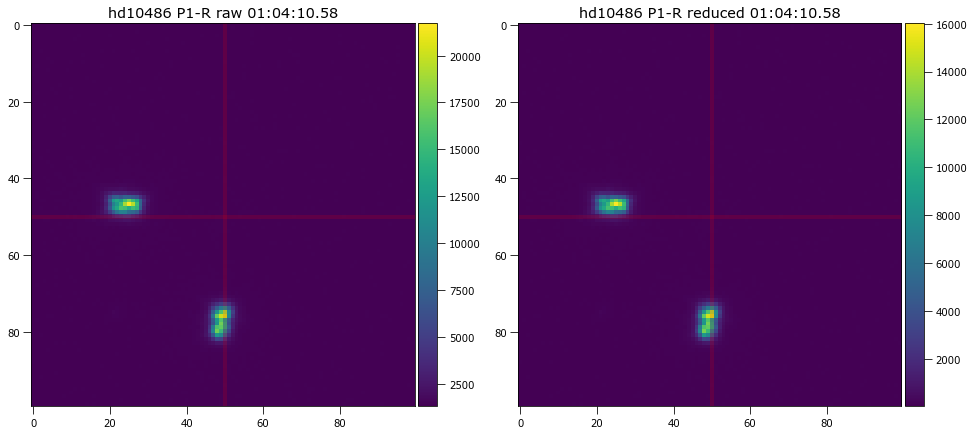

<Figure size 1008x1008 with 0 Axes>

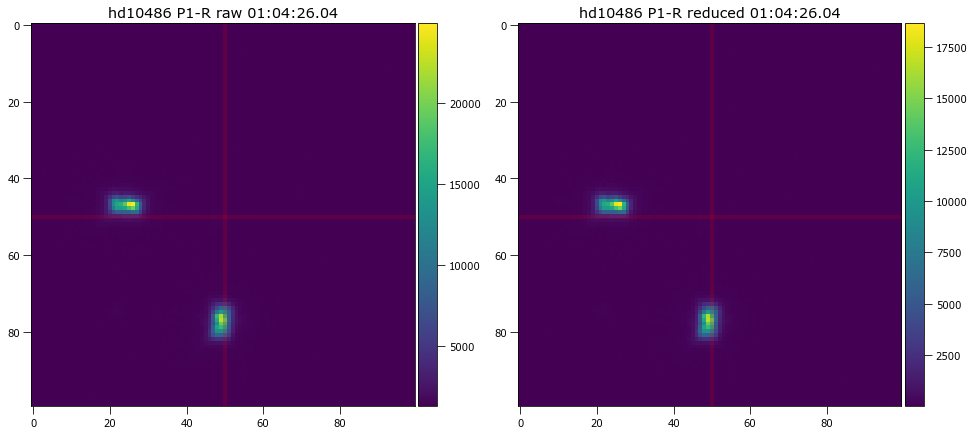

<Figure size 1008x1008 with 0 Axes>

In [22]:
for i in range(290, 340):
    reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(target[i]),
                                    [512, 512, 50, 50], 
                                    (m_biast, m_dark, m_flat),
                                    False, True, True) 
    
    #reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(target[i]),
    #                                    [512, 512, 512, 512], 
    #                                    (m_biast, m_dark, m_flat), 
    #                                    True, True, True)
    
    #reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(target[i]),
    #                                    [512, 512, 512, 512], 
    #                                    (m_biast, m_dark, m_flat), 
    #                                    False, True, True) 

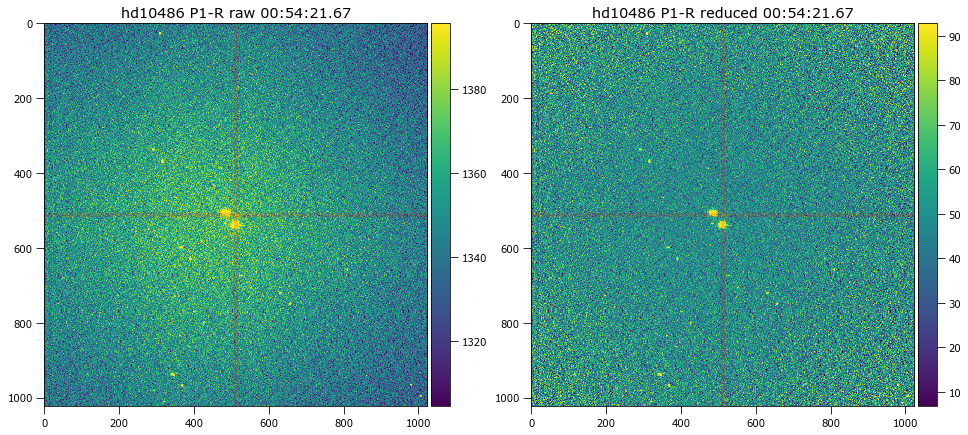

<Figure size 1008x1008 with 0 Axes>

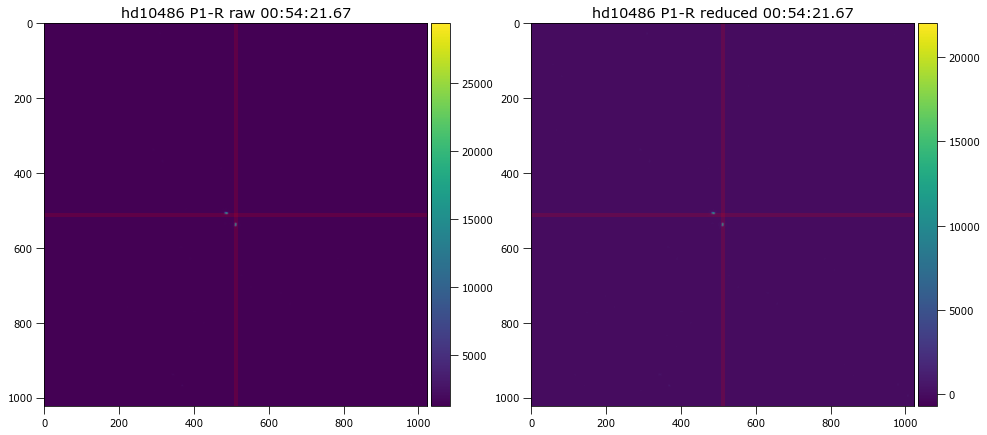

<Figure size 1008x1008 with 0 Axes>

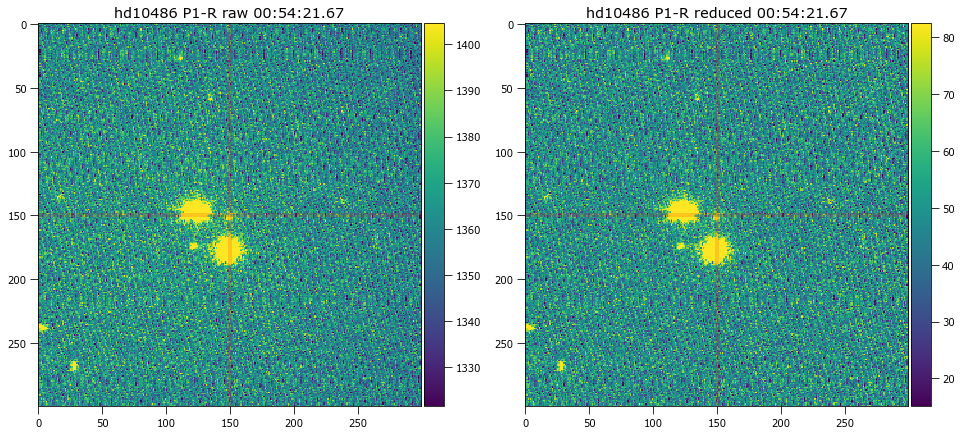

<Figure size 1008x1008 with 0 Axes>

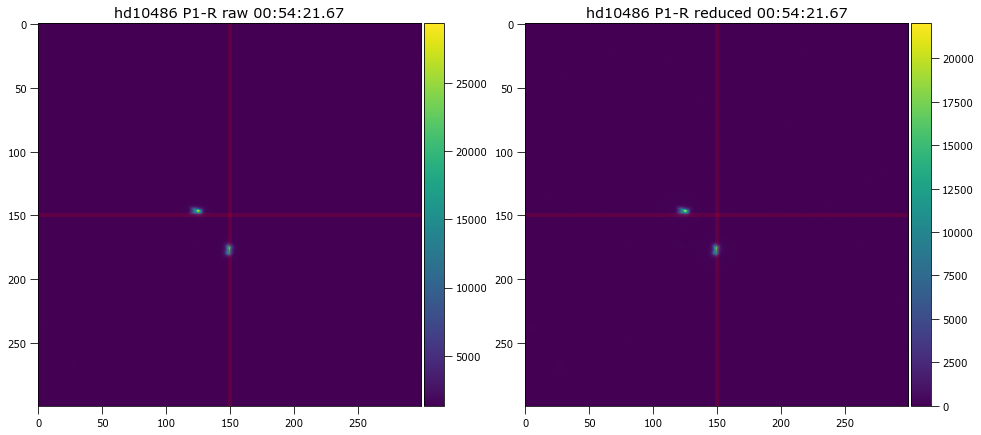

<Figure size 1008x1008 with 0 Axes>

In [23]:
#37 #40 #42
#If target not detected by DAO, use the location of the peak finder...
#your pipeline is macklunky. but it works
target_n=300

reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(target[target_n]),
                                    [512, 512, 512, 512], 
                                    (m_biast, m_dark, m_flat), 
                                    True, True, True) 

reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(target[target_n]),
                                    [512, 512, 512, 512], 
                                    (m_biast, m_dark, m_flat), 
                                    False, True, True) 

reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(target[target_n]),
                                    [512, 512, 150, 150], 
                                    (m_biast, m_dark, m_flat), 
                                    True, True, True) 

reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(target[target_n]),
                                    [512, 512, 150, 150], 
                                    (m_biast, m_dark, m_flat),
                                    False, True, True) 

In [ ]:
#I'm looking at the pol std star through a p1 - r filter

13 peaks detected from image of size 1024 x 1024 with sigma: 5 and threshold: 1151.6509911605315 valid
Targets within region of interest:  2


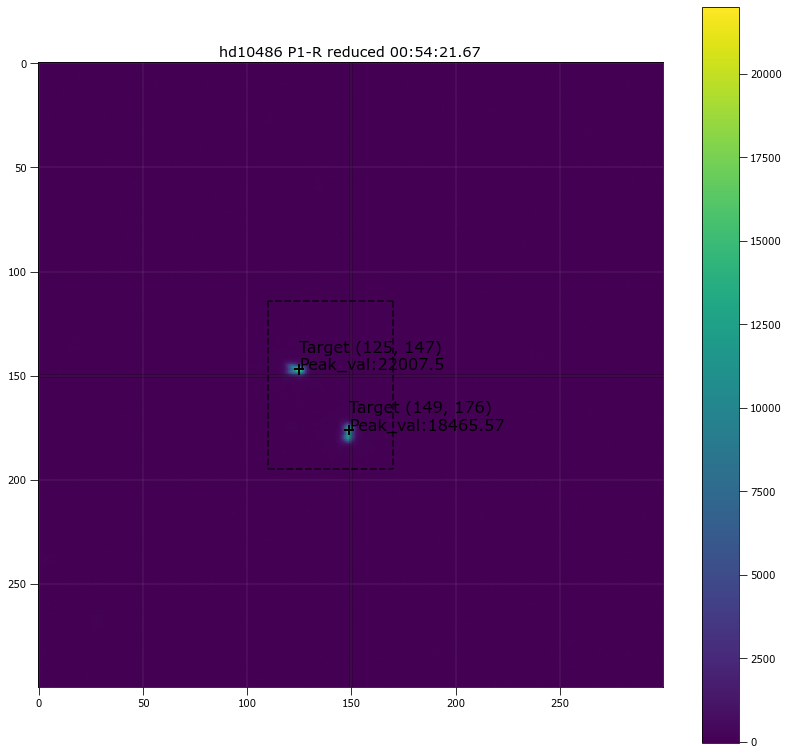

Aperture positions are: [(487, 509), (511, 538)] from the 1024 x 1024 image
Aperture positions are: [(125, 147), (149, 176)] from the 150 x 150 image


In [24]:
search_off = 150
search_bracket = [36, 45, 40, 20]
x_targ, y_targ, peak_targ  = funcs_star_finder.source_peak_finder(reduced_obj,5,search_bracket, 1000 , False, True) #what do I return from this?
apt_pos = funcs_star_finder.plot_spotted(reduced_obj, search_off, search_bracket,x_targ, y_targ, peak_targ, True, False)

apt_positions = []
for h in range(0 , len(x_targ)):
    apt_positions.append((x_targ[h], y_targ[h])) #This must undergo some translation    
    
print("Aperture positions are:", apt_positions, "from the", reduced_obj[0].header['NAXIS1'], "x", reduced_obj[0].header['NAXIS2'], "image")
print("Aperture positions are:", apt_pos, "from the", str(search_off), "x", str(search_off) ,"image")

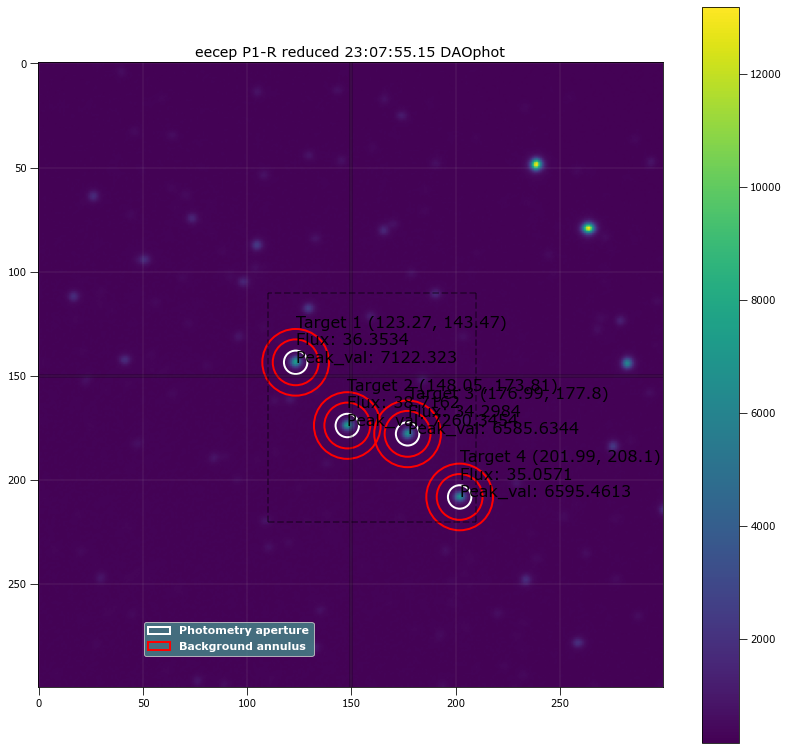

In [56]:
#DAO star finder
siegma_search = 3
DAO_positions = funcs_star_finder.dao_star_finder(reduced_obj, search_bracket, siegma_search , 2000, 150, 5.62, 11 , 16, True, False) #siegma and offset
#print("Positions of aperture from DAO",DAO_positions, "within the region of interest")
#phot_tab = funcs_apt_phot.apt_phot_local_bkg_sub(reduced_obj, 100, DAO_positions,  5.62, 11 , 17, False  )

In [57]:
#Its like an injection, make the output of the first star finder equal to the input of DAO starfinder

print("Results of the First Star Finder:")
print(apt_positions, "aperture positions from the", reduced_obj[0].header['NAXIS1'], "x", reduced_obj[0].header['NAXIS2'], "image")
print(apt_pos, "aperture positions from the", str(search_off), "x", str(search_off) ,"image")
print("\n")
print([list(x) for x in  DAO_positions], "\naperture positions from DAO positions")

Results of the First Star Finder:
[(485, 505), (510, 536), (539, 540), (564, 570)] aperture positions from the 1024 x 1024 image
[(123, 143), (148, 174), (177, 178), (202, 208)] aperture positions from the 150 x 150 image


[[123.2675201532751, 143.46627533197469], [148.05382209073528, 173.80566469317804], [176.99192622479873, 177.80284871966387], [201.98723047621854, 208.09942845425388]] 
aperture positions from DAO positions


Good radii: 4.559322033898305


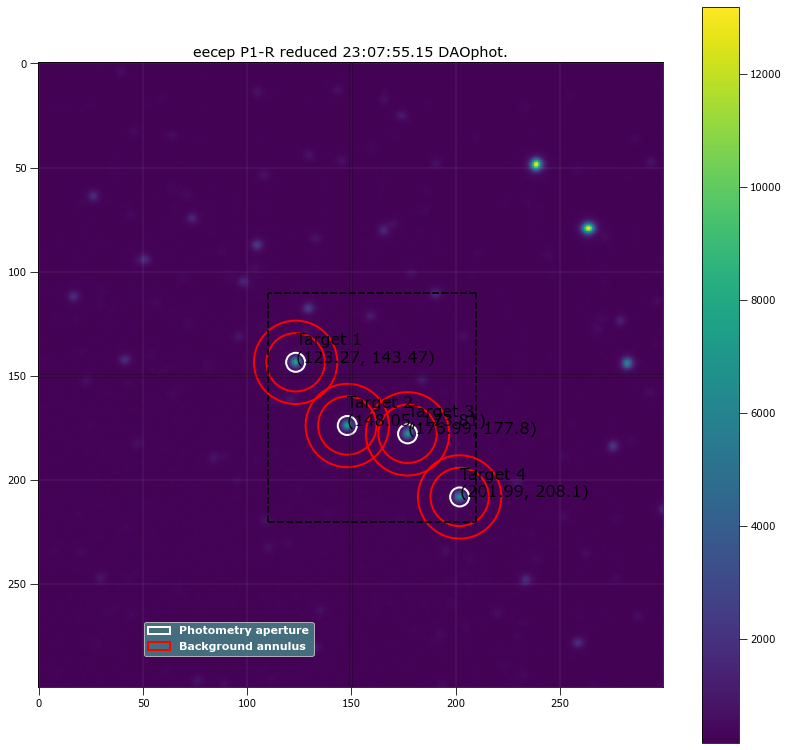

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 123.26752 143.46628 ...          2367.7118      182906.52          750.76198
  2 148.05382 173.80566 ...          2370.4181      165023.63          654.95787
  3 176.99193 177.80285 ...          2113.8525         162437          643.42809
  4 201.98723 208.09943 ...          2103.9078      165107.25          654.94492

 Aperture are: 65.30559781856107 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 123.26752 143.46628 ...                 2291.2098             131098.74
  2 148.05382 173.80566 ...                 2303.6785        

In [59]:
trial_radii = np.linspace(3.0, 7, num=60) #tries different radii
target_a = []
target_b = []
target_c = []
target_d = []

for radii in trial_radii:
    #Its this loop thats taking up the compute time
    DAO_positions = funcs_star_finder.dao_star_finder(reduced_obj, search_bracket, siegma_search , 2500, 150, 5.62, 11 , 16, False, False) 
    
    #print("DAO positions original:", len(DAO_positions) )
    
    if (len(DAO_positions) != 4):
        DAO_positions = funcs_star_finder.peak_to_DAO(apt_pos)
    
    #print("New DAO positions:", len(DAO_positions))
    
    phot_tab = funcs_apt_phot.apt_phot_local_bkg_sub(reduced_obj, 150,search_bracket , DAO_positions, radii, 14 , 20, False,False)
    target_a.append(phot_tab['residual_aperture_sum'][0])
    target_b.append(phot_tab['residual_aperture_sum'][1])
    target_c.append(phot_tab['residual_aperture_sum'][2])
    target_d.append(phot_tab['residual_aperture_sum'][3])
    
combine_target = [target_a, target_b, target_c, target_d]

good_radii=funcs_apt_phot.solve_apt(combine_target, trial_radii, False)

print("Good radii:",good_radii)

phot_tab = funcs_apt_phot.apt_phot_local_bkg_sub(reduced_obj, 150, search_bracket ,DAO_positions,good_radii, 14 , 20, True, False)

In [ ]:
#write an exception. If it cannot find anything. Then reduce the siegma. Or better yet just go for another set of coordinates

#1 and 4, 2 and 3

P1-R Filter
290 object DAO positions: [[125, 147], [149, 176]]
DAO position 1: [125, 147] DAO position 2: [149, 176]


291 object DAO positions: [[125, 147], [149, 176]]
DAO position 1: [125, 147] DAO position 2: [149, 176]


292 object DAO positions: [[125, 147], [149, 176]]
DAO position 1: [125, 147] DAO position 2: [149, 176]


293 object DAO positions: [[124, 147], [149, 179]]
DAO position 1: [124, 147] DAO position 2: [149, 179]


294 object DAO positions: [[125, 147], [149, 176]]
DAO position 1: [125, 147] DAO position 2: [149, 176]


295 object DAO positions: [[125, 147], [149, 176]]
DAO position 1: [125, 147] DAO position 2: [149, 176]


296 object DAO positions: [[125, 147], [150, 175]]
DAO position 1: [125, 147] DAO position 2: [150, 175]


297 object DAO positions: [[125, 147], [149, 175]]
DAO position 1: [125, 147] DAO position 2: [149, 175]


298 object DAO positions: [[124, 147], [149, 177]]
DAO position 1: [124, 147] DAO position 2: [149, 177]


299 object DAO positions:

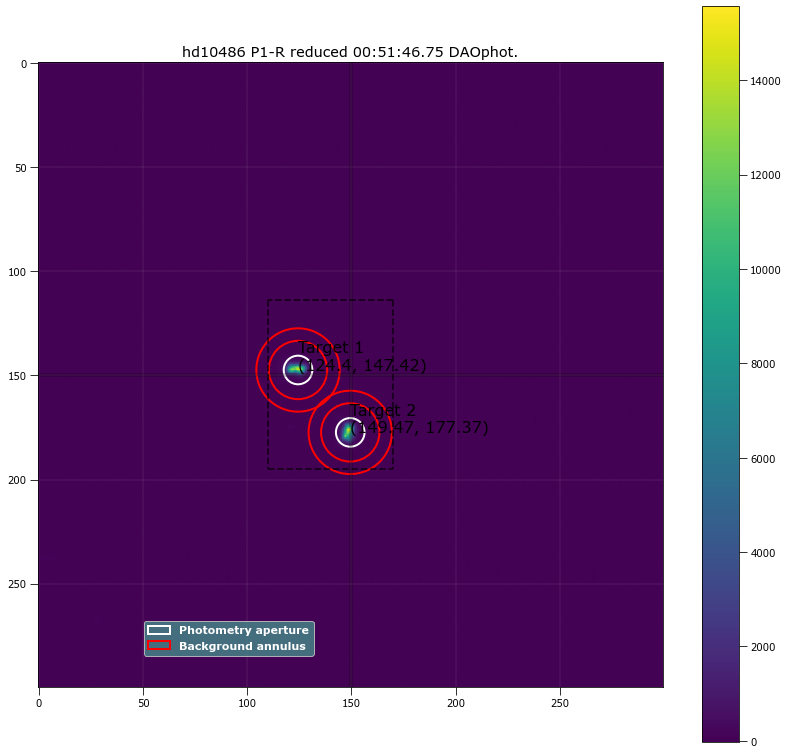

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5538.6787      34906.768          141.32563
  2 149.47129 177.37313 ...          5445.1843      34673.512          140.47189

 Aperture are: 148.03209853635906 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5506.0352             395382.67
  2 149.47129 177.37313 ...                  5412.738             397354.81
290 00:51:46.75 P1-R 2.0 124.40333103606186 147.41991949880224 395382.67403832375 5506.035172775161 149.47128717599713 177.3731318058058 397354.80

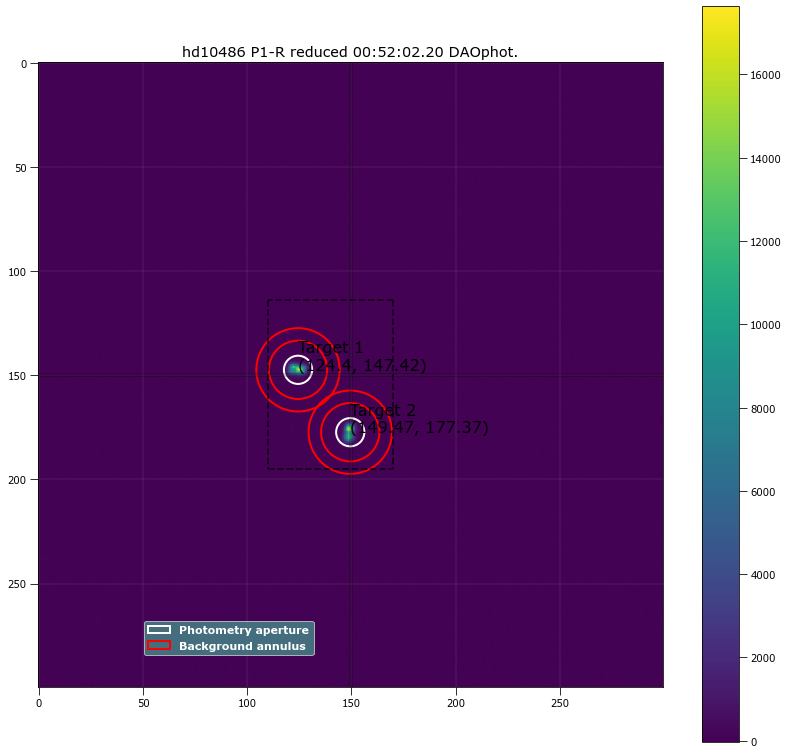

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...           5741.733      34803.334          140.32949
  2 149.47129 177.37313 ...          5791.6128      34362.498          139.20457

 Aperture are: 144.2191043933323 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5710.1545             402948.42
  2 149.47129 177.37313 ...                 5760.2874             402149.32
291 00:52:02.20 P1-R 2.0 124.40333103606186 147.41991949880224 402948.4230976972 5710.154497389552 149.47128717599713 177.3731318058058 402149.3236

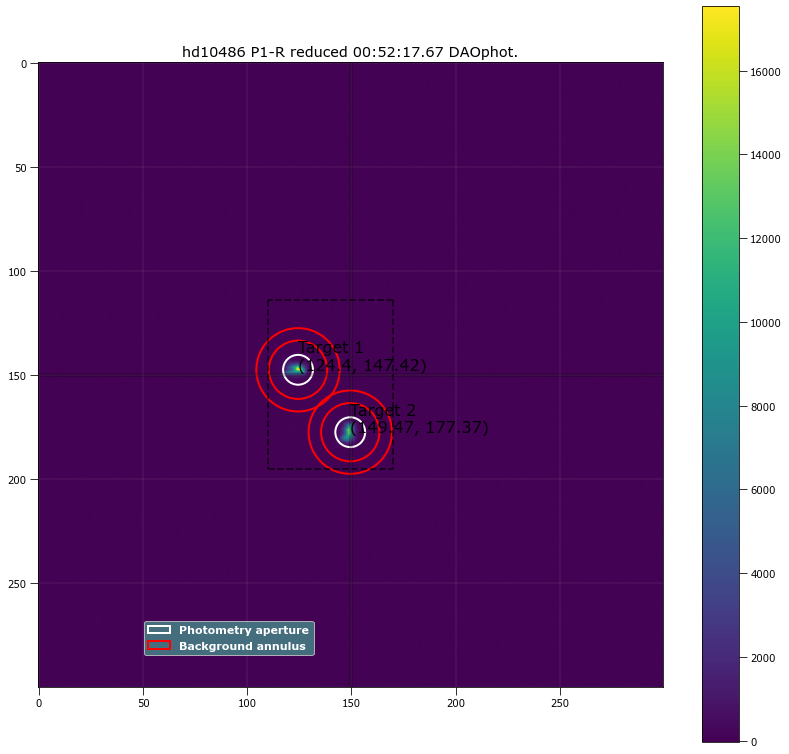

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5433.7814      34779.969          140.86943
  2 149.47129 177.37313 ...          5252.8637      34823.079          140.87344

 Aperture are: 161.10138569947227 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5398.3706             393825.46
  2 149.47129 177.37313 ...                 5217.4518             396259.64
292 00:52:17.67 P1-R 2.0 124.40333103606186 147.41991949880224 393825.4646965293 5398.370593132428 149.47128717599713 177.3731318058058 396259.636

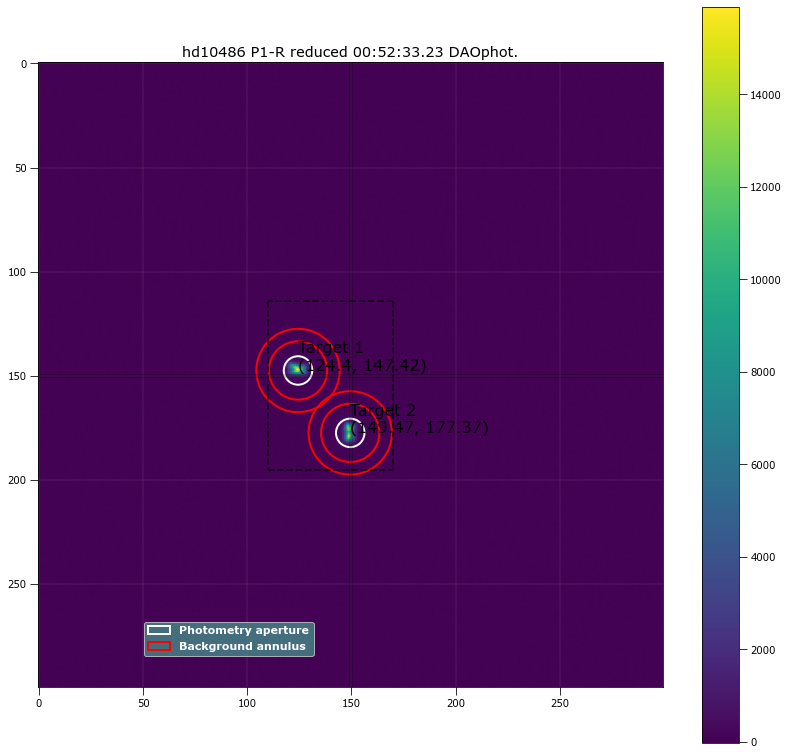

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5419.7449      35262.813          142.57096
  2 149.47129 177.37313 ...          5438.0368      35105.795          141.73439

 Aperture are: 146.75557269350875 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5387.0977             392766.71
  2 149.47129 177.37313 ...                 5405.5812             394116.44
293 00:52:33.23 P1-R 2.0 124.40333103606186 147.41991949880224 392766.7147638236 5387.097687800877 149.47128717599713 177.3731318058058 394116.442

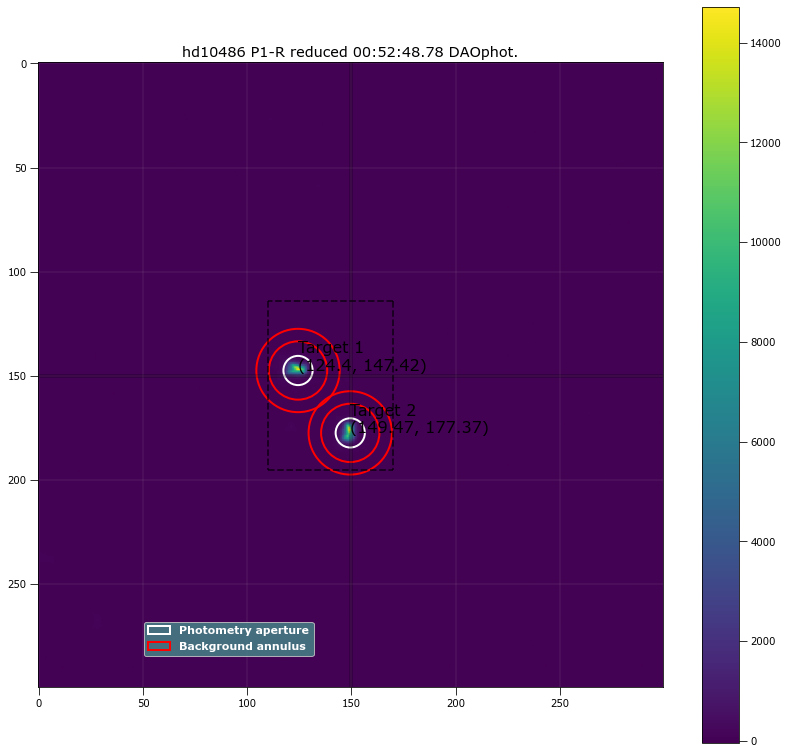

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5206.9873      35403.782          143.07209
  2 149.47129 177.37313 ...          5158.5411      35135.805           142.1527

 Aperture are: 154.49764467823155 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                  5172.497             392571.63
  2 149.47129 177.37313 ...                 5124.2725             392440.55
294 00:52:48.78 P1-R 2.0 124.40333103606186 147.41991949880224 392571.63059480523 5172.497016162306 149.47128717599713 177.3731318058058 392440.55

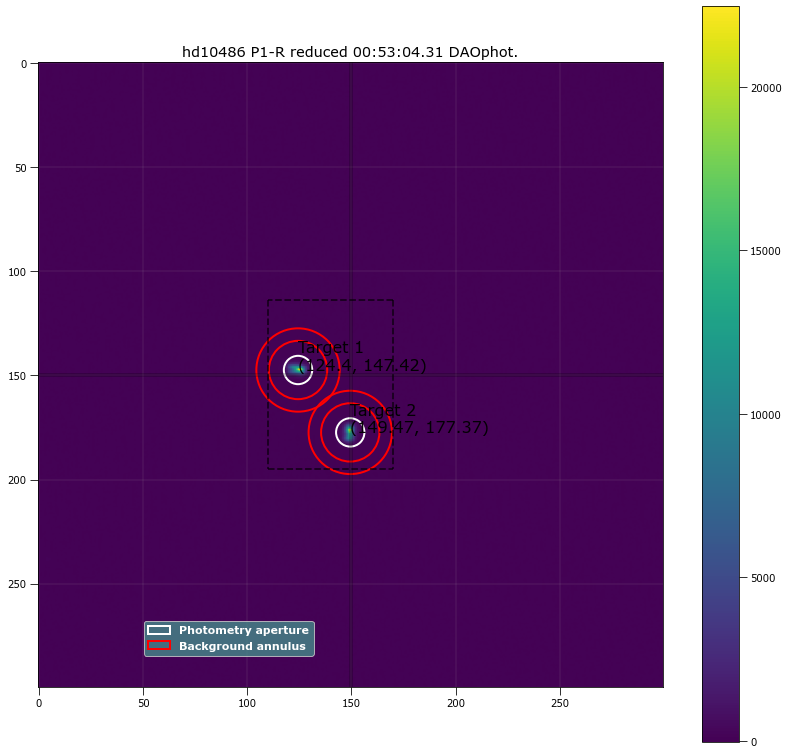

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5973.6856      34669.303          140.13114
  2 149.47129 177.37313 ...          5924.4828      34899.665          141.02034

 Aperture are: 145.48457464583316 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                  5941.875             397174.16
  2 149.47129 177.37313 ...                 5892.4704             399372.11
295 00:53:04.31 P1-R 2.0 124.40333103606186 147.41991949880224 397174.16042821057 5941.875019979009 149.47128717599713 177.3731318058058 399372.11

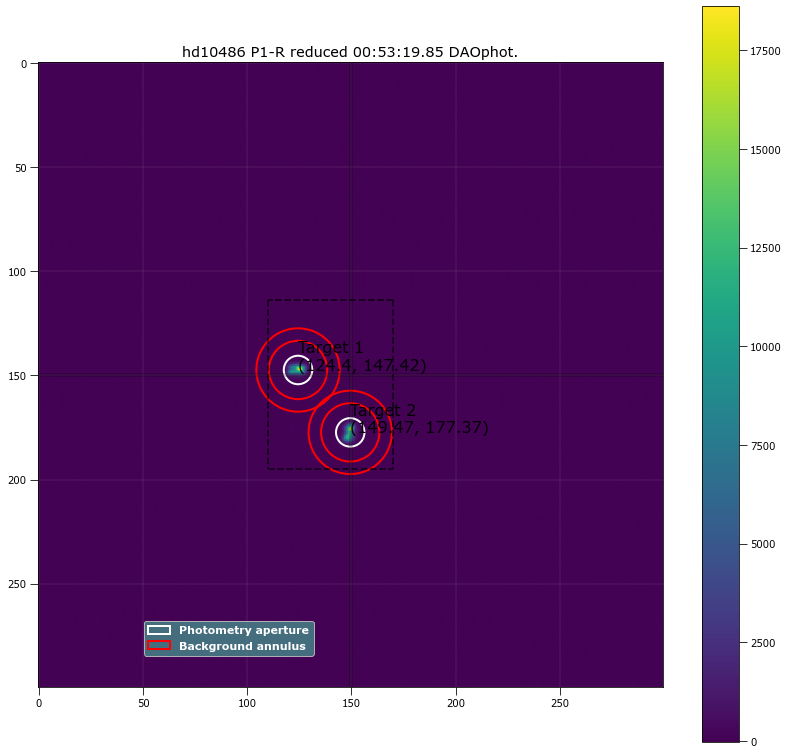

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5788.6837      34559.782          139.55209
  2 149.47129 177.37313 ...          5800.6411      34847.478          140.78595

 Aperture are: 146.75557269350875 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5756.7278             403524.28
  2 149.47129 177.37313 ...                 5768.4027             403784.59
296 00:53:19.85 P1-R 2.0 124.40333103606186 147.41991949880224 403524.2772282684 5756.727832862647 149.47128717599713 177.3731318058058 403784.589

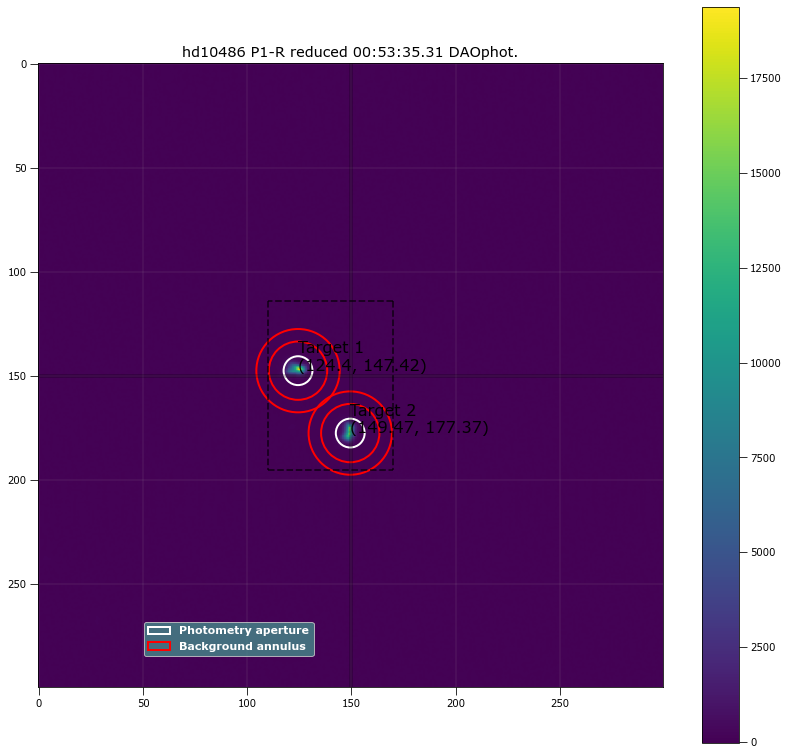

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5701.1458      34407.202          139.29849
  2 149.47129 177.37313 ...          5604.9414      34402.596          139.20646

 Aperture are: 150.6017336075838 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                  5668.412             396370.68
  2 149.47129 177.37313 ...                 5572.2292             398141.87
297 00:53:35.31 P1-R 2.0 124.40333103606186 147.41991949880224 396370.6817080315 5668.412011334292 149.47128717599713 177.3731318058058 398141.8656

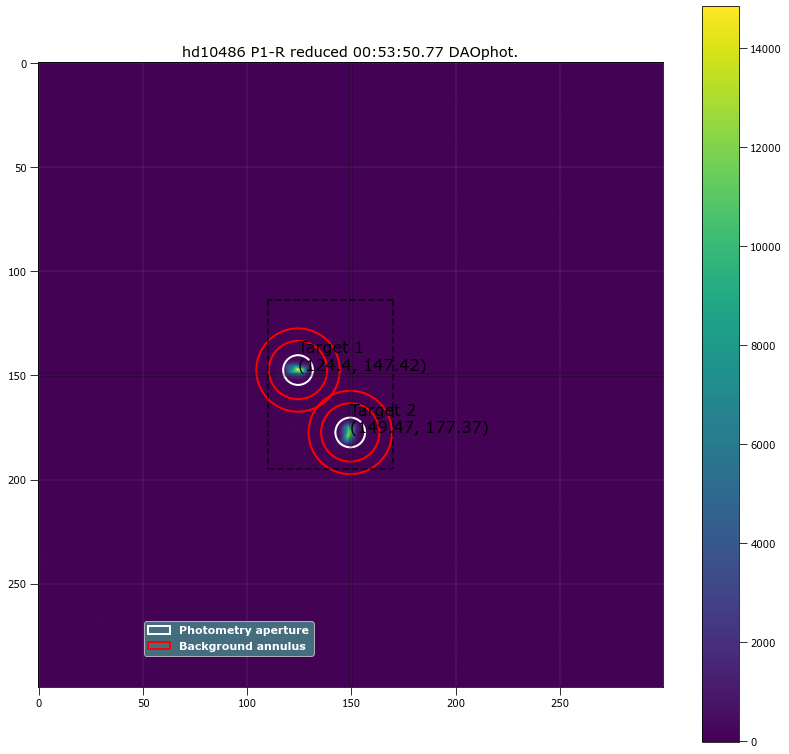

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5253.8283      34970.884          141.45317
  2 149.47129 177.37313 ...          5118.4839      34875.382          141.01315

 Aperture are: 159.76958190487463 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5218.5647              393303.5
  2 149.47129 177.37313 ...                   5083.33             395254.44
298 00:53:50.77 P1-R 2.0 124.40333103606186 147.41991949880224 393303.49577489024 5218.56465788034 149.47128717599713 177.3731318058058 395254.437

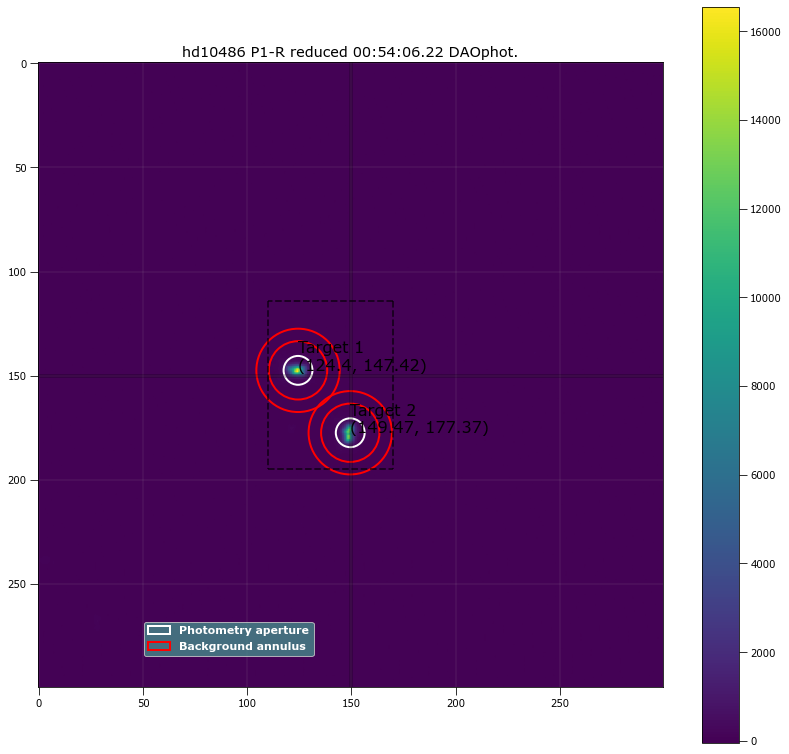

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5412.3649      35808.415          145.19397
  2 149.47129 177.37313 ...          5337.9592      35473.504          143.46702

 Aperture are: 150.6017336075838 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5378.2457             389931.29
  2 149.47129 177.37313 ...                 5304.2459             392713.83
299 00:54:06.22 P1-R 2.0 124.40333103606186 147.41991949880224 389931.28750652843 5378.2457085888245 149.47128717599713 177.3731318058058 392713.82

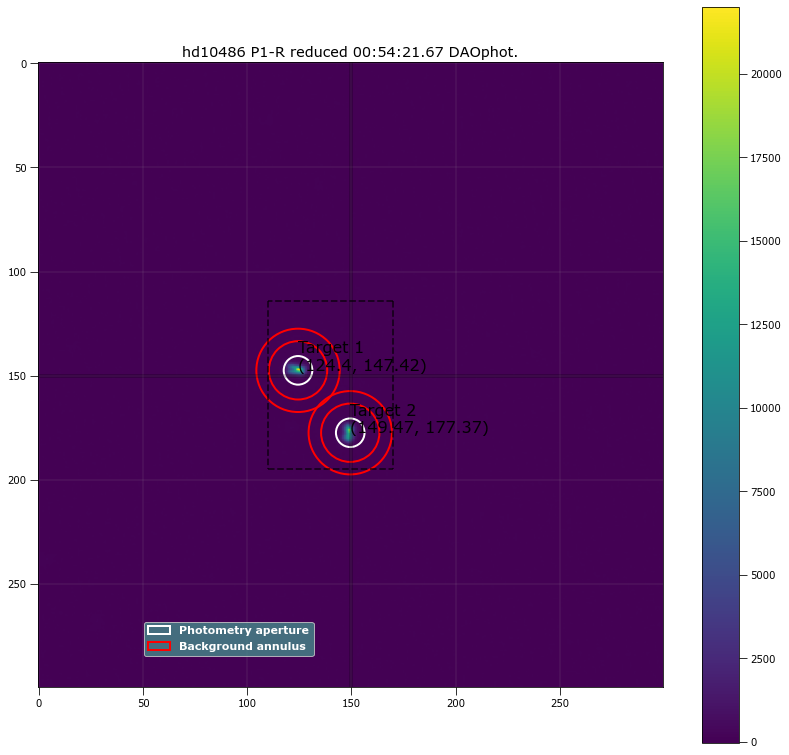

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5878.8987      34746.602          140.42788
  2 149.47129 177.37313 ...          5702.5795      34455.899          139.26978

 Aperture are: 148.03209853635906 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5846.4626             396490.59
  2 149.47129 177.37313 ...                 5670.4108             398767.99
300 00:54:21.67 P1-R 2.0 124.40333103606186 147.41991949880224 396490.5937267349 5846.462568339552 149.47128717599713 177.3731318058058 398767.993

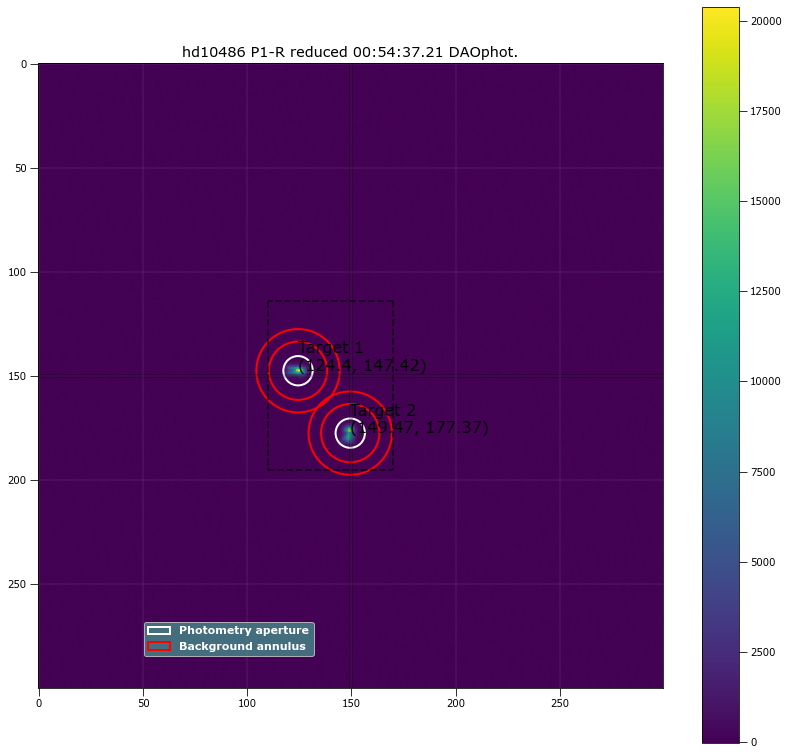

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5742.5227      35788.655          144.77892
  2 149.47129 177.37313 ...          5648.4646      35500.274          143.40851

 Aperture are: 155.80733729213023 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5707.3251             396478.57
  2 149.47129 177.37313 ...                 5613.6001             399008.23
301 00:54:37.21 P1-R 2.0 124.40333103606186 147.41991949880224 396478.57379811397 5707.325134543239 149.47128717599713 177.3731318058058 399008.22

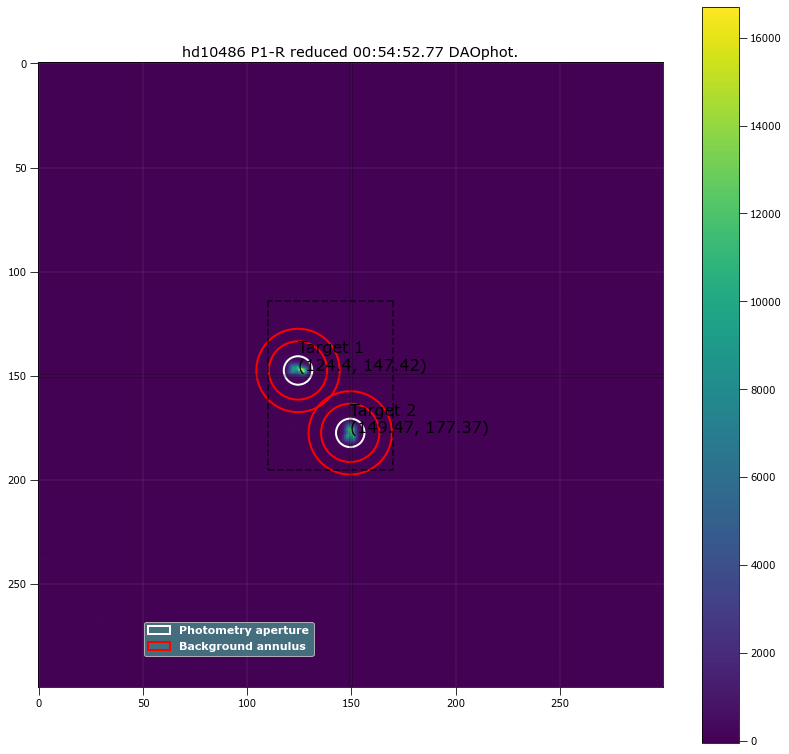

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5428.8606      35257.839          142.72488
  2 149.47129 177.37313 ...          5307.5055      34952.908          141.53938

 Aperture are: 146.75557269350875 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5396.1782             389729.32
  2 149.47129 177.37313 ...                 5275.0946             392126.15
302 00:54:52.77 P1-R 2.0 124.40333103606186 147.41991949880224 389729.31721412286 5396.178199234269 149.47128717599713 177.3731318058058 392126.15

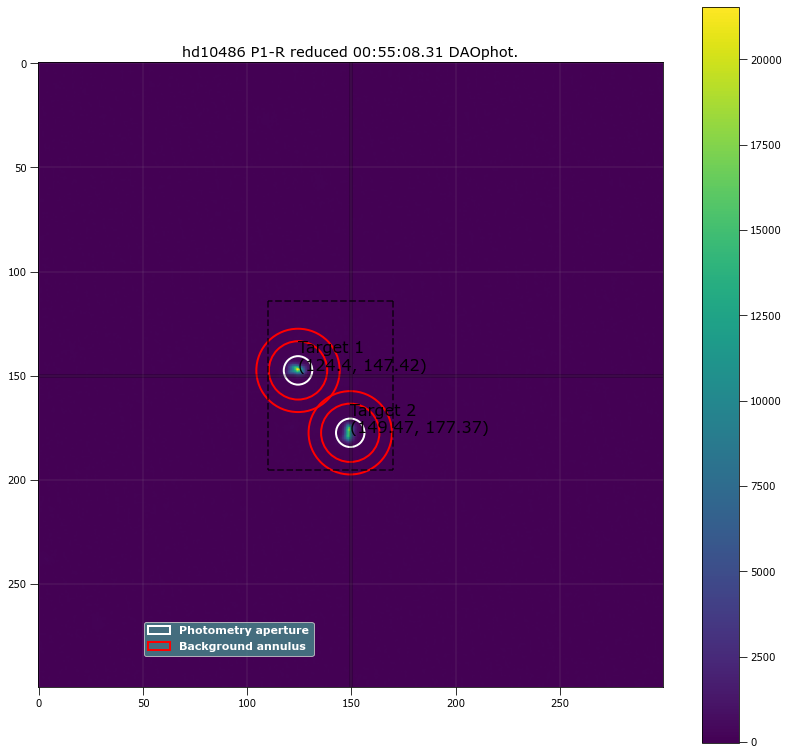

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          6007.1425      34912.023          141.17662
  2 149.47129 177.37313 ...          5962.6808      34885.124          140.69011

 Aperture are: 146.75557269350875 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5974.8146             397535.02
  2 149.47129 177.37313 ...                 5930.4643             398382.09
303 00:55:08.31 P1-R 2.0 124.40333103606186 147.41991949880224 397535.0237017674 5974.814617047568 149.47128717599713 177.3731318058058 398382.085

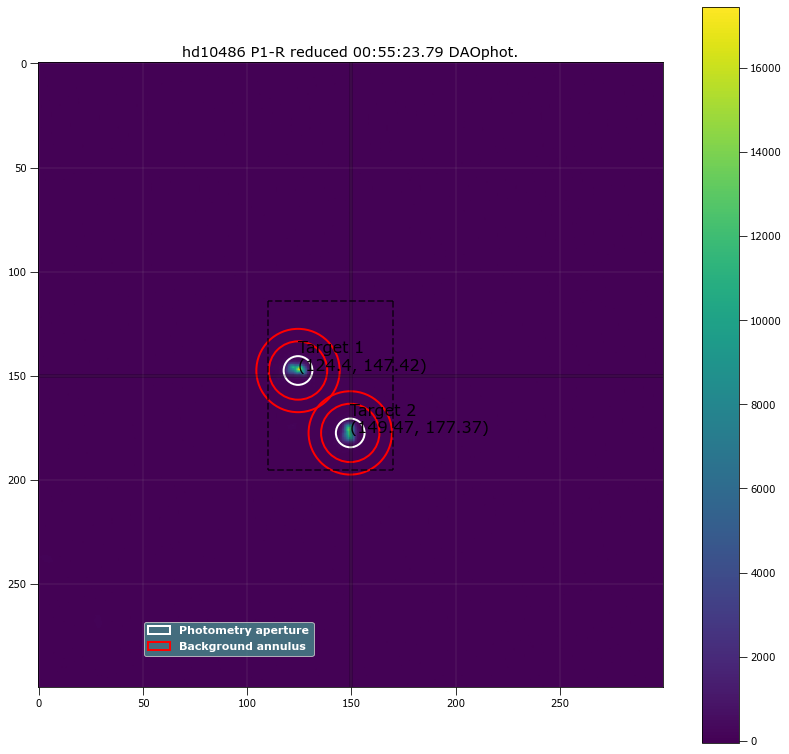

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...           5487.689      34826.178          140.89295
  2 149.47129 177.37313 ...          5369.5847      34703.763          140.13306

 Aperture are: 149.31415217438408 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5454.8636             397393.07
  2 149.47129 177.37313 ...                 5336.9364             399644.86
304 00:55:23.79 P1-R 2.0 124.40333103606186 147.41991949880224 397393.07008595986 5454.863573828651 149.47128717599713 177.3731318058058 399644.85

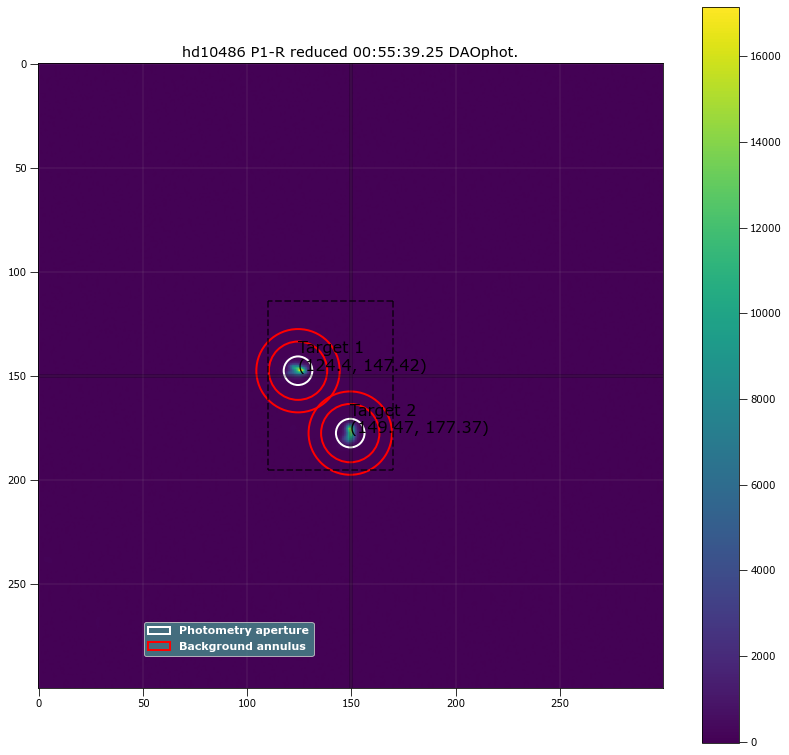

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5507.8894      34896.115          141.16008
  2 149.47129 177.37313 ...          5454.7382      34372.001          138.91831

 Aperture are: 148.03209853635906 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5475.2842             397243.22
  2 149.47129 177.37313 ...                 5422.6507             398526.91
305 00:55:39.25 P1-R 2.0 124.40333103606186 147.41991949880224 397243.22070556076 5475.284180078785 149.47128717599713 177.3731318058058 398526.90

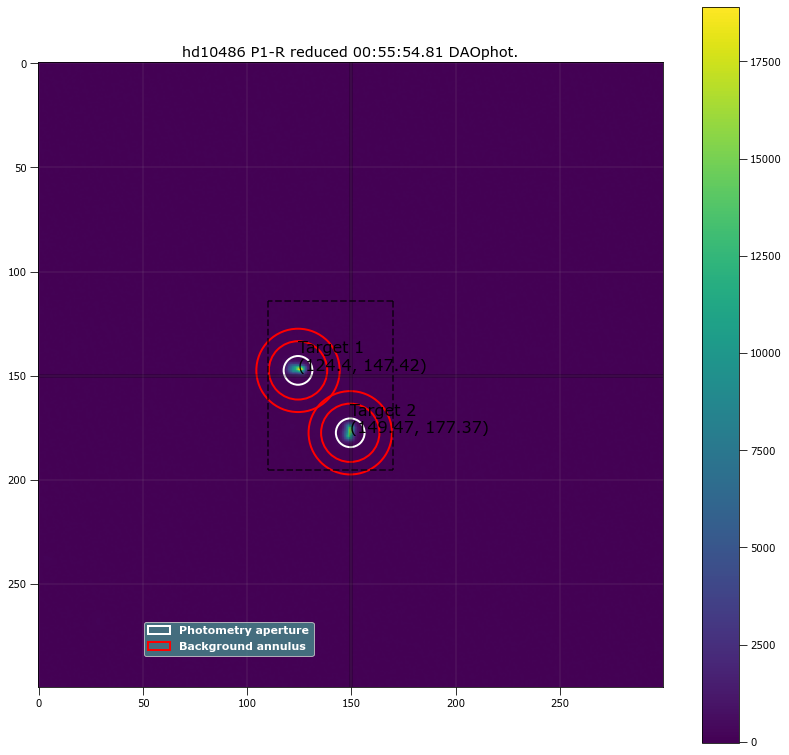

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5854.4932      35161.366           142.3879
  2 149.47129 177.37313 ...          5735.3868      35497.324          143.36869

 Aperture are: 149.31415217438408 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5821.3194             398047.03
  2 149.47129 177.37313 ...                 5701.9846             399361.83
306 00:55:54.81 P1-R 2.0 124.40333103606186 147.41991949880224 398047.0294689296 5821.319444657862 149.47128717599713 177.3731318058058 399361.834

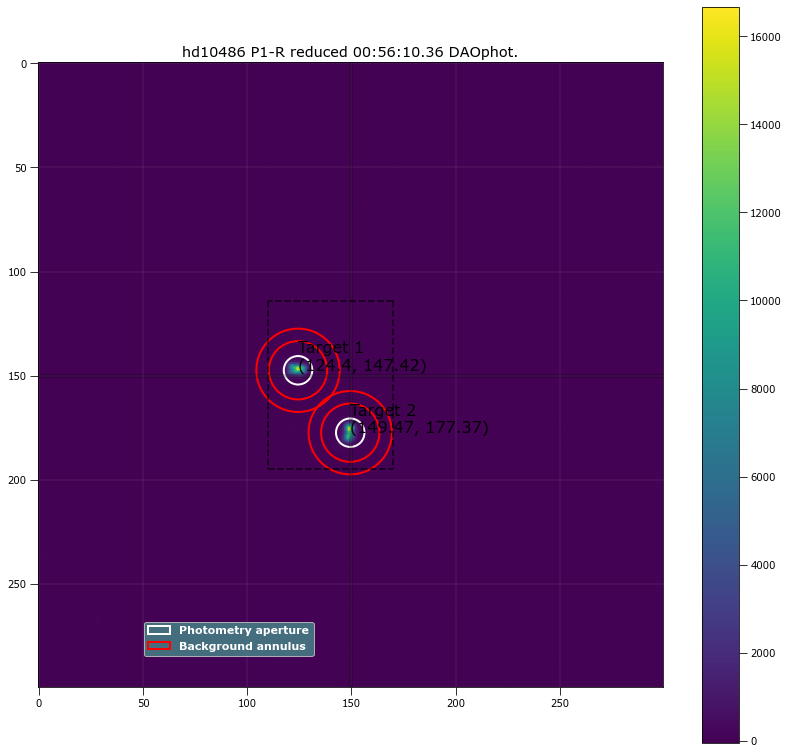

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5512.4545      35095.805          141.84962
  2 149.47129 177.37313 ...          5535.1036      34339.504          138.74701

 Aperture are: 146.75557269350875 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5479.9725             398383.15
  2 149.47129 177.37313 ...                 5503.3321             399246.18
307 00:56:10.36 P1-R 2.0 124.40333103606186 147.41991949880224 398383.1541928504 5479.972532260895 149.47128717599713 177.3731318058058 399246.182

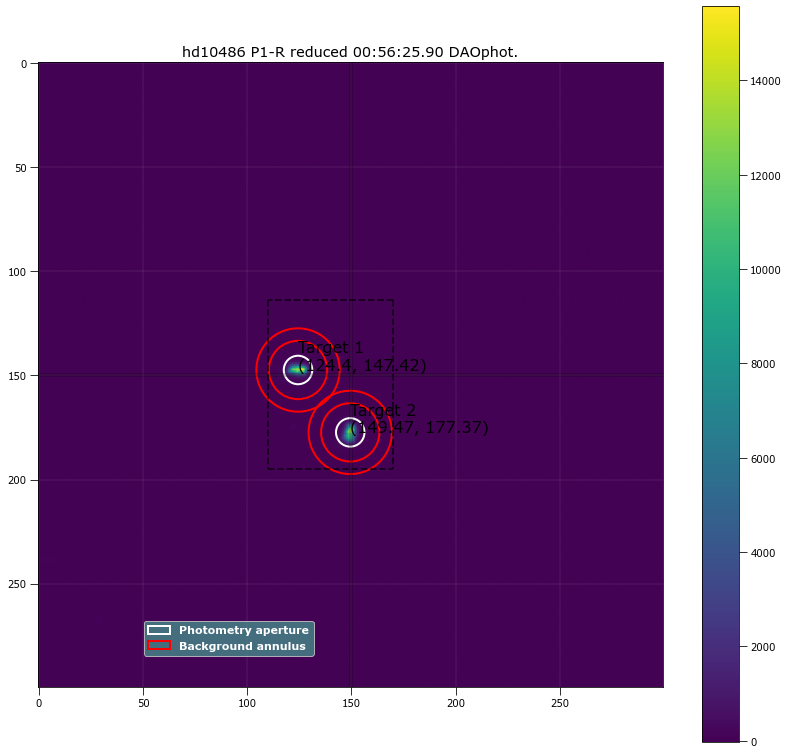

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5565.8679      35205.263          142.44686
  2 149.47129 177.37313 ...          5413.1963      34947.857          141.33658

 Aperture are: 146.75557269350875 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5533.2492             395096.65
  2 149.47129 177.37313 ...                 5380.8318             395384.17
308 00:56:25.90 P1-R 2.0 124.40333103606186 147.41991949880224 395096.65370274195 5533.249157118974 149.47128717599713 177.3731318058058 395384.16

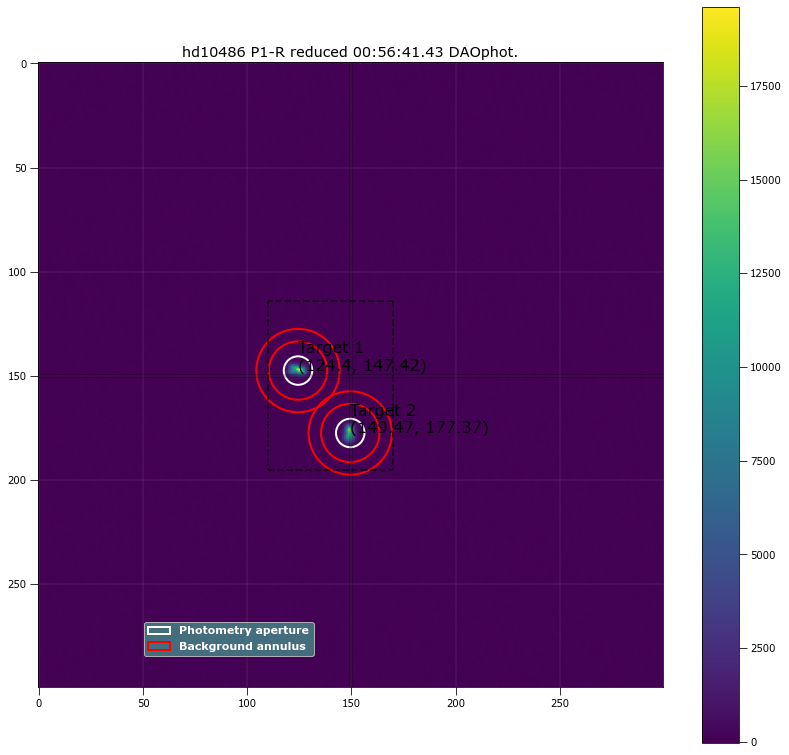

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5813.2964      35010.891          141.75328
  2 149.47129 177.37313 ...          5770.0108      34753.349           140.3957

 Aperture are: 146.75557269350875 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5780.8365             398238.91
  2 149.47129 177.37313 ...                 5737.8617             397432.96
309 00:56:41.43 P1-R 2.0 124.40333103606186 147.41991949880224 398238.90764400957 5780.836477728371 149.47128717599713 177.3731318058058 397432.95

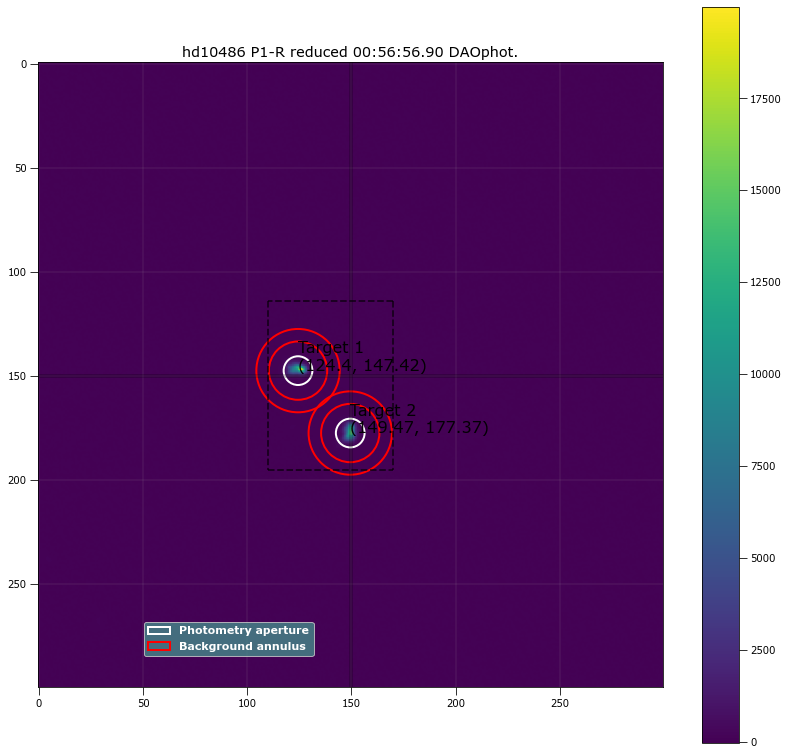

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5609.9694      34317.186          139.31871
  2 149.47129 177.37313 ...           5451.491      35169.736          142.01399

 Aperture are: 149.31415217438408 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5577.5108             396616.96
  2 149.47129 177.37313 ...                 5418.4044             398606.79
310 00:56:56.90 P1-R 2.0 124.40333103606186 147.41991949880224 396616.9636203431 5577.510752178576 149.47128717599713 177.3731318058058 398606.791

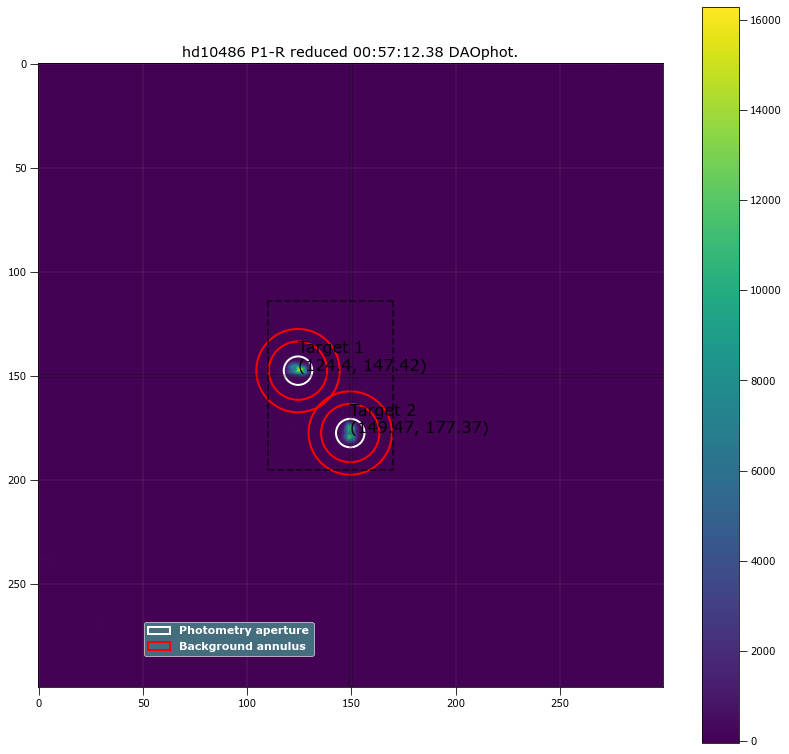

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5325.0504      34927.206          141.10685
  2 149.47129 177.37313 ...           5246.078      35210.369          142.39282

 Aperture are: 146.75557269350875 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5292.7385             395781.02
  2 149.47129 177.37313 ...                 5213.4716             395798.42
311 00:57:12.38 P1-R 2.0 124.40333103606186 147.41991949880224 395781.01594520593 5292.738490423948 149.47128717599713 177.3731318058058 395798.41

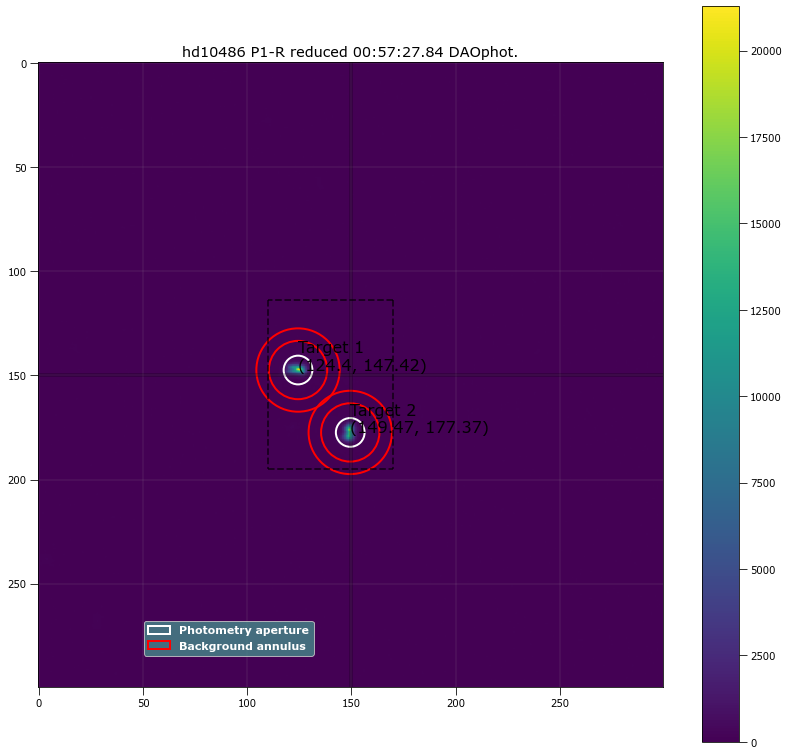

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5882.8756      34257.255          138.76891
  2 149.47129 177.37313 ...          5748.8142      34135.949          138.09067

 Aperture are: 149.31415217438408 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5850.5451              397318.8
  2 149.47129 177.37313 ...                 5716.6416             398823.81
312 00:57:27.84 P1-R 2.0 124.40333103606186 147.41991949880224 397318.80156530853 5850.545057701543 149.47128717599713 177.3731318058058 398823.81

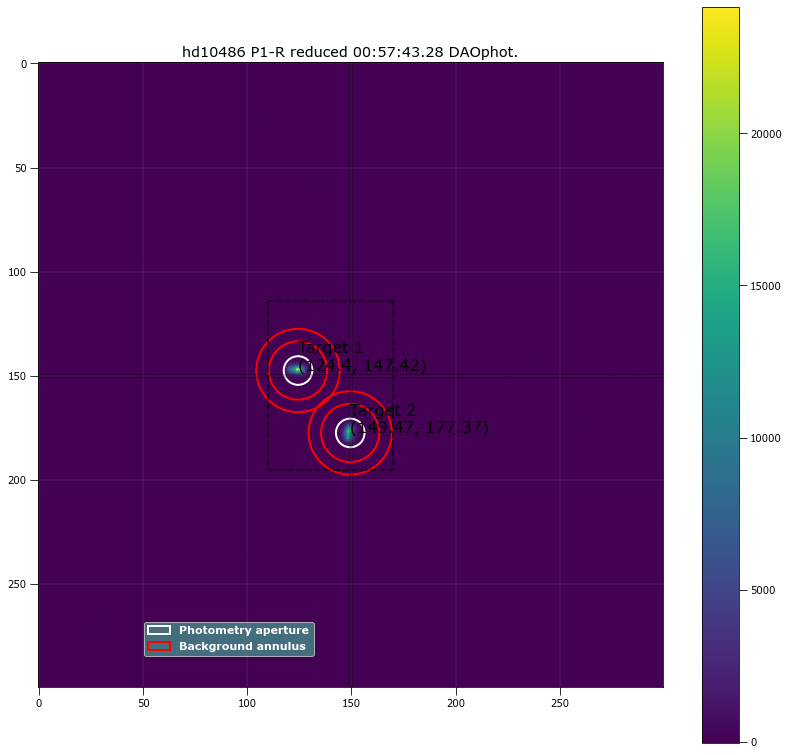

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          6240.6061      35330.901          142.97446
  2 149.47129 177.37313 ...          5992.4279      34715.096          140.29925

 Aperture are: 148.03209853635906 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 6207.5818             402478.19
  2 149.47129 177.37313 ...                 5960.0215              402597.8
313 00:57:43.28 P1-R 2.0 124.40333103606186 147.41991949880224 402478.18760350416 6207.5817731796815 149.47128717599713 177.3731318058058 402597.8

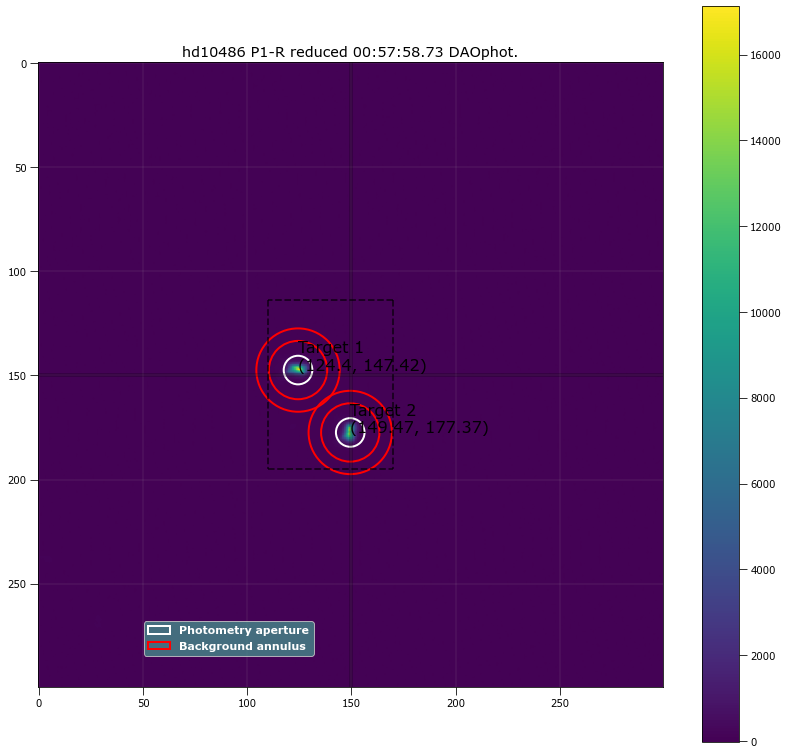

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5507.3241       34908.77          141.32313
  2 149.47129 177.37313 ...          5403.5823      35005.571          141.34433

 Aperture are: 148.03209853635906 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5474.6812             394268.59
  2 149.47129 177.37313 ...                 5370.9345             395380.65
314 00:57:58.73 P1-R 2.0 124.40333103606186 147.41991949880224 394268.5909742909 5474.681215995902 149.47128717599713 177.3731318058058 395380.650

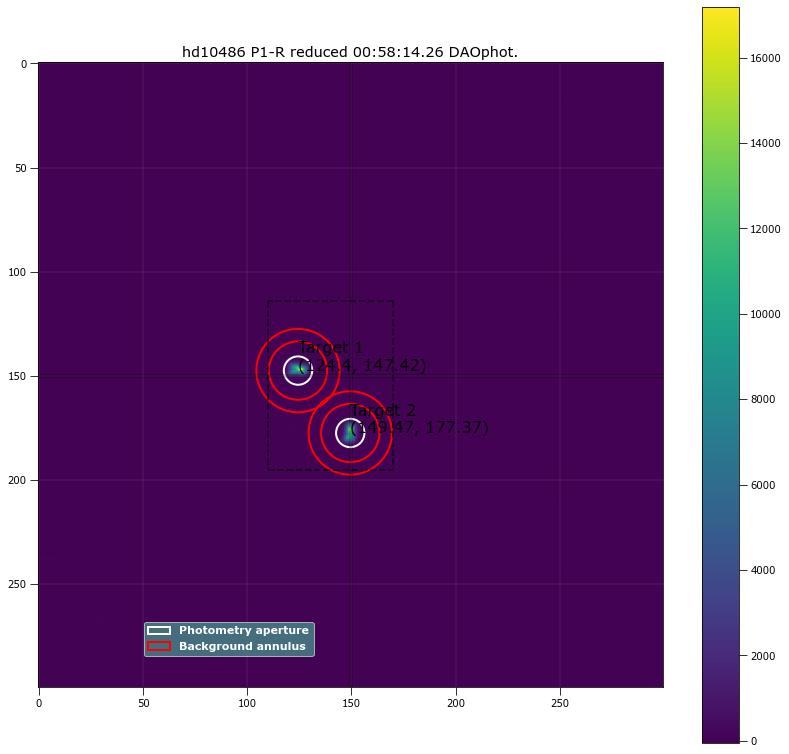

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5481.0086      34578.856          139.70431
  2 149.47129 177.37313 ...          5443.4052      34321.236          138.85958

 Aperture are: 145.48457464583316 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5449.2949             397042.31
  2 149.47129 177.37313 ...                 5411.8833             396467.04
315 00:58:14.26 P1-R 2.0 124.40333103606186 147.41991949880224 397042.31375580333 5449.294899697463 149.47128717599713 177.3731318058058 396467.04

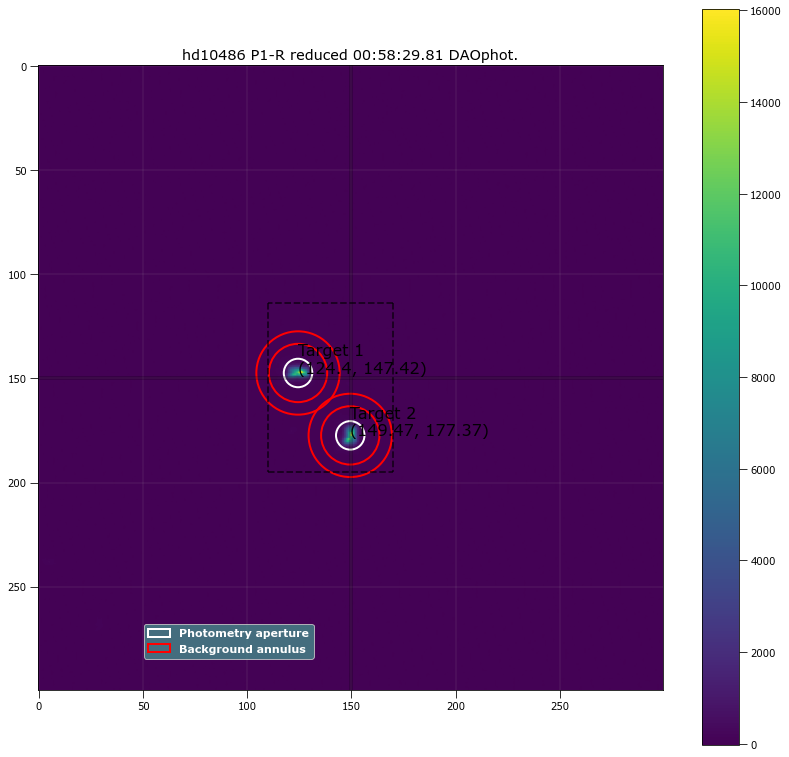

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5243.1861      34499.435          139.81265
  2 149.47129 177.37313 ...          5141.3156      34463.937          139.44395

 Aperture are: 146.75557269350875 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5211.1706             395464.91
  2 149.47129 177.37313 ...                 5109.3845             396442.59
316 00:58:29.81 P1-R 2.0 124.40333103606186 147.41991949880224 395464.9138298927 5211.1705714835025 149.47128717599713 177.3731318058058 396442.58

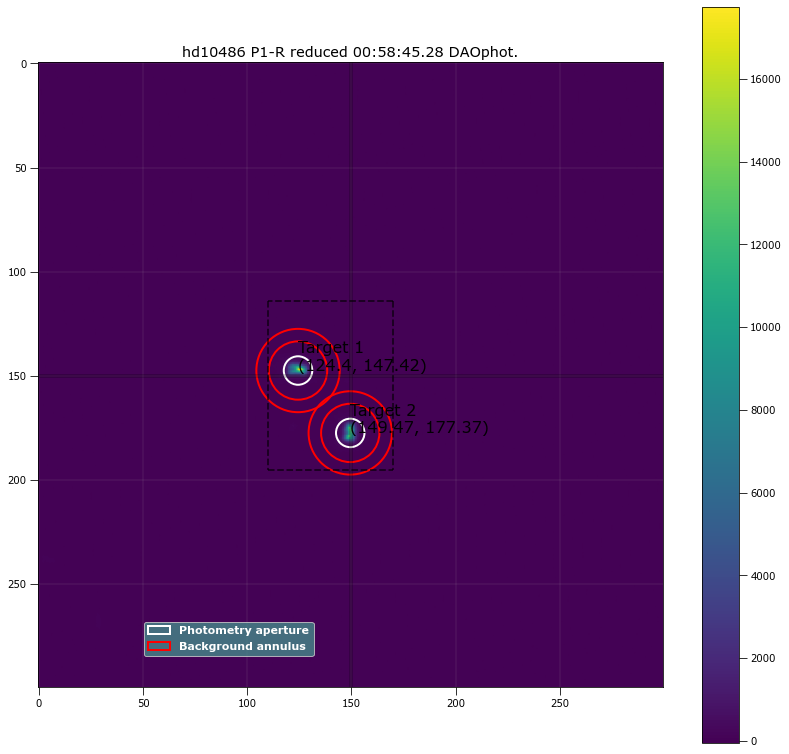

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5449.1361      34865.267          141.00504
  2 149.47129 177.37313 ...          5374.0408      34649.332          139.89929

 Aperture are: 146.75557269350875 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5416.8475             396751.72
  2 149.47129 177.37313 ...                 5342.0054             398827.97
317 00:58:45.28 P1-R 2.0 124.40333103606186 147.41991949880224 396751.72094471456 5416.847493536399 149.47128717599713 177.3731318058058 398827.96

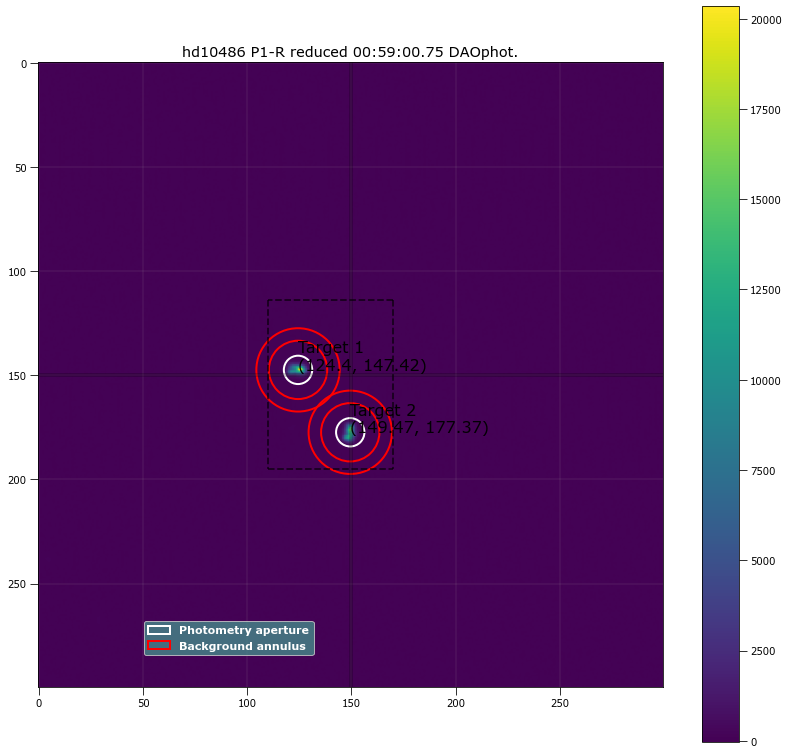

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5943.2924      34003.577          137.60346
  2 149.47129 177.37313 ...          5849.9889       34125.49          138.25682

 Aperture are: 145.48457464583316 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5912.0556             404015.35
  2 149.47129 177.37313 ...                 5818.6038             403693.63
318 00:59:00.75 P1-R 2.0 124.40333103606186 147.41991949880224 404015.352586308 5912.055624500975 149.47128717599713 177.3731318058058 403693.6311

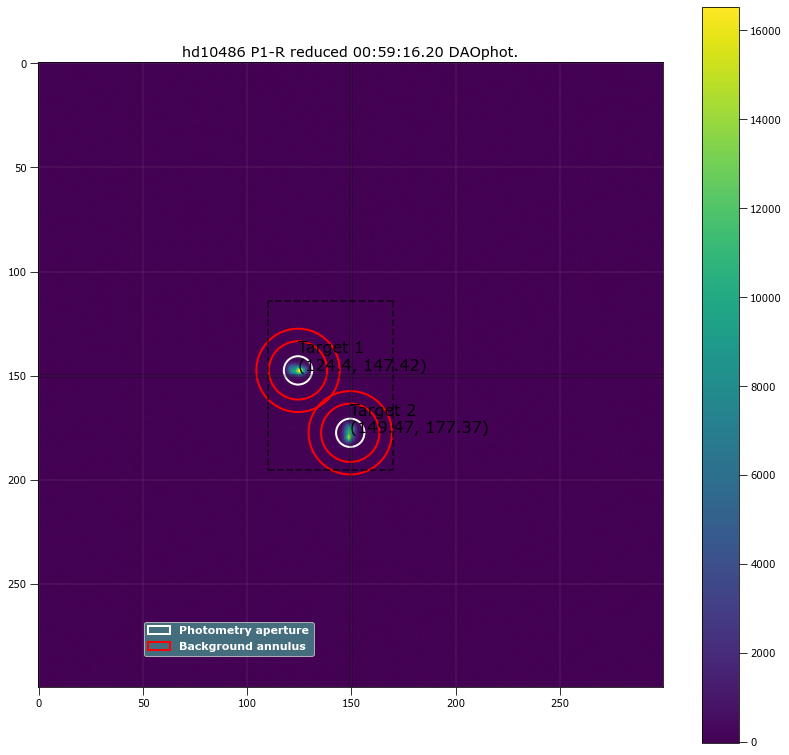

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5622.1445      34999.621          141.21307
  2 149.47129 177.37313 ...          5529.6445      34740.283          140.33376

 Aperture are: 145.48457464583316 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5590.0883             398145.98
  2 149.47129 177.37313 ...                  5497.788             398602.82
319 00:59:16.20 P1-R 2.0 124.40333103606186 147.41991949880224 398145.97882661625 5590.088304582464 149.47128717599713 177.3731318058058 398602.81

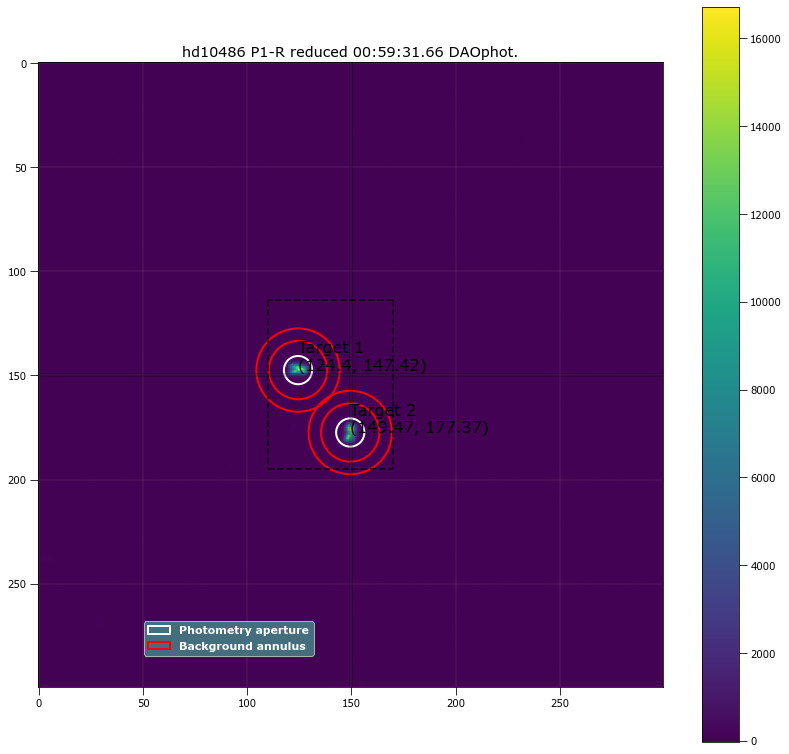

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5643.2447      34281.449          138.88627
  2 149.47129 177.37313 ...          5722.9919       33969.14          137.43199

 Aperture are: 144.2191043933323 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                  5611.991             399318.87
  2 149.47129 177.37313 ...                 5692.0654             399659.68
320 00:59:31.66 P1-R 2.0 124.40333103606186 147.41991949880224 399318.86923086544 5611.990984671999 149.47128717599713 177.3731318058058 399659.681

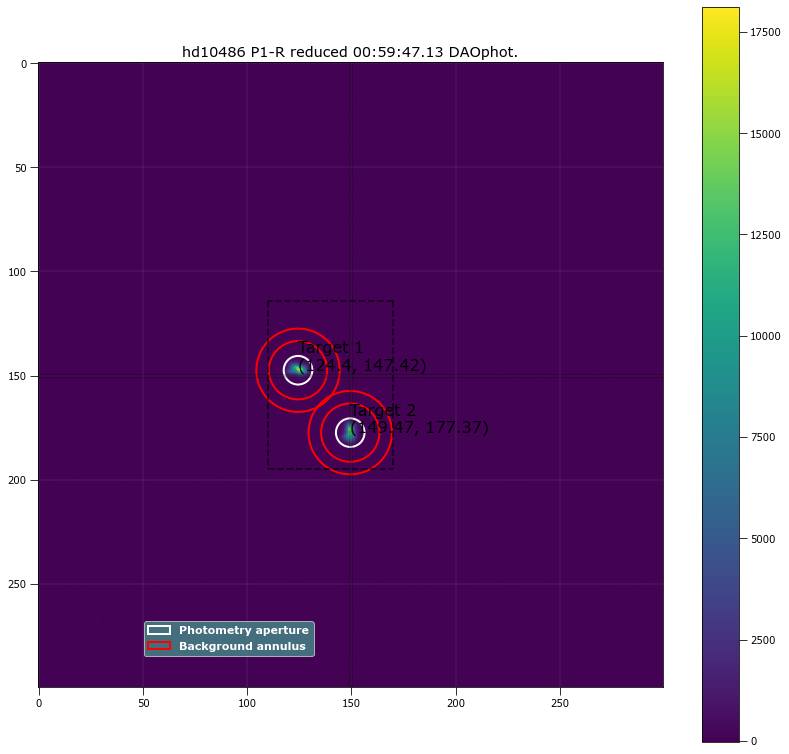

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...           5552.449      34984.019          141.58056
  2 149.47129 177.37313 ...          5503.5669      34540.846          139.78505

 Aperture are: 148.03209853635906 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5519.7466             396460.26
  2 149.47129 177.37313 ...                 5471.2792             397311.99
321 00:59:47.13 P1-R 2.0 124.40333103606186 147.41991949880224 396460.2636309866 5519.746598133313 149.47128717599713 177.3731318058058 397311.992

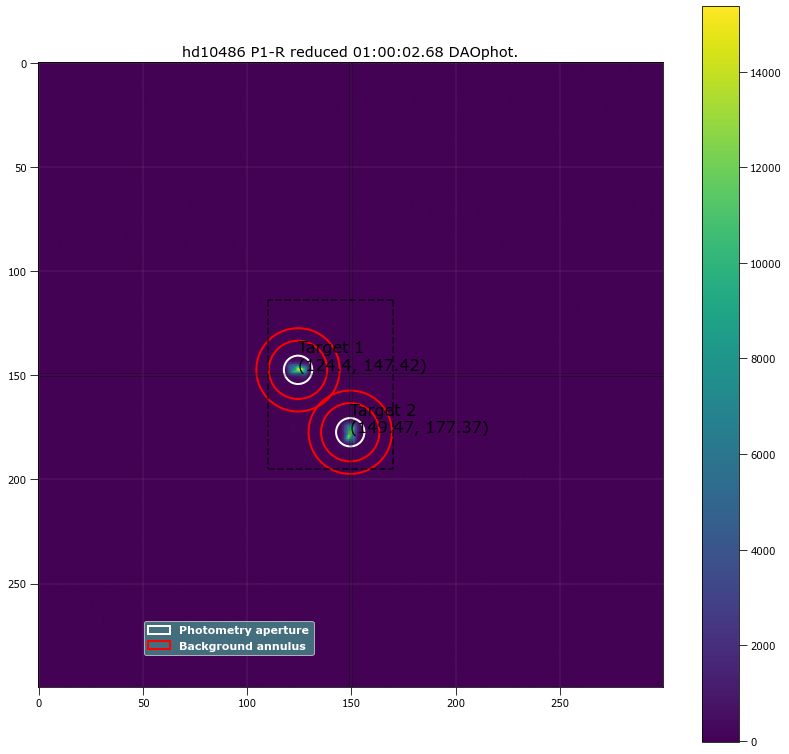

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5301.3852      34993.493          141.33875
  2 149.47129 177.37313 ...          5278.9881       34944.75          141.14397

 Aperture are: 145.48457464583316 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5269.3005             392880.24
  2 149.47129 177.37313 ...                 5246.9477              394206.3
322 01:00:02.68 P1-R 2.0 124.40333103606186 147.41991949880224 392880.235041562 5269.300500309634 149.47128717599713 177.3731318058058 394206.3035

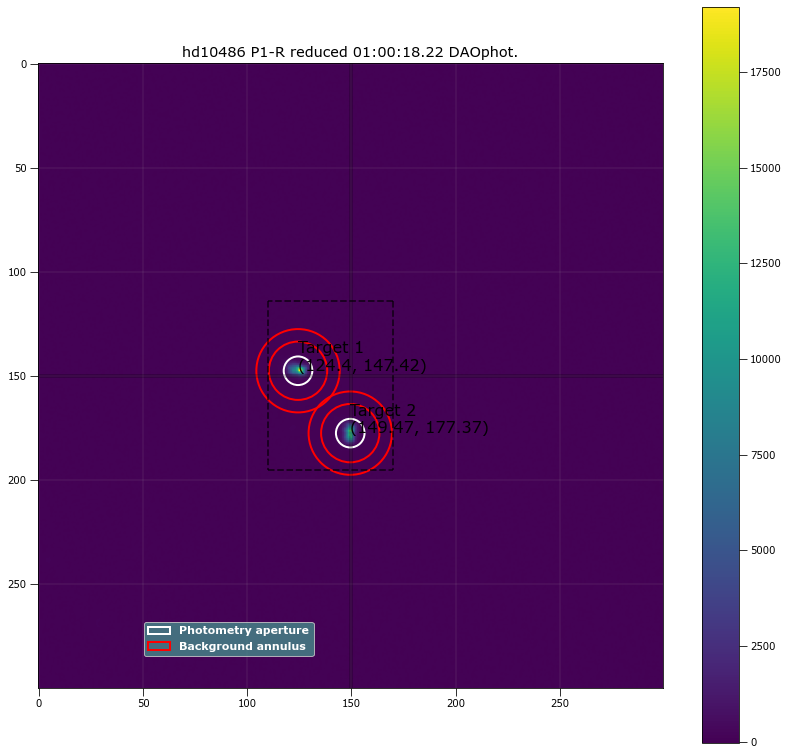

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5533.6885      34982.385          141.68567
  2 149.47129 177.37313 ...          5369.9334      35104.049          141.91048

 Aperture are: 148.03209853635906 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5500.9619             391522.74
  2 149.47129 177.37313 ...                 5337.1548             392820.81
323 01:00:18.22 P1-R 2.0 124.40333103606186 147.41991949880224 391522.7369349554 5500.961874237698 149.47128717599713 177.3731318058058 392820.806

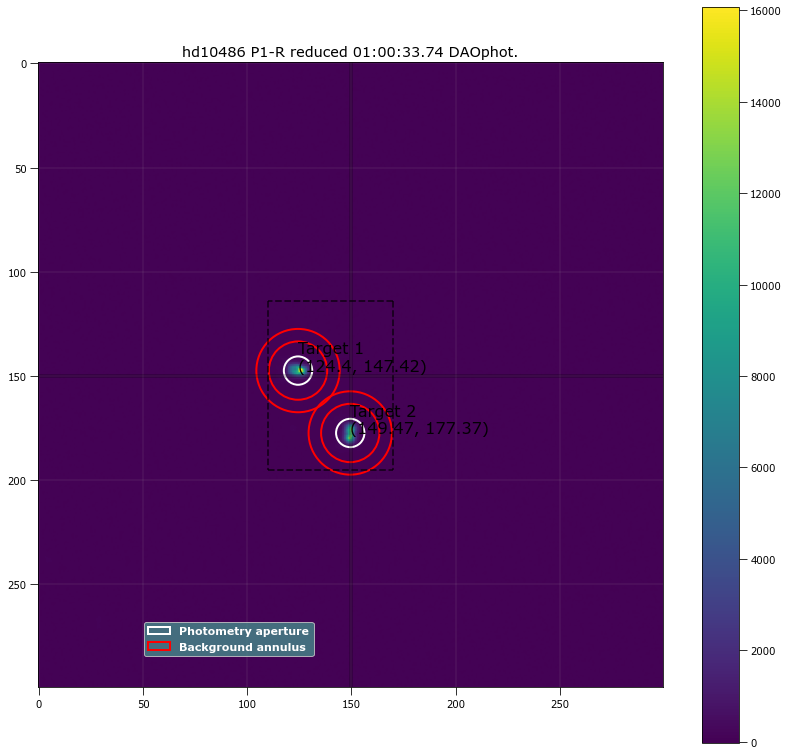

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5368.4273        35341.7          142.95055
  2 149.47129 177.37313 ...          5318.9606      34846.835          140.83232

 Aperture are: 145.48457464583316 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5335.9767             391821.37
  2 149.47129 177.37313 ...                 5286.9908             392796.37
324 01:00:33.74 P1-R 2.0 124.40333103606186 147.41991949880224 391821.37046917825 5335.976708935302 149.47128717599713 177.3731318058058 392796.36

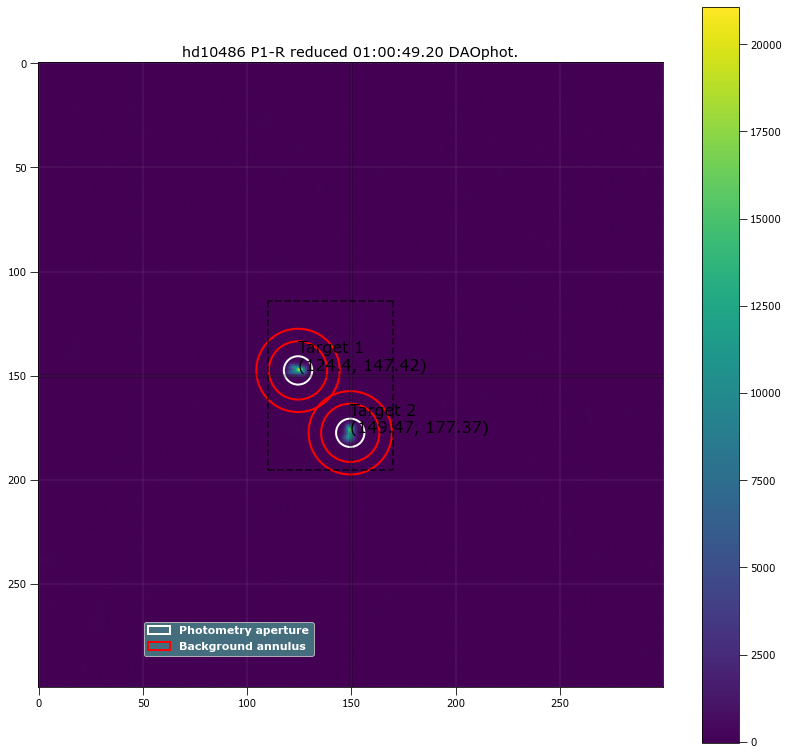

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5745.0908       34258.76          138.81133
  2 149.47129 177.37313 ...          5711.5596      34768.587          140.41061

 Aperture are: 145.48457464583316 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5713.5799             396972.11
  2 149.47129 177.37313 ...                 5679.6856              398526.1
325 01:00:49.20 P1-R 2.0 124.40333103606186 147.41991949880224 396972.10985467216 5713.579859438535 149.47128717599713 177.3731318058058 398526.09

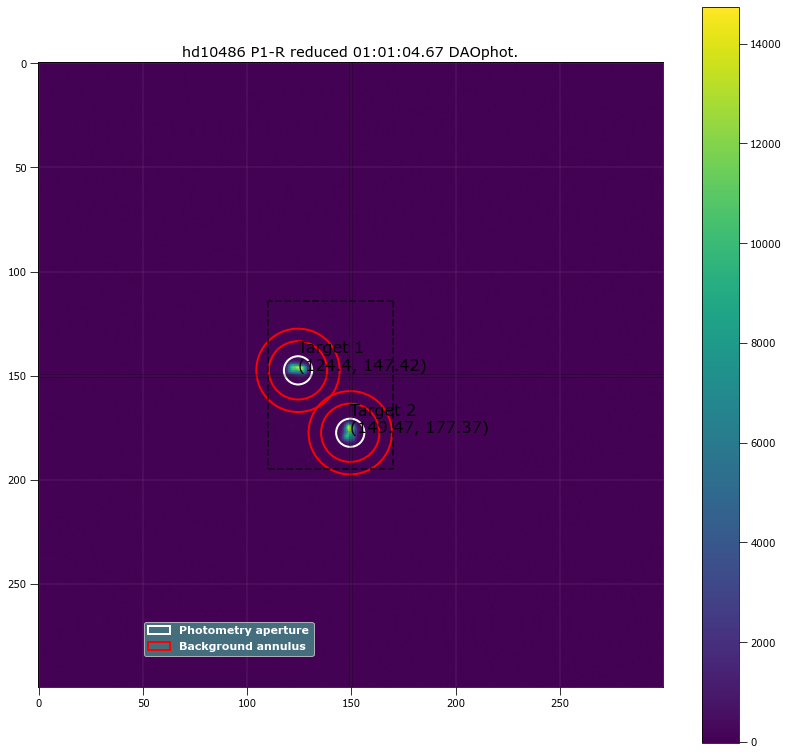

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5593.0827      34078.072          137.75746
  2 149.47129 177.37313 ...          5536.6781      34724.264          140.51723

 Aperture are: 144.2191043933323 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                  5562.083             403310.73
  2 149.47129 177.37313 ...                 5505.0573              404723.8
326 01:01:04.67 P1-R 2.0 124.40333103606186 147.41991949880224 403310.72814940015 5562.082984647844 149.47128717599713 177.3731318058058 404723.799

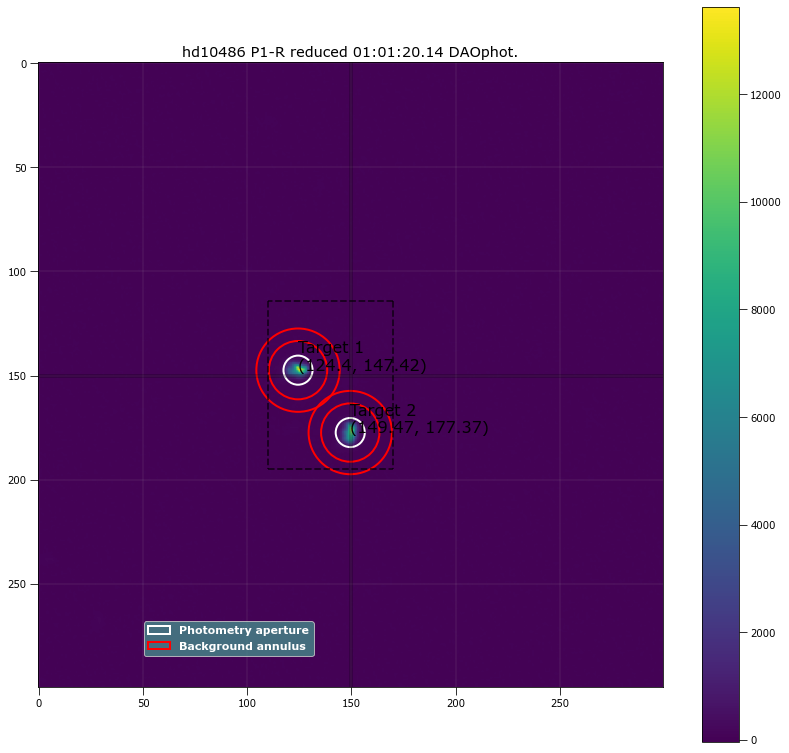

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...           4870.951      34991.904          141.67952
  2 149.47129 177.37313 ...          4775.4279       34295.07           138.8082

 Aperture are: 153.19347985950756 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 4837.0847             389786.29
  2 149.47129 177.37313 ...                  4742.248             391742.55
327 01:01:20.14 P1-R 2.0 124.40333103606186 147.41991949880224 389786.2943708162 4837.084741654079 149.47128717599713 177.3731318058058 391742.548

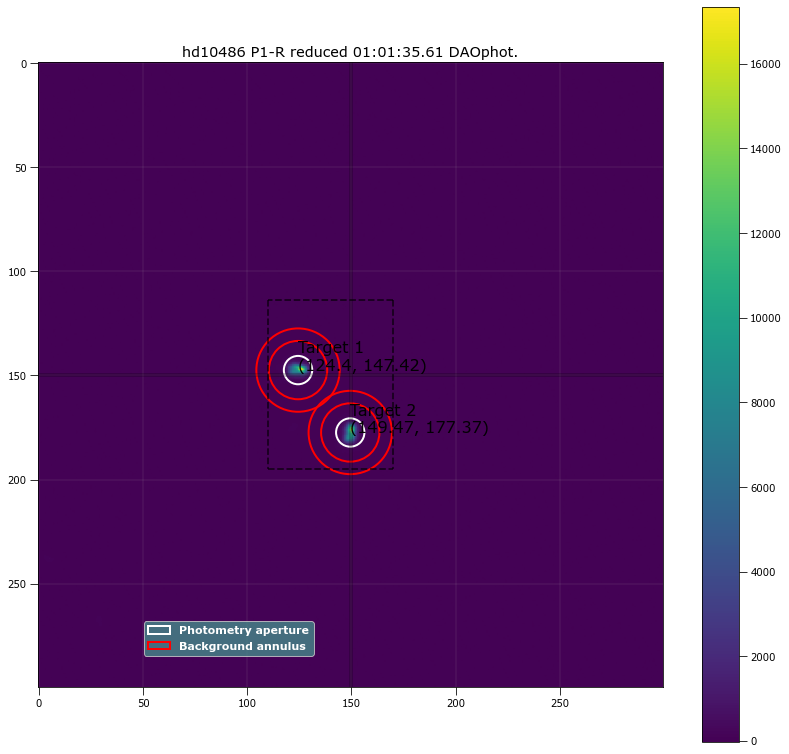

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5430.4703      34466.922          139.56991
  2 149.47129 177.37313 ...          5388.9398      34565.512          139.45546

 Aperture are: 145.48457464583316 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5398.7871             399743.76
  2 149.47129 177.37313 ...                 5357.2826             400378.48
328 01:01:35.61 P1-R 2.0 124.40333103606186 147.41991949880224 399743.7579984023 5398.787124450988 149.47128717599713 177.3731318058058 400378.478

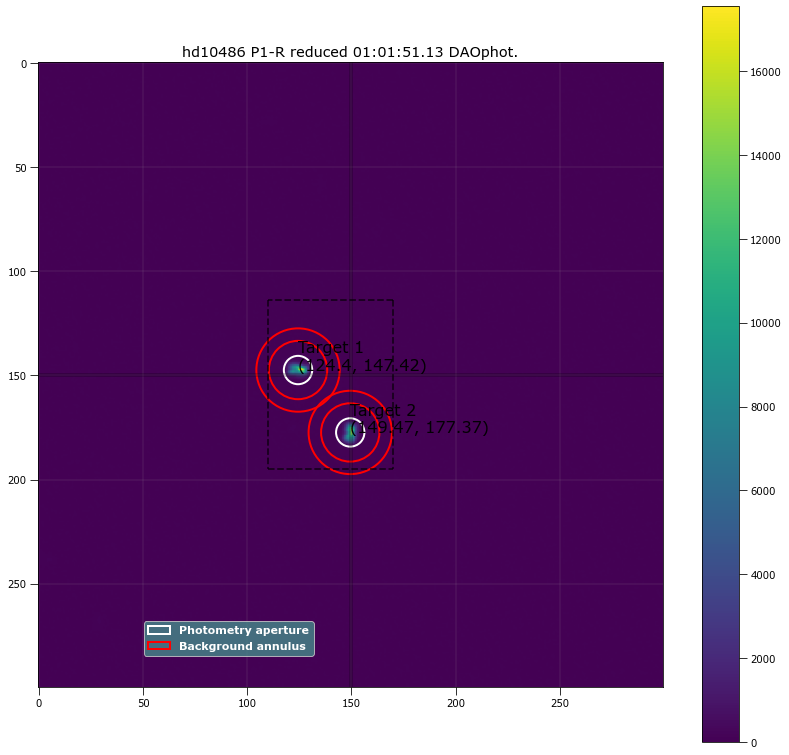

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5477.5287      34825.411          141.11367
  2 149.47129 177.37313 ...          5420.5826       34682.17          140.37626

 Aperture are: 145.48457464583316 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5445.4951             397983.97
  2 149.47129 177.37313 ...                 5388.7163             399896.45
329 01:01:51.13 P1-R 2.0 124.40333103606186 147.41991949880224 397983.9703653566 5445.495102875783 149.47128717599713 177.3731318058058 399896.452

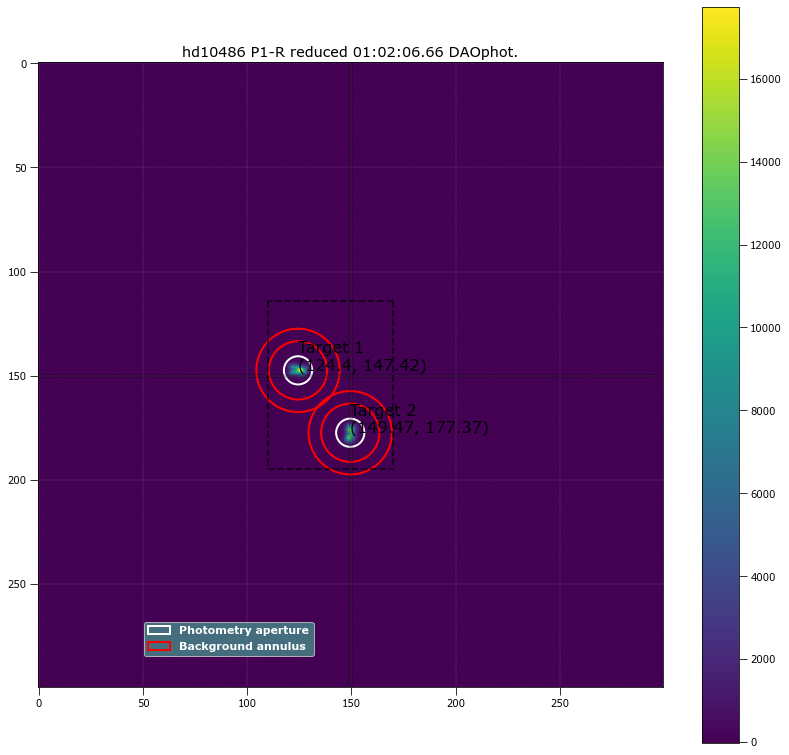

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5726.5107      34431.034          139.19451
  2 149.47129 177.37313 ...          5733.2154      34938.676          141.05908

 Aperture are: 144.2191043933323 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5695.1876             400324.46
  2 149.47129 177.37313 ...                 5701.4727             400712.98
330 01:02:06.66 P1-R 2.0 124.40333103606186 147.41991949880224 400324.46471568284 5695.18760658993 149.47128717599713 177.3731318058058 400712.9805

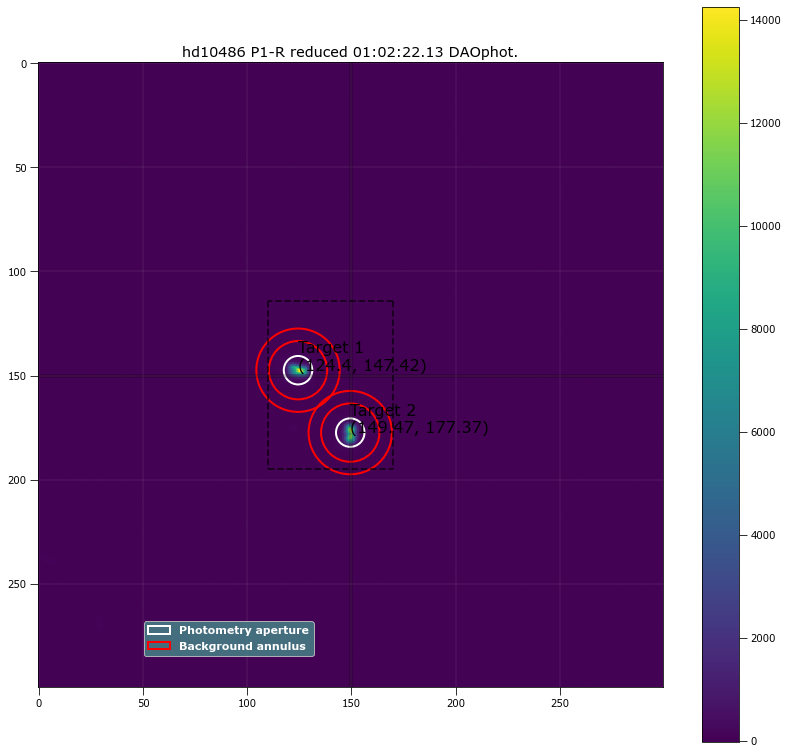

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5281.0545       35143.66          142.01279
  2 149.47129 177.37313 ...          5243.4535      35851.007          144.71677

 Aperture are: 146.75557269350875 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5248.5351             393424.64
  2 149.47129 177.37313 ...                 5210.3149              393698.4
331 01:02:22.13 P1-R 2.0 124.40333103606186 147.41991949880224 393424.6388364422 5248.535145722297 149.47128717599713 177.3731318058058 393698.395

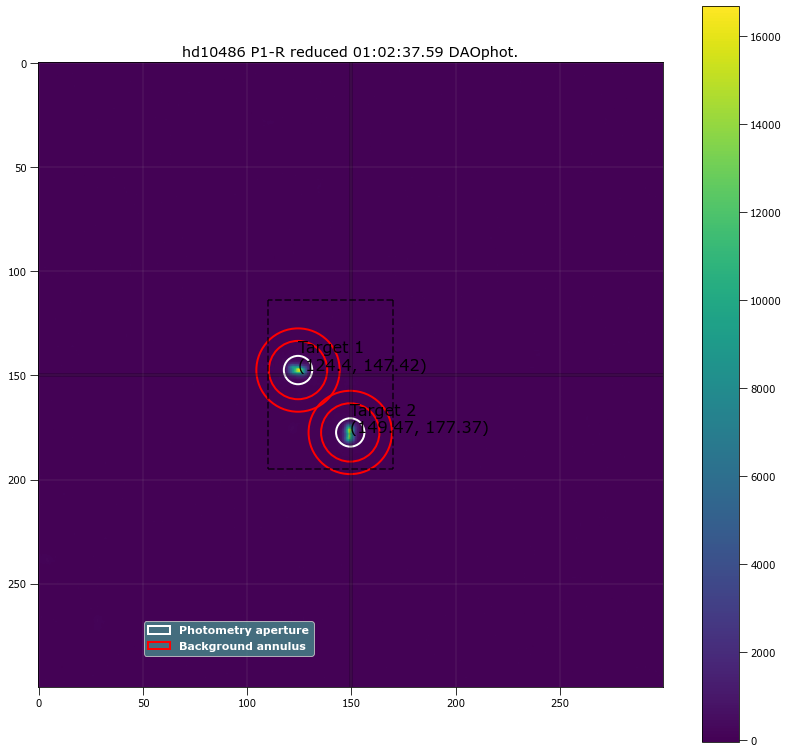

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...           5574.874      34716.556          140.51818
  2 149.47129 177.37313 ...           5575.911      34563.572          139.63367

 Aperture are: 145.48457464583316 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5542.9755             396942.21
  2 149.47129 177.37313 ...                 5544.2134             397778.96
332 01:02:37.59 P1-R 2.0 124.40333103606186 147.41991949880224 396942.2083479524 5542.97553145759 149.47128717599713 177.3731318058058 397778.9561

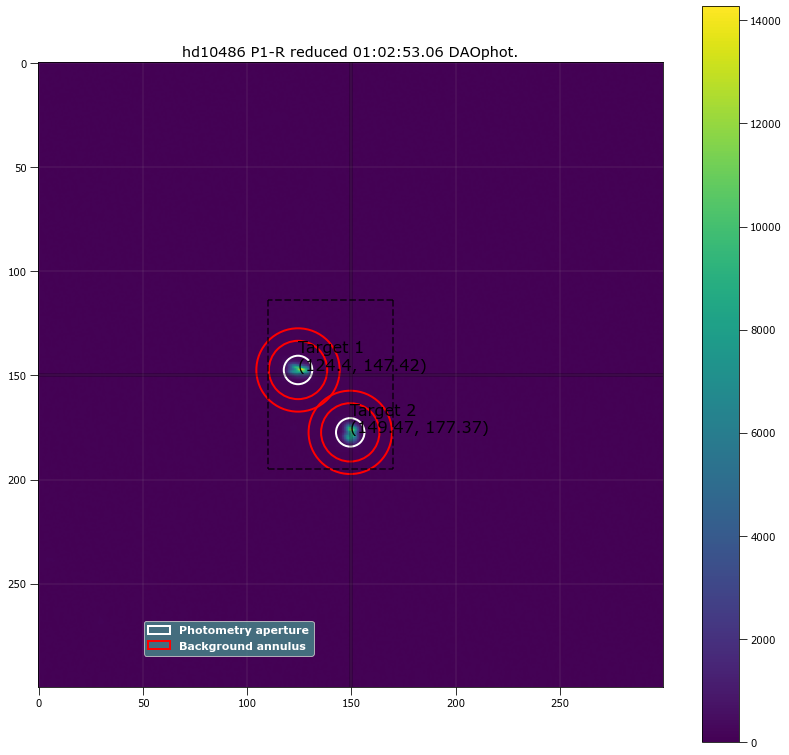

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...           5022.283      35376.601          143.12629
  2 149.47129 177.37313 ...          4864.5602      35411.399          142.97521

 Aperture are: 146.75557269350875 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 4989.5086             391075.81
  2 149.47129 177.37313 ...                 4831.8204             395072.68
333 01:02:53.06 P1-R 2.0 124.40333103606186 147.41991949880224 391075.80878162745 4989.508640176709 149.47128717599713 177.3731318058058 395072.67

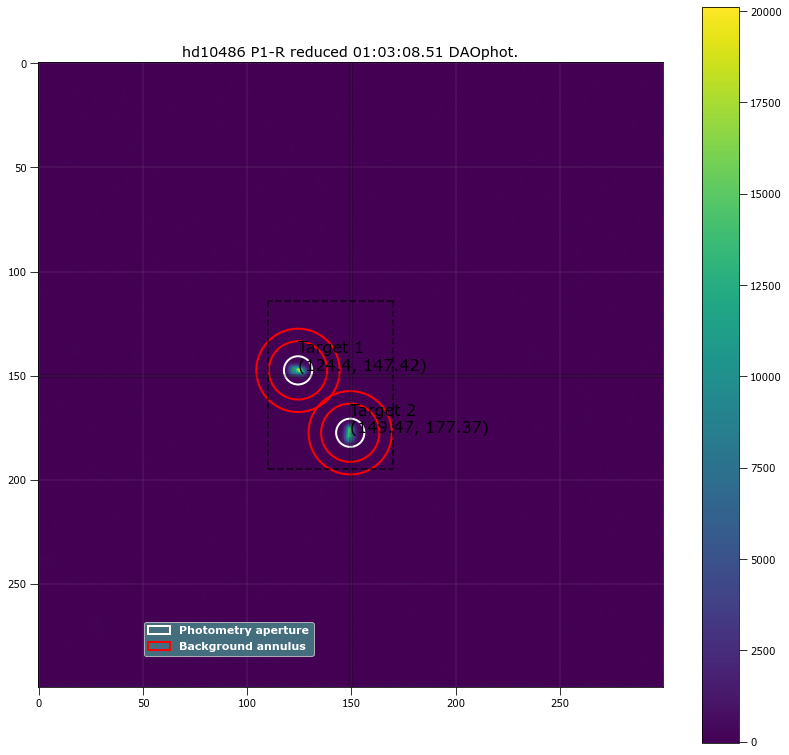

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5919.5517      34742.696          140.59011
  2 149.47129 177.37313 ...          5868.9481      35414.314          142.88745

 Aperture are: 144.2191043933323 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5887.9146             400627.52
  2 149.47129 177.37313 ...                 5836.7939             400375.77
334 01:03:08.51 P1-R 2.0 124.40333103606186 147.41991949880224 400627.5238834958 5887.914573840812 149.47128717599713 177.3731318058058 400375.7746

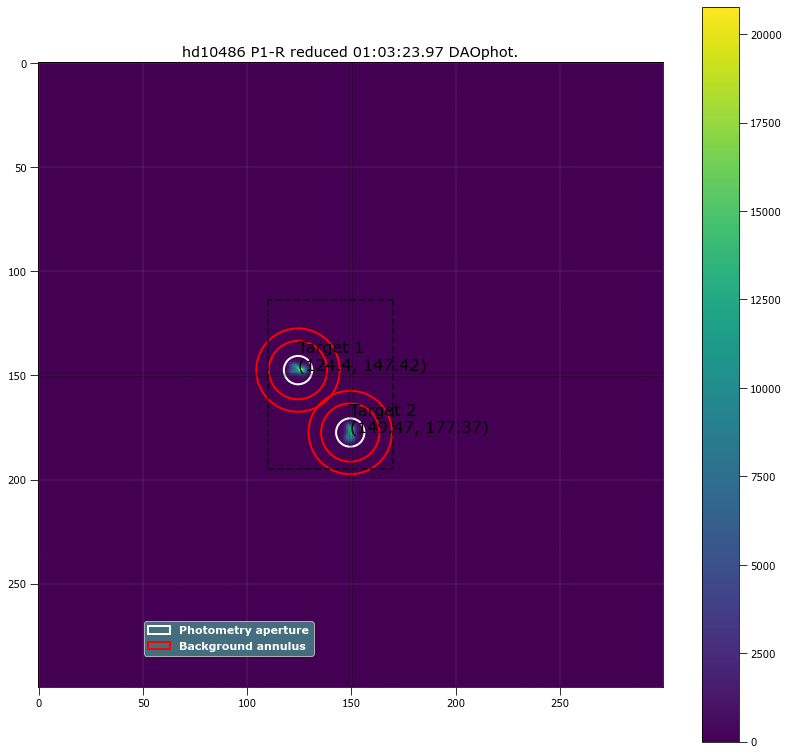

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5897.8783      35052.737           141.6491
  2 149.47129 177.37313 ...          5882.0001      34724.916          140.30491

 Aperture are: 145.48457464583316 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5865.7231             398141.76
  2 149.47129 177.37313 ...                   5850.15             398341.55
335 01:03:23.97 P1-R 2.0 124.40333103606186 147.41991949880224 398141.7620319404 5865.723106523021 149.47128717599713 177.3731318058058 398341.547

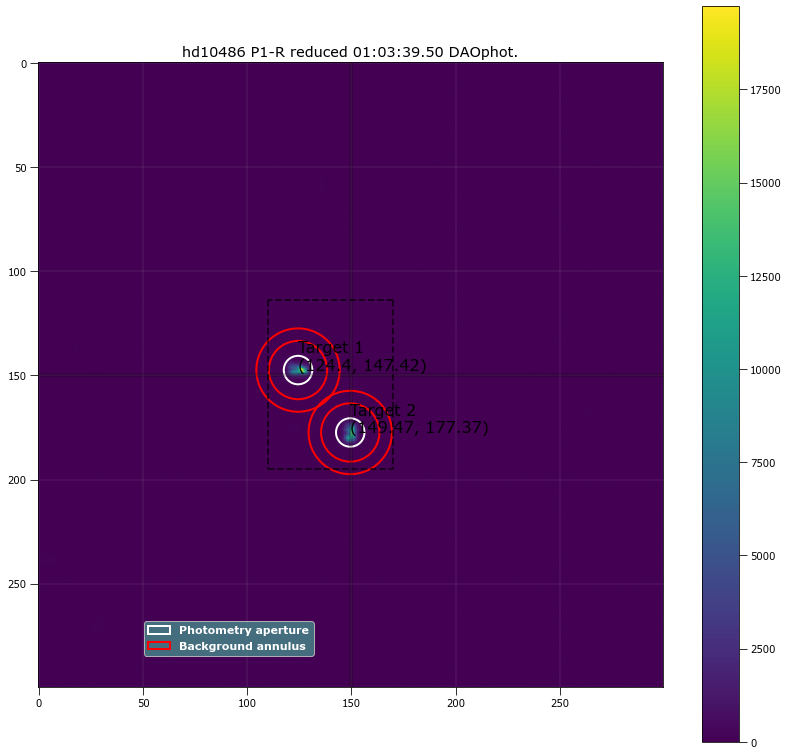

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5519.4873      35093.976          141.74447
  2 149.47129 177.37313 ...          5328.6953      35148.409          142.26719

 Aperture are: 146.75557269350875 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5487.0294             394255.81
  2 149.47129 177.37313 ...                 5296.1177             394213.26
336 01:03:39.50 P1-R 2.0 124.40333103606186 147.41991949880224 394255.81126183807 5487.0294197614585 149.47128717599713 177.3731318058058 394213.2

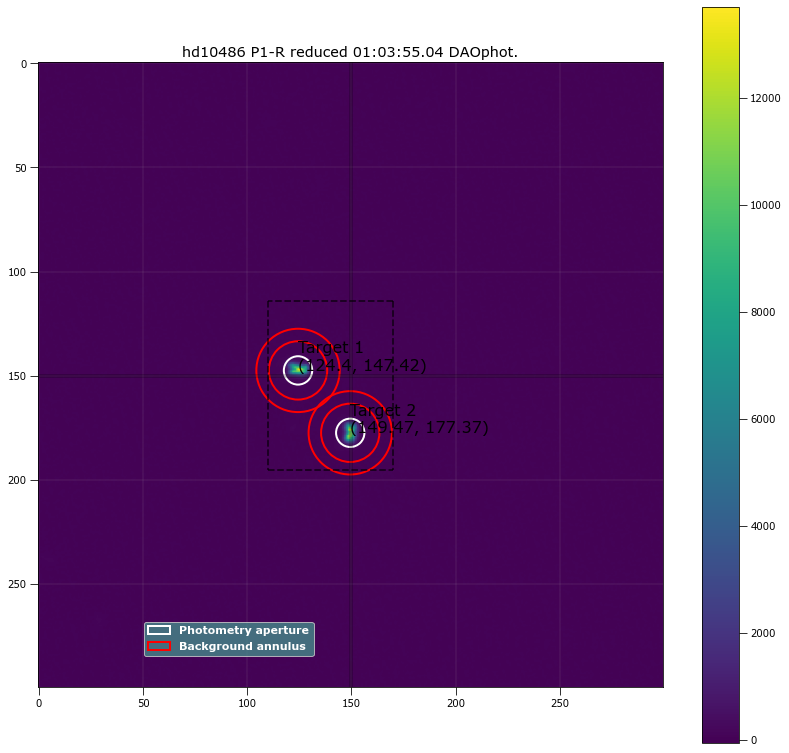

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5183.0454      35036.766          141.99033
  2 149.47129 177.37313 ...          5175.9779      34390.308           139.1415

 Aperture are: 145.48457464583316 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5150.8128             393980.25
  2 149.47129 177.37313 ...                  5144.392              394864.9
337 01:03:55.04 P1-R 2.0 124.40333103606186 147.41991949880224 393980.24639355013 5150.812786637978 149.47128717599713 177.3731318058058 394864.89

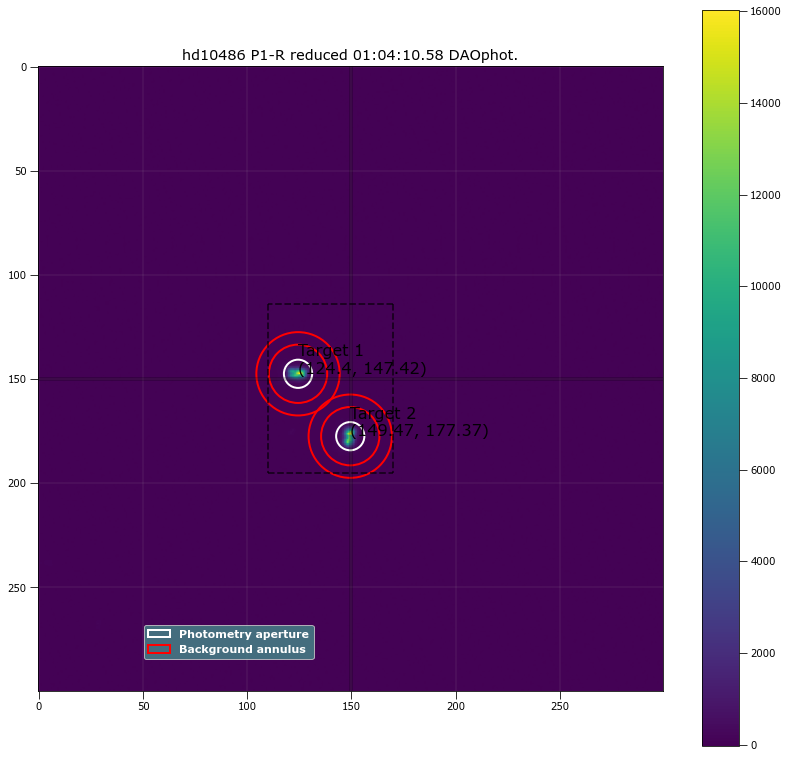

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5595.3333      35068.453          141.57215
  2 149.47129 177.37313 ...          5622.4631      34376.384          139.27603

 Aperture are: 144.2191043933323 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5563.4751             397647.35
  2 149.47129 177.37313 ...                 5591.1216             398663.77
338 01:04:10.58 P1-R 2.0 124.40333103606186 147.41991949880224 397647.34834942536 5563.475111444754 149.47128717599713 177.3731318058058 398663.767

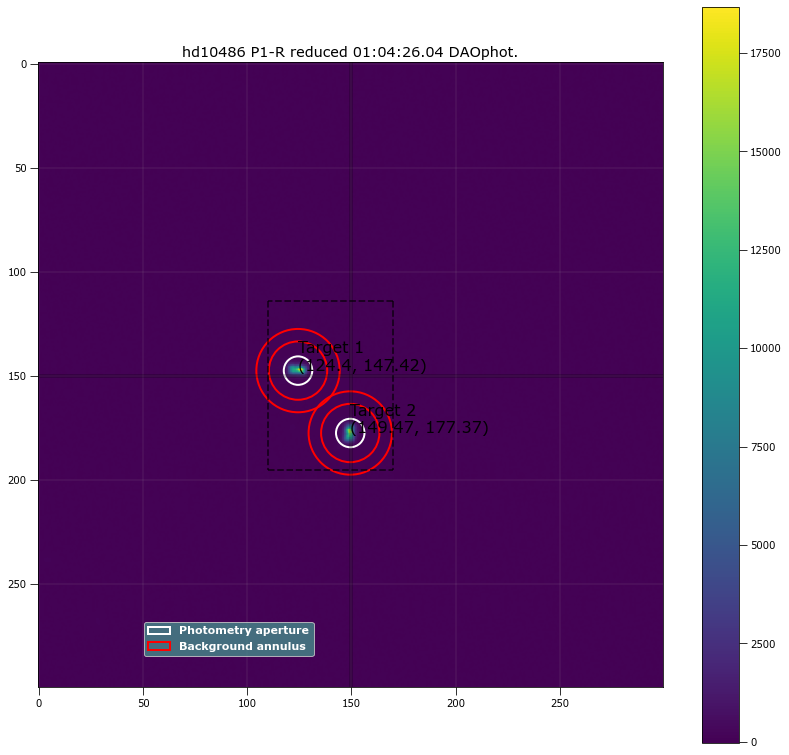

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 124.40333 147.41992 ...          5789.7662       34217.49          138.56301
  2 149.47129 177.37313 ...          5684.9368      35005.007          141.64358

 Aperture are: 146.75557269350875 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 124.40333 147.41992 ...                 5758.0368             396227.69
  2 149.47129 177.37313 ...                  5652.502             396182.55
339 01:04:26.04 P1-R 2.0 124.40333103606186 147.41991949880224 396227.69144519017 5758.036792990901 149.47128717599713 177.3731318058058 396182.55

In [32]:
print("P1-R Filter")

res_apt_sum_list = []

start = 290
end = 340
filename = astropy.io.fits.open(target[start])[0].header['OBJECT']+"_"+astropy.io.fits.open(target[start])[0].header['FILTER']

workbook = xlsxwriter.Workbook('./stats/'+MJD+"_"+ filename+str(start)+"-" +str(end)  +'.xlsx')
worksheet = workbook.add_worksheet()
worksheet.write('A1', 'int')
worksheet.write('B1', 'time obs')
worksheet.write('C1', 'filter')
worksheet.write('D1', 'exptime')
worksheet.write('E1', 'pol_std 1 x center')
worksheet.write('F1', 'pol_std 1 y center')
worksheet.write('G1', 'pol_std 1 counts')
worksheet.write('H1', 'pol_std 1 error')
worksheet.write('I1', 'pol_std 2 x center')
worksheet.write('J1', 'pol_std 2 y center')
worksheet.write('K1', 'pol_std 2 counts')
worksheet.write('L1', 'pol_std 2 error')
worksheet.write('M1', 'q')
worksheet.write('N1', 'q error')
worksheet.write('O1', 'u')
worksheet.write('P1', 'u error')
worksheet.write('Q1', 'PD')
worksheet.write('R1', 'PD error')
worksheet.write('S1', 'PA')
worksheet.write('T1', 'PA error')

row = 1
column = 0
search_off = 150
siegma_search = 3
search_bracket = [36, 45, 40, 20]

target_1_x_p1 = []
target_1_y_p1 = []
target_2_x_p1 = []
target_2_y_p1 = []

for k in range(start, end ):
    reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(target[k]),
                                        [512, 512, 512, 512], 
                                        (m_biast, m_dark, m_flat), 
                                        False, True, False)

    #trial_radii = np.linspace(3.0, 7, num=60)
    #target_a = []
    #target_b = []
    #for radii in trial_radii:
    #Find the position
    DAO_positions = funcs_star_finder.dao_star_finder(reduced_obj, search_bracket, siegma_search, 
                                                        2200, search_off, 6.5, 14 , 20, False, False)
        
    if (len(DAO_positions) != 2):
        x_targ, y_targ, peak_targ  = funcs_star_finder.source_peak_finder(reduced_obj, 5,search_bracket, 900 , False, False) #what do I return from this?
        apt_pos = funcs_star_finder.plot_spotted(reduced_obj, search_off, search_bracket , x_targ, y_targ, peak_targ, False, False)
        DAO_positions = funcs_star_finder.peak_to_DAO(apt_pos)
            
    print(k, "object DAO positions:", DAO_positions)
    print("DAO position 1:", DAO_positions[0], "DAO position 2:", DAO_positions[1])
    
    target_1_x_p1.append( DAO_positions[0][0]         )
    target_1_y_p1.append( DAO_positions[0][1]         )
    target_2_x_p1.append( DAO_positions[1][0]         )
    target_2_y_p1.append( DAO_positions[1][1]         )
    
    print("\n")
    
print("mean target_1_x:", np.mean(target_1_x_p1)   )
print("mean target_1_y:", np.mean(target_1_y_p1)   )
print("mean target_2_x:", np.mean(target_2_x_p1)   )
print("mean target_2_y:", np.mean(target_2_y_p1)   )

#apply one last correction here

print("\n")
phot_tab = funcs_apt_phot.apt_phot_local_bkg_sub(reduced_obj, search_off, search_bracket, DAO_positions, 6.5, 14 , 20, False, False)
print("These are your points")
t_1_x_f_offset = -1.15
t_1_y_f_offset = -0.2
t_2_x_f_offset = 0.1
t_2_y_f_offset = 1

print("\n")

for k in range(start, end ):
    reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(target[k]),
                                        [512, 512, 512, 512], 
                                        (m_biast, m_dark, m_flat), 
                                        False, True, False)
    
    trial_radii = np.linspace(5.5, 9, num=60)
    target_a = []
    target_b = []
    for radii in trial_radii:
        phot_tab = funcs_apt_phot.apt_phot_local_bkg_sub(reduced_obj, search_off, search_bracket, DAO_positions, radii, 14 , 20, False, False)
        target_a.append(phot_tab['residual_aperture_sum'][0])
        target_b.append(phot_tab['residual_aperture_sum'][1])

    combine_target = [target_a, target_b] #, target_c, target_d]
    
    good_radii=funcs_apt_phot.solve_apt(combine_target, trial_radii, False) #good radii should be saved as part of the data

    print("Aperture radius for", reduced_obj[0].header['TIME-OBS'],"is", good_radii)
    phot_tab = funcs_apt_phot.apt_phot_local_bkg_sub(reduced_obj, search_off, search_bracket, [[np.mean(target_1_x_p1)+ t_1_x_f_offset,
                                                                                                np.mean(target_1_y_p1)+ t_1_y_f_offset ],
                                                                                               [np.mean(target_2_x_p1)+ t_2_x_f_offset, 
                                                                                                np.mean(target_2_y_p1)+ t_2_y_f_offset]],good_radii, 14 , 20, True, False)        

    print(k, 
          astropy.io.fits.open(target[k])[0].header['TIME-OBS'],
          astropy.io.fits.open(target[k])[0].header['FILTER'],
          astropy.io.fits.open(target[k])[0].header['EXPTIME'],
          phot_tab['xcenter'][0].value, phot_tab['ycenter'][0].value,
          phot_tab['residual_aperture_sum'][0], phot_tab['residual_aperture_sum_err'][0],
          phot_tab['xcenter'][1].value, phot_tab['ycenter'][1].value,
          phot_tab['residual_aperture_sum'][1], phot_tab['residual_aperture_sum_err'][1],"\n")
    
    write_this = [k, 
          astropy.io.fits.open(target[k])[0].header['TIME-OBS'],
          astropy.io.fits.open(target[k])[0].header['FILTER'],
          astropy.io.fits.open(target[k])[0].header['EXPTIME'],
          phot_tab['xcenter'][0].value, phot_tab['ycenter'][0].value,
          phot_tab['residual_aperture_sum'][0], phot_tab['residual_aperture_sum_err'][0],
          phot_tab['xcenter'][1].value, phot_tab['ycenter'][1].value,
          phot_tab['residual_aperture_sum'][1], phot_tab['residual_aperture_sum_err'][1]] #,

    for item in write_this :
        worksheet.write(row, column, item)
        column += 1
        
    column = 0
    row += 1
    
workbook.close()

In [ ]:
#it cannot solve for the median

7.101694915254237
7.398305084745763
7.101694915254237
7.16101694915254
7.220338983050848
7.25

P3-R Filter
481 object DAO positions: [[131, 131], [131, 169]]
DAO position 1: [131, 131] DAO position 2: [131, 169]


482 object DAO positions: [[131, 131], [130, 169]]
DAO position 1: [131, 131] DAO position 2: [130, 169]


483 object DAO positions: [[131, 132], [130, 170]]
DAO position 1: [131, 132] DAO position 2: [130, 170]


484 object DAO positions: [[131, 131], [131, 168]]
DAO position 1: [131, 131] DAO position 2: [131, 168]


485 object DAO positions: [[130.24545142 168.88118992]
 [127.89317147 172.34855806]]
DAO position 1: [130.24545142 168.88118992] DAO position 2: [127.89317147 172.34855806]


486 object DAO positions: [[131, 131], [130, 169]]
DAO position 1: [131, 131] DAO position 2: [130, 169]


487 object DAO positions: [[130.43633381 131.1865682 ]
 [129.80776051 168.67486569]]
DAO position 1: [130.43633381 131.1865682 ] DAO position 2: [129.80776051 168.67486569]


488 object DAO positions: [[131, 131], [130, 169]]
DAO position 1: [131, 131] DAO position 2: [130, 169

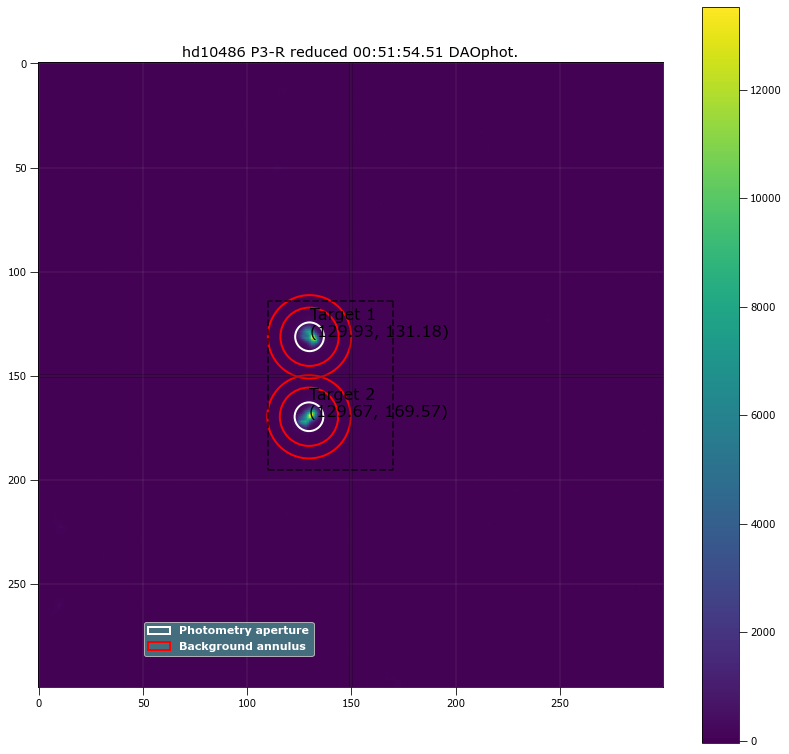

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          4903.4537      34635.047          139.98431
  2 129.66823 169.56957 ...          5026.1943      34364.739          139.18619

 Aperture are: 149.31415217438408 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                   4870.84             386863.41
  2 129.66823 169.56957 ...                 4993.7665             390809.02
481 00:51:54.51 P3-R 2.0 129.9343788858006 131.1831210601847 386863.409432894 4870.840004786037 129.66823091590214 169.56956908830477 390809.02228

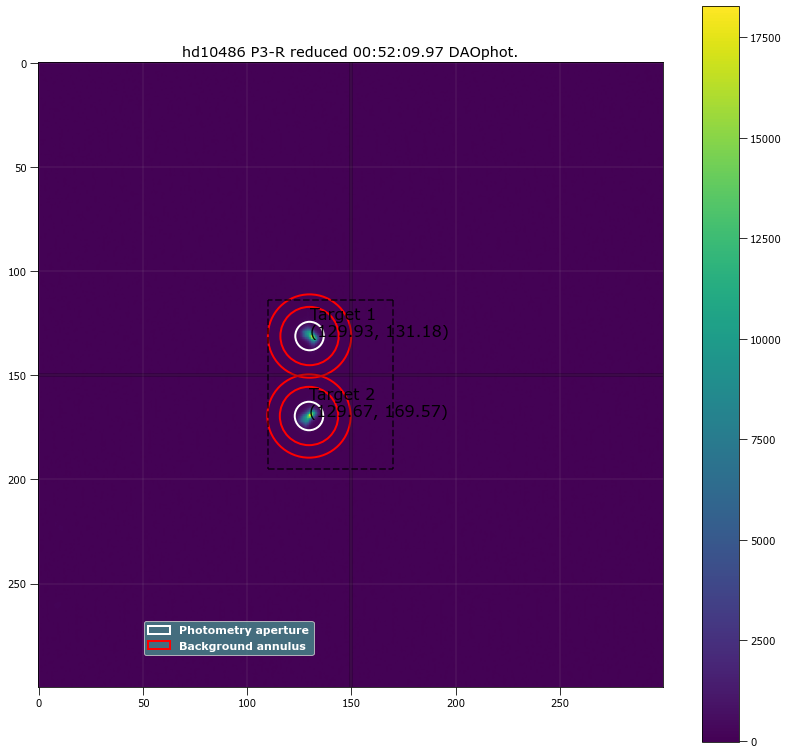

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5413.4817      34357.233          138.57352
  2 129.66823 169.56957 ...          5540.5573      34136.377          138.36084

 Aperture are: 146.75557269350875 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5381.7499             387065.96
  2 129.66823 169.56957 ...                 5508.8742              391326.1
482 00:52:09.97 P3-R 2.0 129.9343788858006 131.1831210601847 387065.95515118336 5381.749911436166 129.66823091590214 169.56956908830477 391326.098

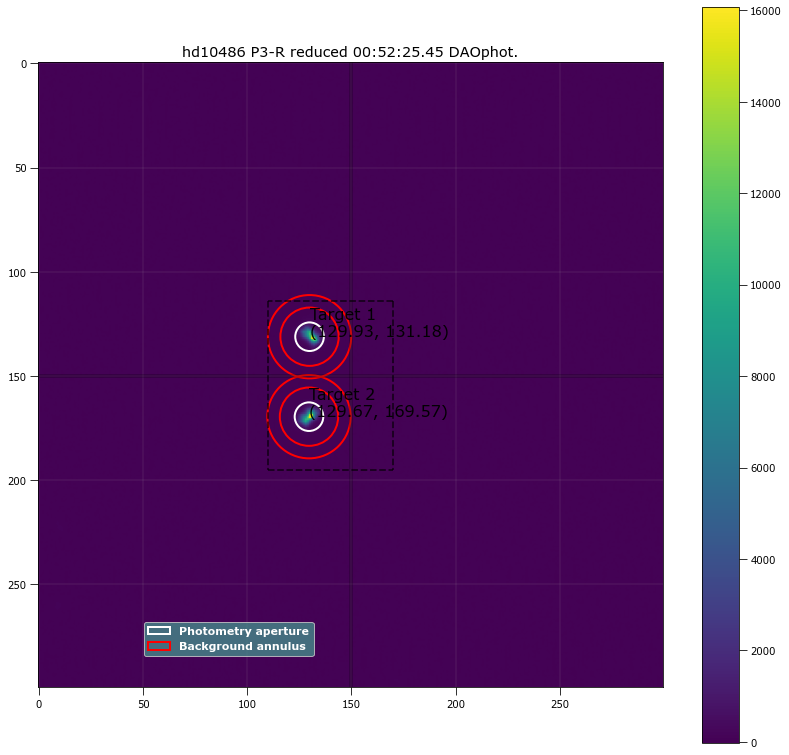

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5238.9247      34378.491          138.89521
  2 129.66823 169.56957 ...          5373.7934      33753.137          136.27806

 Aperture are: 148.03209853635906 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5206.8426             386439.45
  2 129.66823 169.56957 ...                 5342.3158             392858.03
483 00:52:25.45 P3-R 2.0 129.9343788858006 131.1831210601847 386439.4512099639 5206.842587789446 129.66823091590214 169.56956908830477 392858.0333

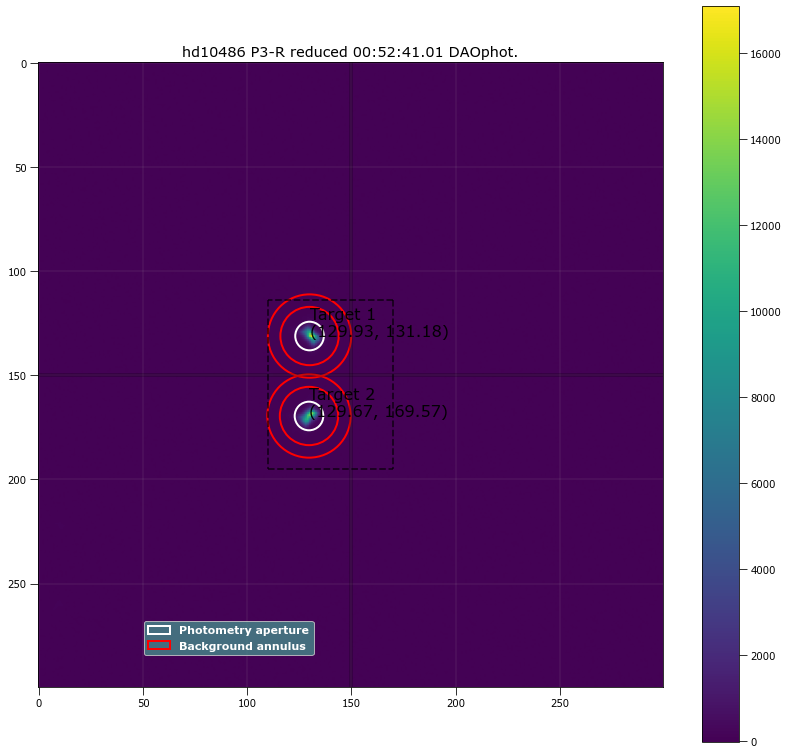

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5310.0635      34118.866          138.19726
  2 129.66823 169.56957 ...          5309.0395      34187.099          138.57554

 Aperture are: 148.03209853635906 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5278.1426             386931.51
  2 129.66823 169.56957 ...                 5277.0312             392881.75
484 00:52:41.01 P3-R 2.0 129.9343788858006 131.1831210601847 386931.509759181 5278.142628530047 129.66823091590214 169.56956908830477 392881.74691

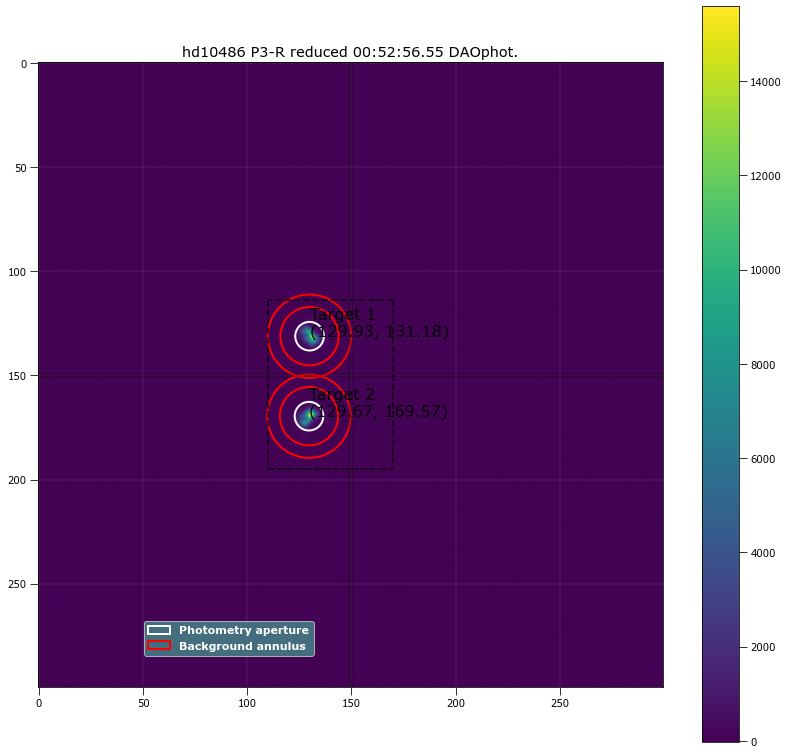

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          4918.7344      34359.453          139.01239
  2 129.66823 169.56957 ...           5111.789      34243.104          138.52697

 Aperture are: 148.03209853635906 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 4886.6252             387004.01
  2 129.66823 169.56957 ...                  5079.792             390935.49
485 00:52:56.55 P3-R 2.0 129.9343788858006 131.1831210601847 387004.0106876396 4886.625233150478 129.66823091590214 169.56956908830477 390935.4937

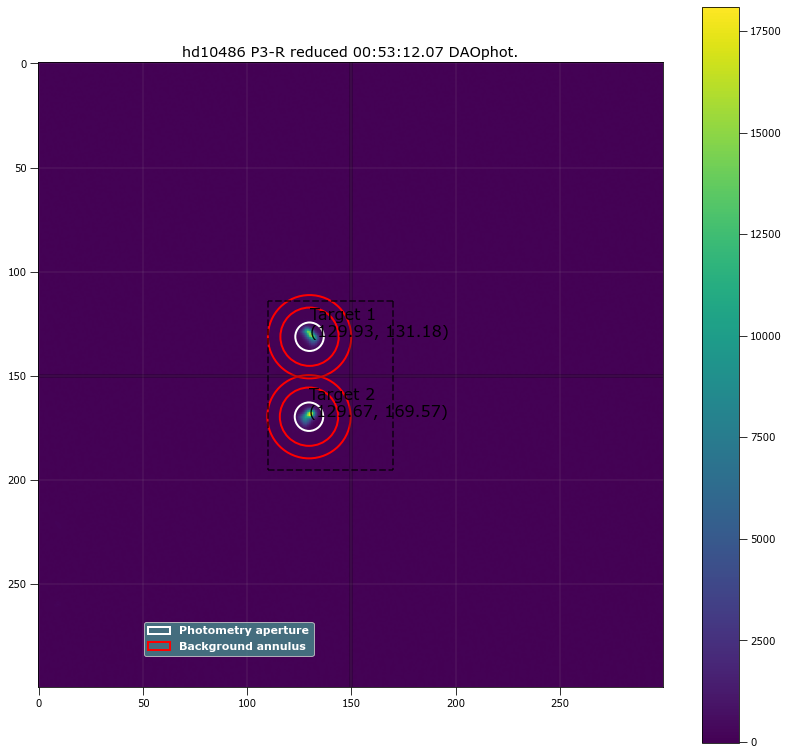

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5534.4382      34328.935          138.90887
  2 129.66823 169.56957 ...          5764.4948      33832.221          136.54684

 Aperture are: 146.75557269350875 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5502.6296             388400.88
  2 129.66823 169.56957 ...                 5733.2271             395680.99
486 00:53:12.07 P3-R 2.0 129.9343788858006 131.1831210601847 388400.8810122252 5502.629642719641 129.66823091590214 169.56956908830477 395680.9877

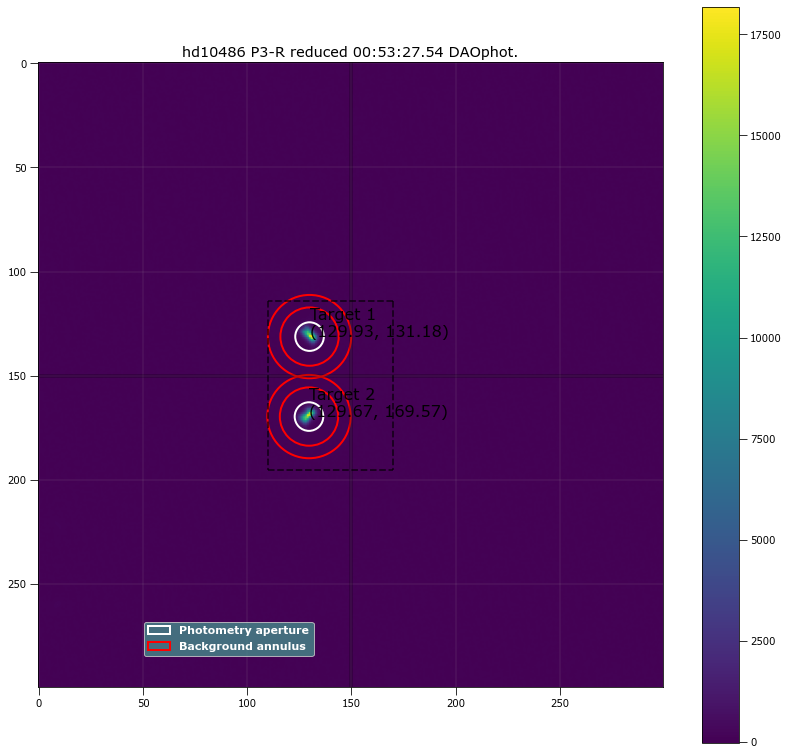

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5837.9481      34505.415          139.62684
  2 129.66823 169.56957 ...           5886.178       34521.74          139.49754

 Aperture are: 148.03209853635906 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5805.6969             393674.71
  2 129.66823 169.56957 ...                 5853.9567             399428.71
487 00:53:27.54 P3-R 2.0 129.9343788858006 131.1831210601847 393674.71076186764 5805.696937322156 129.66823091590214 169.56956908830477 399428.711

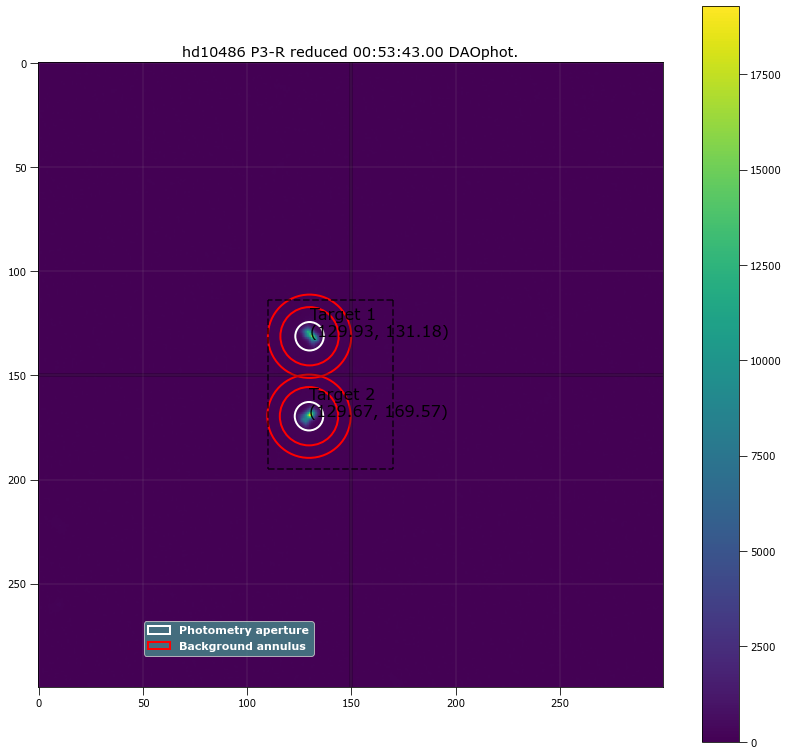

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5412.2446      34393.109          139.07995
  2 129.66823 169.56957 ...          5555.6671      34137.082          138.37547

 Aperture are: 146.75557269350873 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5380.3968             386540.84
  2 129.66823 169.56957 ...                 5523.9807             393354.23
488 00:53:43.00 P3-R 2.0 129.9343788858006 131.1831210601847 386540.8429698158 5380.3967847871245 129.66823091590214 169.56956908830477 393354.234

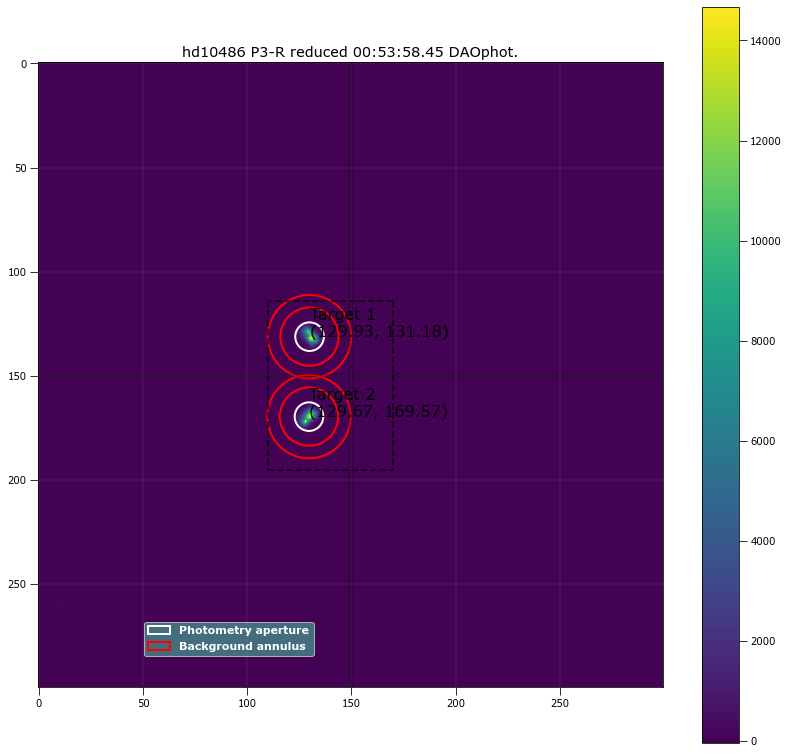

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5235.1279      34362.637          138.93357
  2 129.66823 169.56957 ...           5350.603      33454.811          135.48159

 Aperture are: 148.03209853635906 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5203.0369             390484.87
  2 129.66823 169.56957 ...                 5319.3093             397530.16
489 00:53:58.45 P3-R 2.0 129.9343788858006 131.1831210601847 390484.86522663245 5203.036887648164 129.66823091590214 169.56956908830477 397530.155

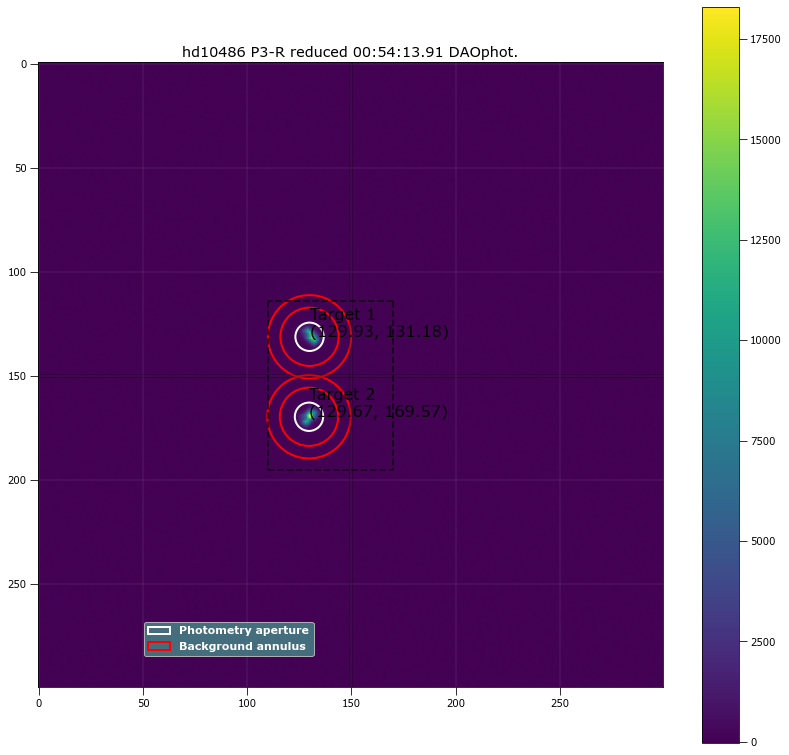

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5402.5141      34146.761          138.25149
  2 129.66823 169.56957 ...          5596.4336      34167.213          137.99712

 Aperture are: 145.48457464583316 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5371.1302             388341.88
  2 129.66823 169.56957 ...                 5565.1074             395762.42
490 00:54:13.91 P3-R 2.0 129.9343788858006 131.1831210601847 388341.8778285358 5371.1301890237455 129.66823091590214 169.56956908830477 395762.417

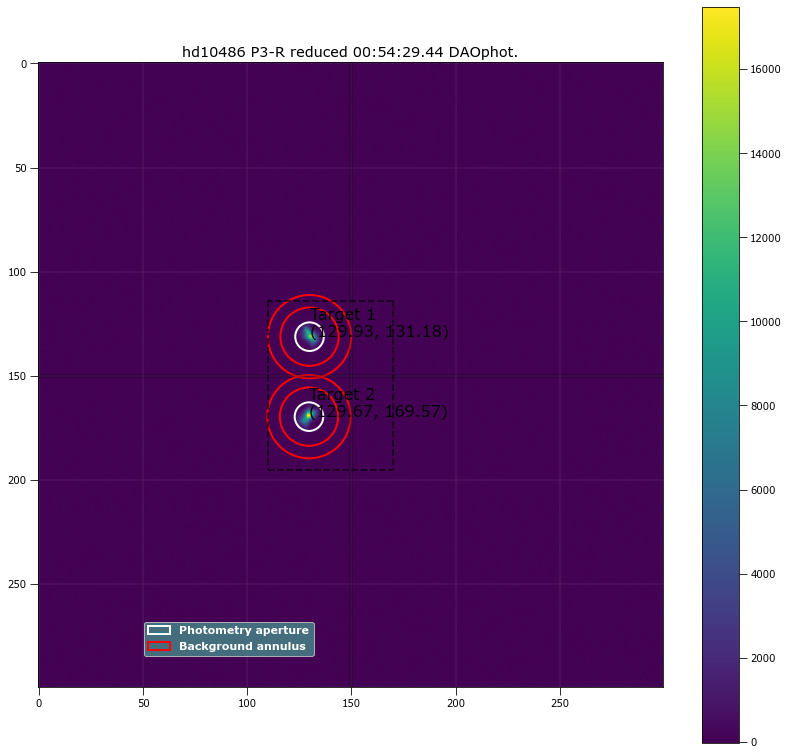

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5273.1589      34037.171           137.7393
  2 129.66823 169.56957 ...          5473.5645      34416.305          138.99408

 Aperture are: 148.03209853635906 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5241.3438             384562.48
  2 129.66823 169.56957 ...                 5441.4595             389314.24
491 00:54:29.44 P3-R 2.0 129.9343788858006 131.1831210601847 384562.4790368791 5241.343785853781 129.66823091590214 169.56956908830477 389314.2434

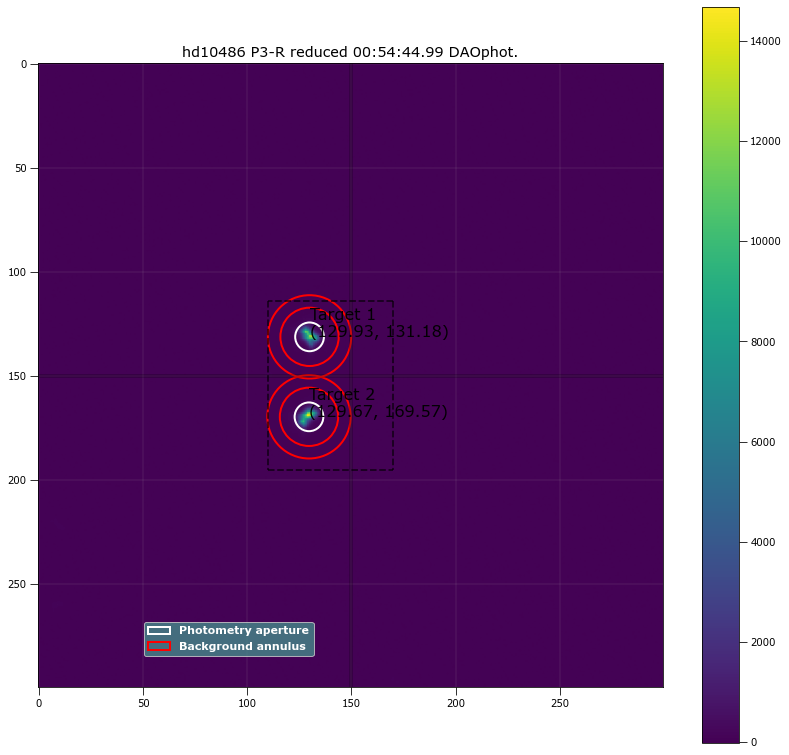

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          4990.7848      33922.732          137.25464
  2 129.66823 169.56957 ...          5157.5806      33852.789          137.47729

 Aperture are: 149.31415217438408 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 4958.8071             386229.68
  2 129.66823 169.56957 ...                  5125.551             390410.41
492 00:54:44.99 P3-R 2.0 129.9343788858006 131.1831210601847 386229.68195738125 4958.807075093656 129.66823091590214 169.56956908830477 390410.408

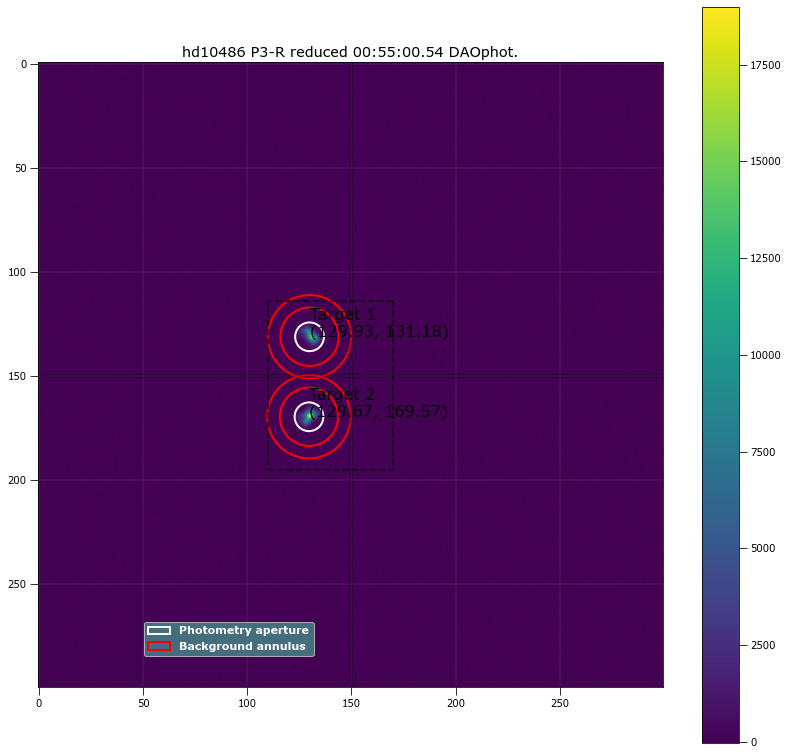

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5211.9879      34264.486          138.73073
  2 129.66823 169.56957 ...           5410.535      34266.776          138.58321

 Aperture are: 149.31415217438408 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5179.6662             385880.45
  2 129.66823 169.56957 ...                 5378.2477             392127.64
493 00:55:00.54 P3-R 2.0 129.9343788858006 131.1831210601847 385880.45085675176 5179.666241078661 129.66823091590214 169.56956908830477 392127.636

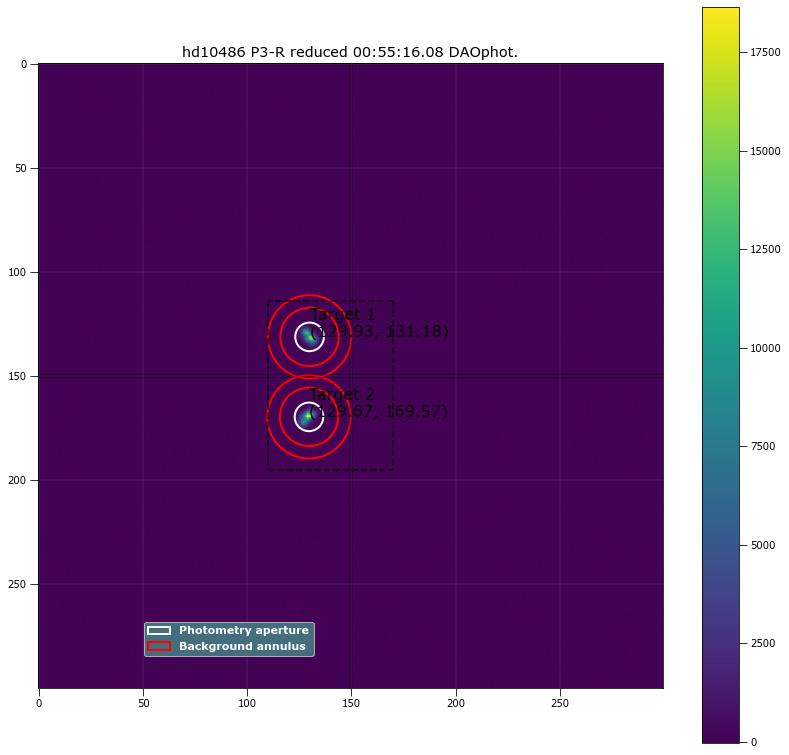

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5439.2066      33870.322          137.11448
  2 129.66823 169.56957 ...          5622.2473      34522.454          139.65097

 Aperture are: 148.03209853635906 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5407.5358             384778.46
  2 129.66823 169.56957 ...                 5589.9906             390848.49
494 00:55:16.08 P3-R 2.0 129.9343788858006 131.1831210601847 384778.46262202953 5407.535832323295 129.66823091590214 169.56956908830477 390848.492

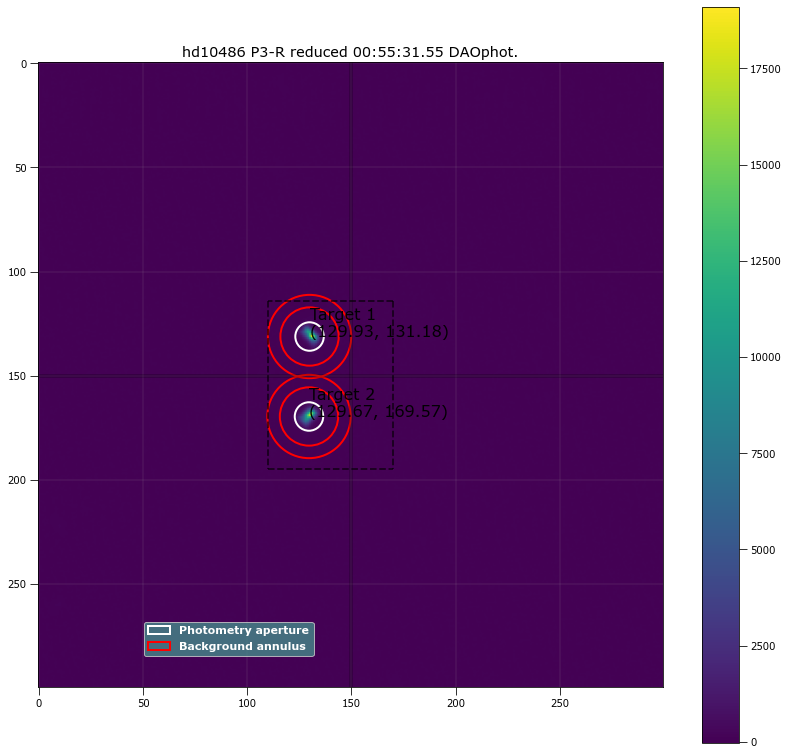

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5436.1874      34375.154          139.20131
  2 129.66823 169.56957 ...          5450.3405      34536.081          139.77633

 Aperture are: 146.75557269350873 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5404.3119             385190.16
  2 129.66823 169.56957 ...                 5418.3333             392264.96
495 00:55:31.55 P3-R 2.0 129.9343788858006 131.1831210601847 385190.1613048019 5404.311866555957 129.66823091590214 169.56956908830477 392264.9624

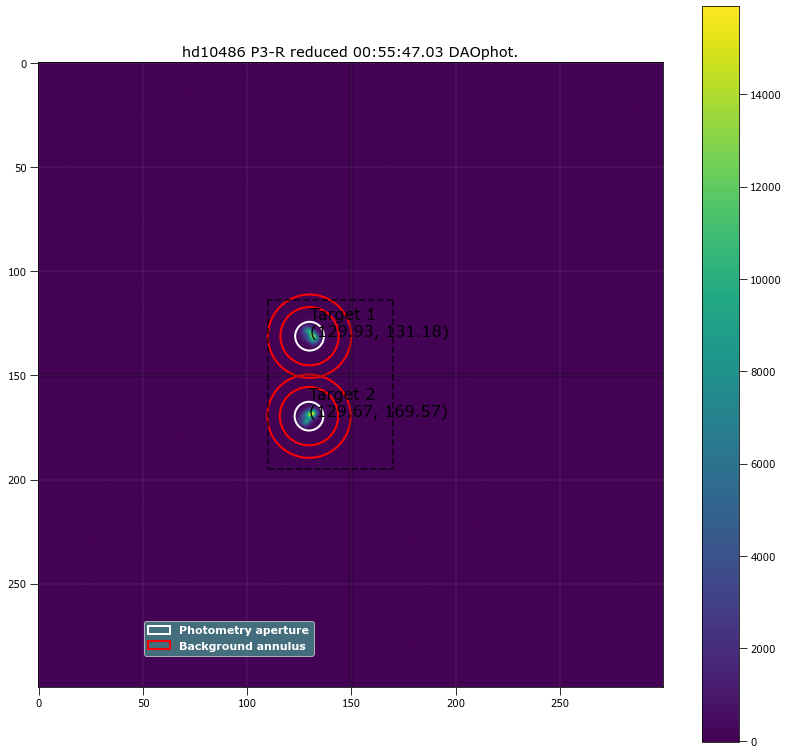

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5148.6577      34074.996          137.80957
  2 129.66823 169.56957 ...          5306.2993      33998.736          137.57448

 Aperture are: 149.31415217438408 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5116.5507             388933.17
  2 129.66823 169.56957 ...                  5274.247             394702.93
496 00:55:47.03 P3-R 2.0 129.9343788858006 131.1831210601847 388933.1733510055 5116.550688907888 129.66823091590214 169.56956908830477 394702.9267

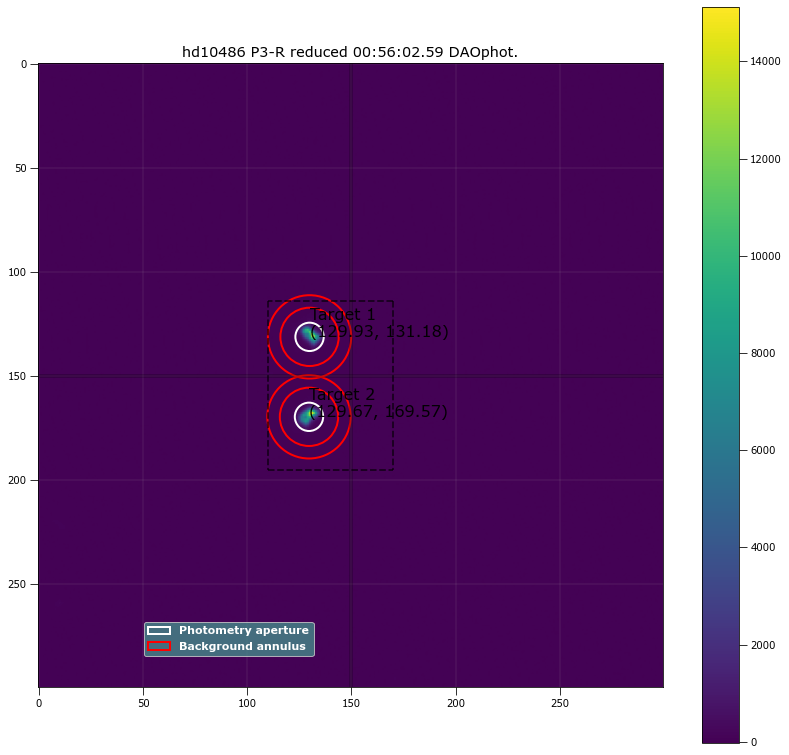

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5180.0337      33542.329          135.89472
  2 129.66823 169.56957 ...          5311.9666      33634.368           136.2739

 Aperture are: 145.48457464583316 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5149.1848             392081.86
  2 129.66823 169.56957 ...                 5281.0316             399536.12
497 00:56:02.59 P3-R 2.0 129.9343788858006 131.1831210601847 392081.858429452 5149.184826137129 129.66823091590214 169.56956908830477 399536.11803

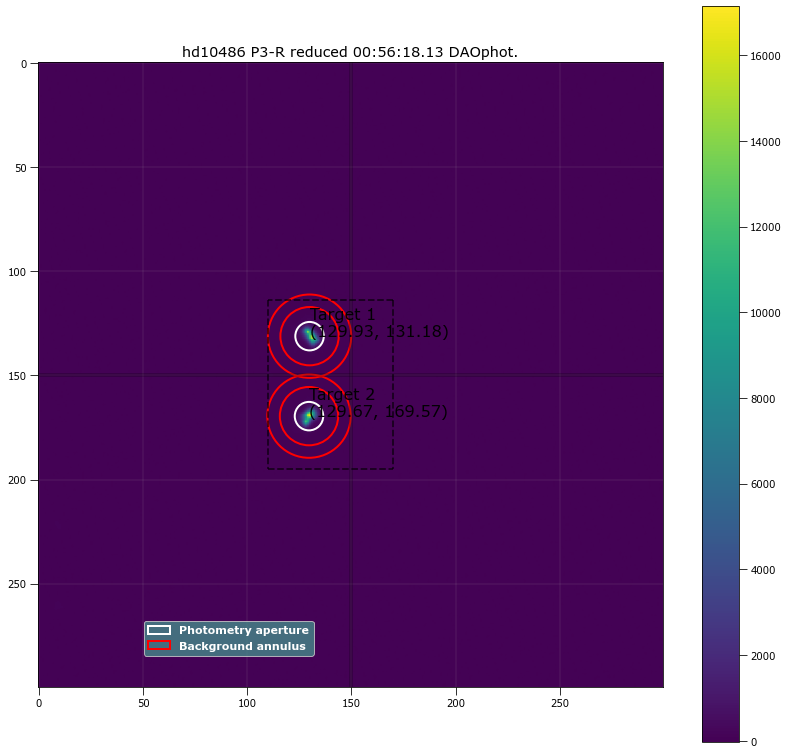

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5413.5993      34478.708          139.48812
  2 129.66823 169.56957 ...          5518.5288      33834.303          136.97486

 Aperture are: 146.75557269350875 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                  5381.658             387491.94
  2 129.66823 169.56957 ...                 5487.1631             394162.67
498 00:56:18.13 P3-R 2.0 129.9343788858006 131.1831210601847 387491.93544674787 5381.658022085312 129.66823091590214 169.56956908830477 394162.666

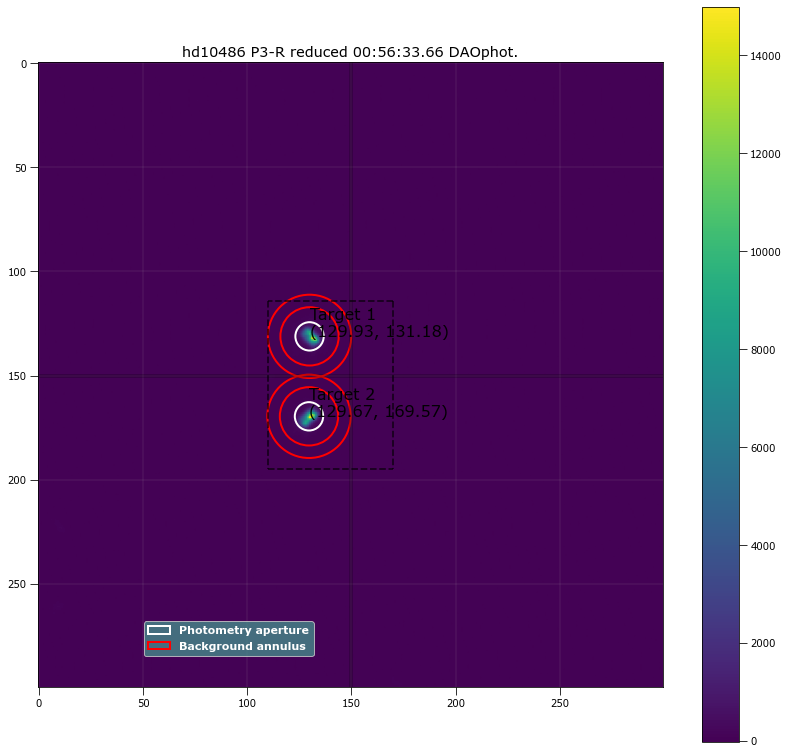

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5101.9377      33639.878          136.05913
  2 129.66823 169.56957 ...          5258.1812      33905.904           137.2637

 Aperture are: 145.48457464583316 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5071.0515             387225.59
  2 129.66823 169.56957 ...                 5227.0216             392085.87
499 00:56:33.66 P3-R 2.0 129.9343788858006 131.1831210601847 387225.5949432024 5071.051467040572 129.66823091590214 169.56956908830477 392085.8677

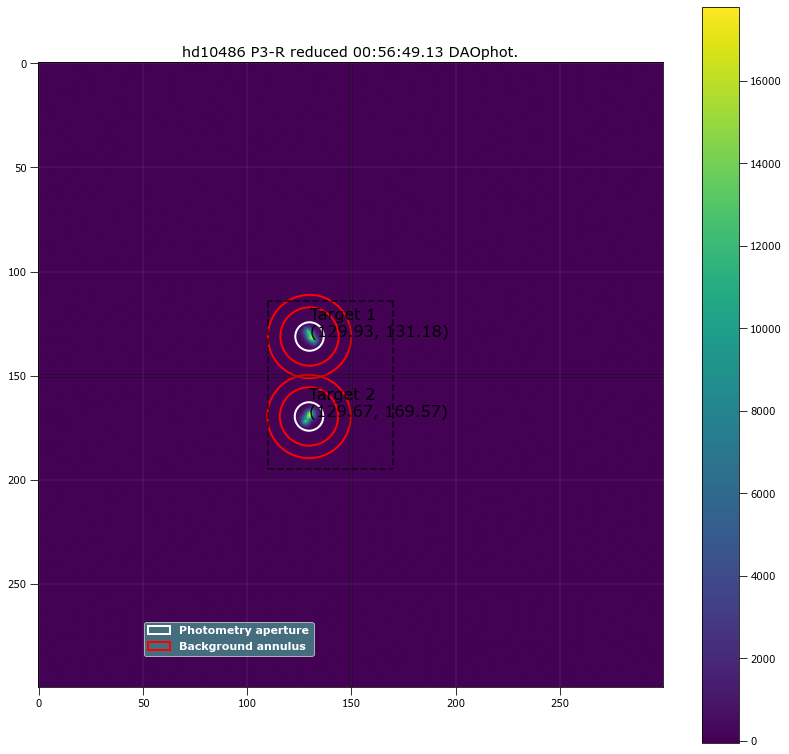

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5580.1231      33980.172          137.24554
  2 129.66823 169.56957 ...          5713.9933      34376.321          138.69217

 Aperture are: 146.75557269350875 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5548.6954             390465.78
  2 129.66823 169.56957 ...                 5682.2344             396158.27
500 00:56:49.13 P3-R 2.0 129.9343788858006 131.1831210601847 390465.7803135764 5548.6953796686885 129.66823091590214 169.56956908830477 396158.268

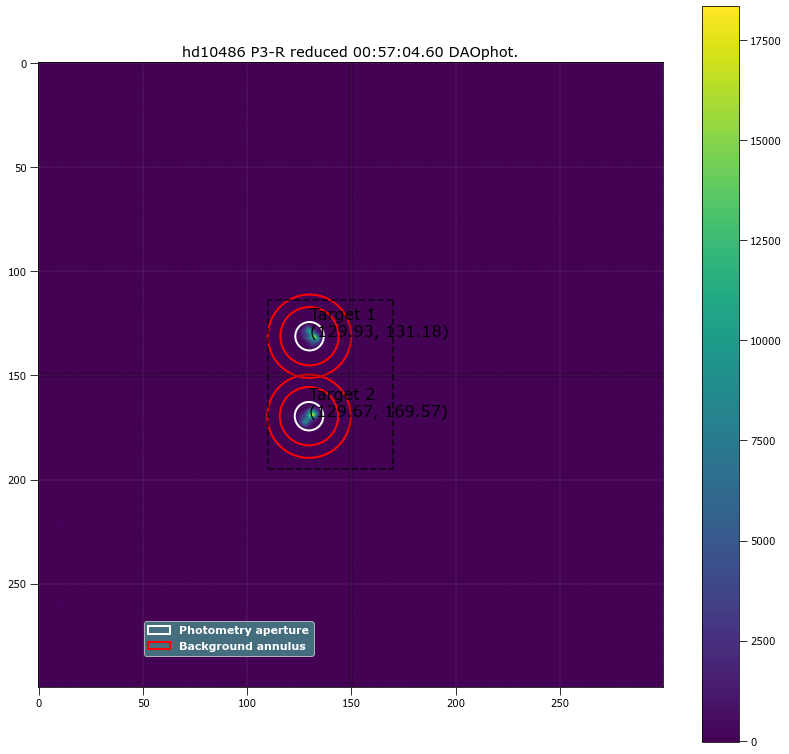

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5186.7732      34026.311          137.50912
  2 129.66823 169.56957 ...          5401.7998      34320.335          138.92368

 Aperture are: 146.75557269350875 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5155.2851             388631.54
  2 129.66823 169.56957 ...                 5369.9879             395782.14
501 00:57:04.60 P3-R 2.0 129.9343788858006 131.1831210601847 388631.5358952438 5155.285084885158 129.66823091590214 169.56956908830477 395782.1385

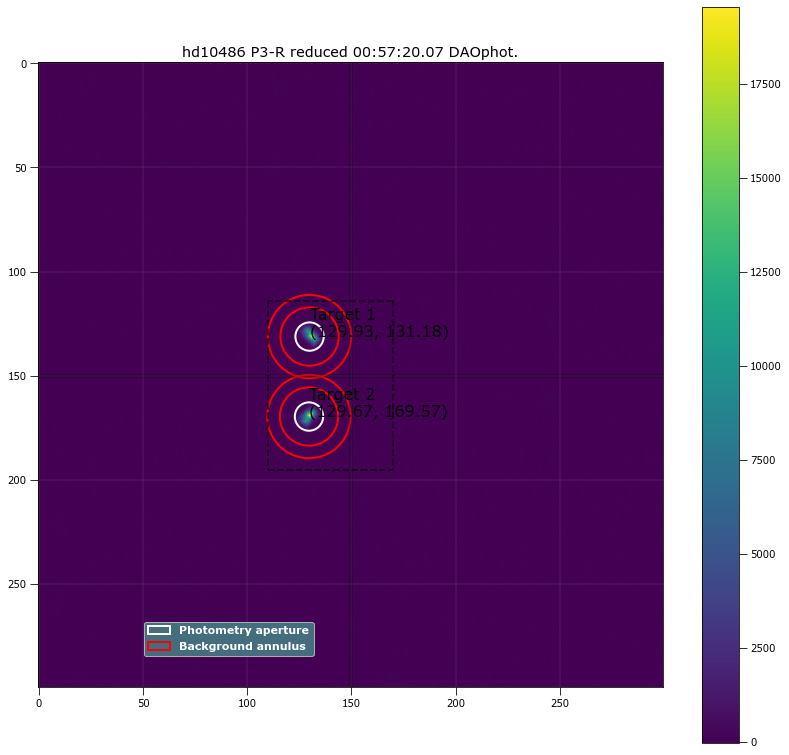

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5545.9159       33605.75          136.35546
  2 129.66823 169.56957 ...          5669.4483      34117.057          137.86767

 Aperture are: 145.48457464583316 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5514.9624             389850.88
  2 129.66823 169.56957 ...                 5638.1515             396506.18
502 00:57:20.07 P3-R 2.0 129.9343788858006 131.1831210601847 389850.8847256047 5514.962420429905 129.66823091590214 169.56956908830477 396506.1769

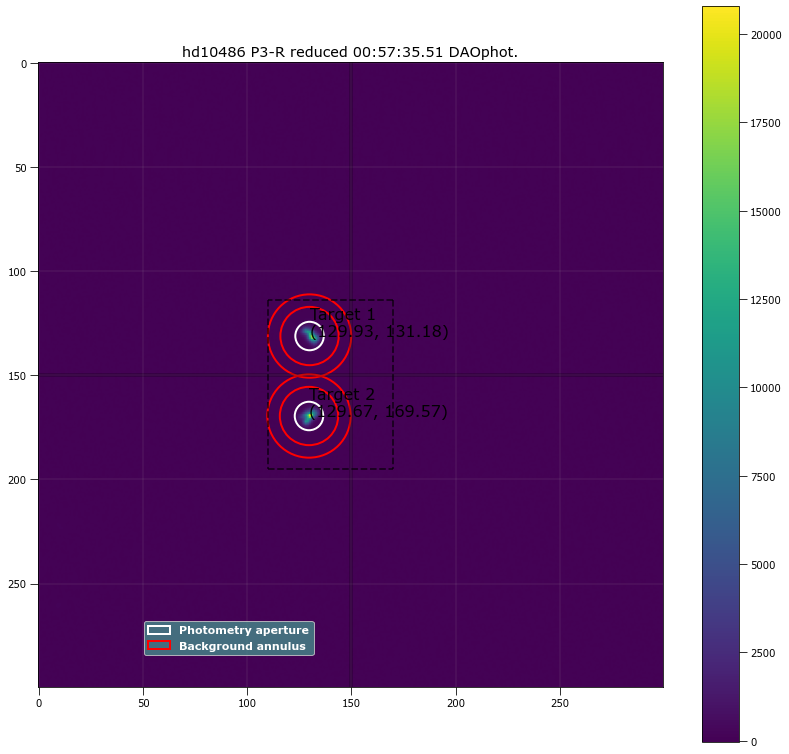

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5700.1708       34117.53          137.88724
  2 129.66823 169.56957 ...          5781.9188      33768.613           136.8403

 Aperture are: 146.75557269350875 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5668.5961             389787.64
  2 129.66823 169.56957 ...                 5750.5839             396216.86
503 00:57:35.51 P3-R 2.0 129.9343788858006 131.1831210601847 389787.643495132 5668.596101132849 129.66823091590214 169.56956908830477 396216.86437

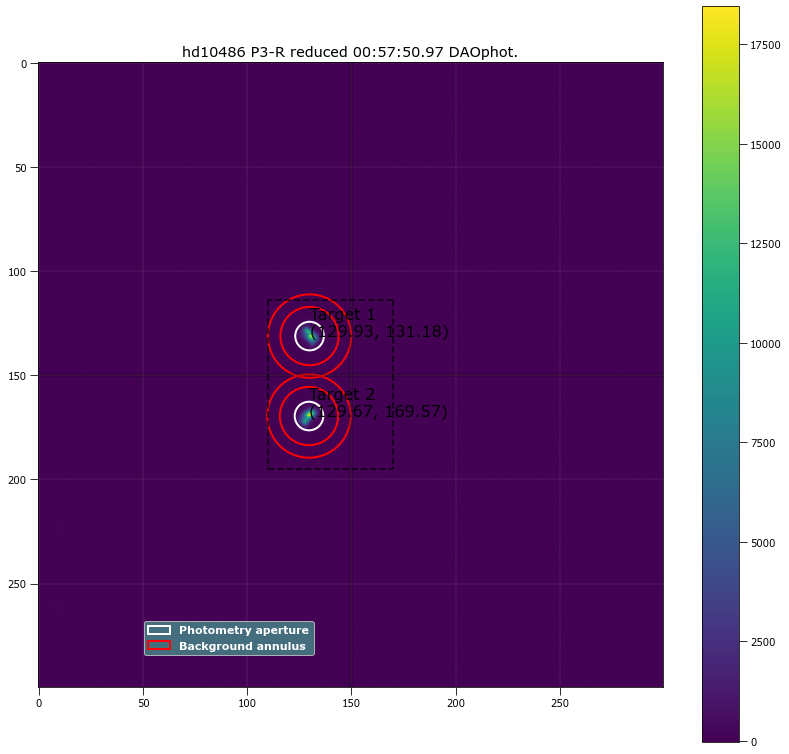

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5424.8079      33817.984          136.72673
  2 129.66823 169.56957 ...          5630.3578      33701.463          136.37591

 Aperture are: 148.03209853635906 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5393.2266             386941.48
  2 129.66823 169.56957 ...                 5598.8576             392577.65
504 00:57:50.97 P3-R 2.0 129.9343788858006 131.1831210601847 386941.4795916704 5393.226614362049 129.66823091590214 169.56956908830477 392577.6505

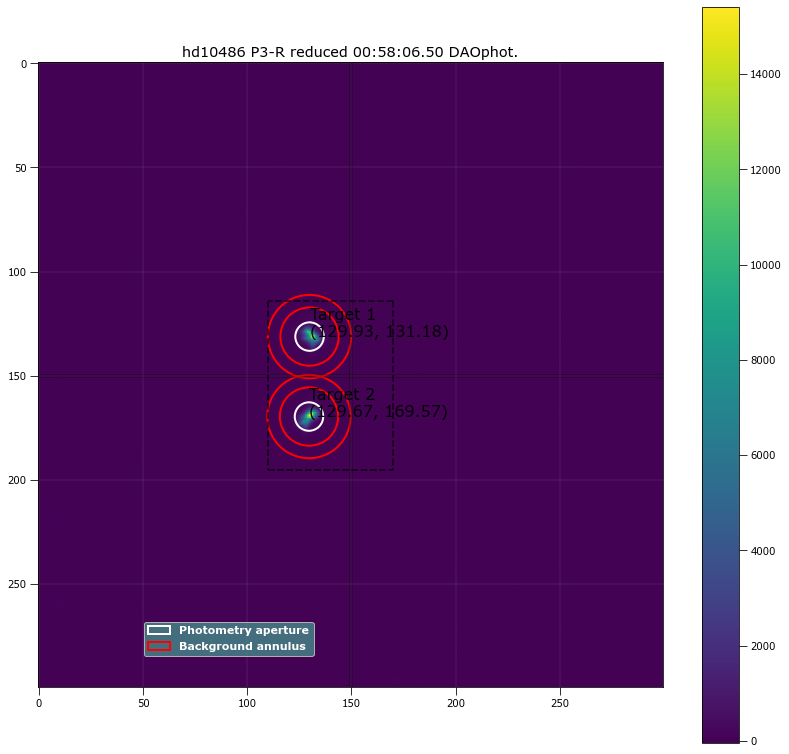

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          4976.4067      33844.751          137.05154
  2 129.66823 169.56957 ...          5165.6165      34379.108          139.04244

 Aperture are: 146.75557269350875 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 4945.0234             387172.37
  2 129.66823 169.56957 ...                 5133.7773             391390.13
505 00:58:06.50 P3-R 2.0 129.9343788858006 131.1831210601847 387172.36648296687 4945.023376362952 129.66823091590214 169.56956908830477 391390.127

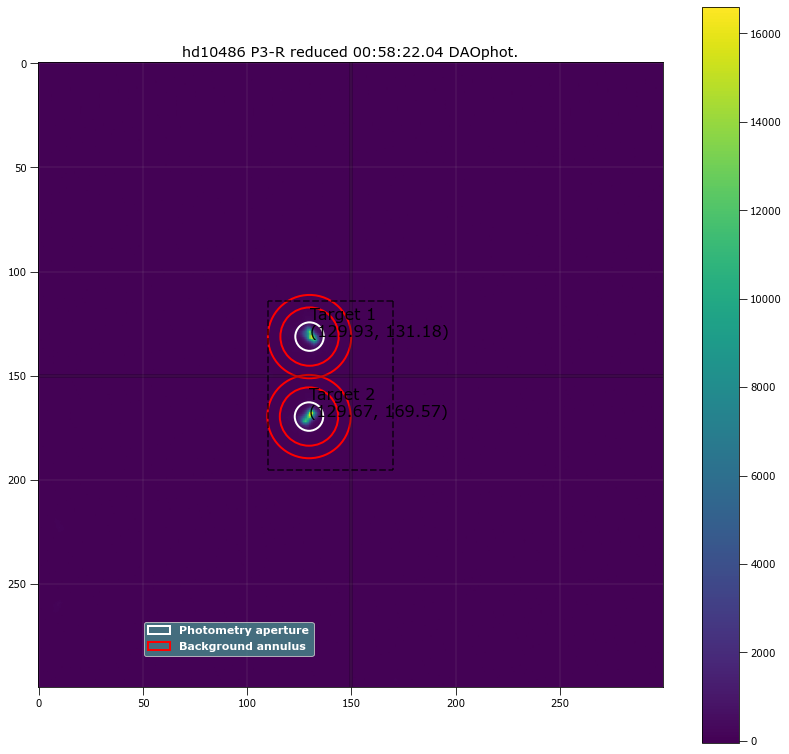

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5459.0935      34785.282          140.77547
  2 129.66823 169.56957 ...          5623.0992      34563.752          139.84744

 Aperture are: 146.75557269350875 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5426.8574             383584.25
  2 129.66823 169.56957 ...                 5591.0757             389510.49
506 00:58:22.04 P3-R 2.0 129.9343788858006 131.1831210601847 383584.2544192875 5426.857430998482 129.66823091590214 169.56956908830477 389510.4935

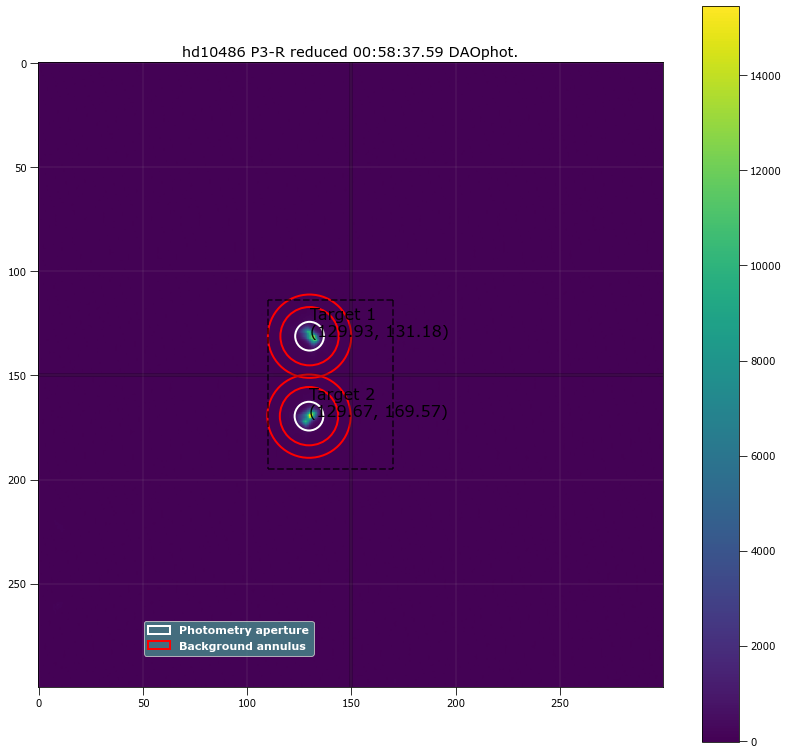

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5070.5829      34866.289          140.93143
  2 129.66823 169.56957 ...          5200.1364      34564.654          140.12514

 Aperture are: 149.31415217438408 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5037.7485              385014.6
  2 129.66823 169.56957 ...                 5167.4899             391088.94
507 00:58:37.59 P3-R 2.0 129.9343788858006 131.1831210601847 385014.59521734965 5037.748478969815 129.66823091590214 169.56956908830477 391088.941

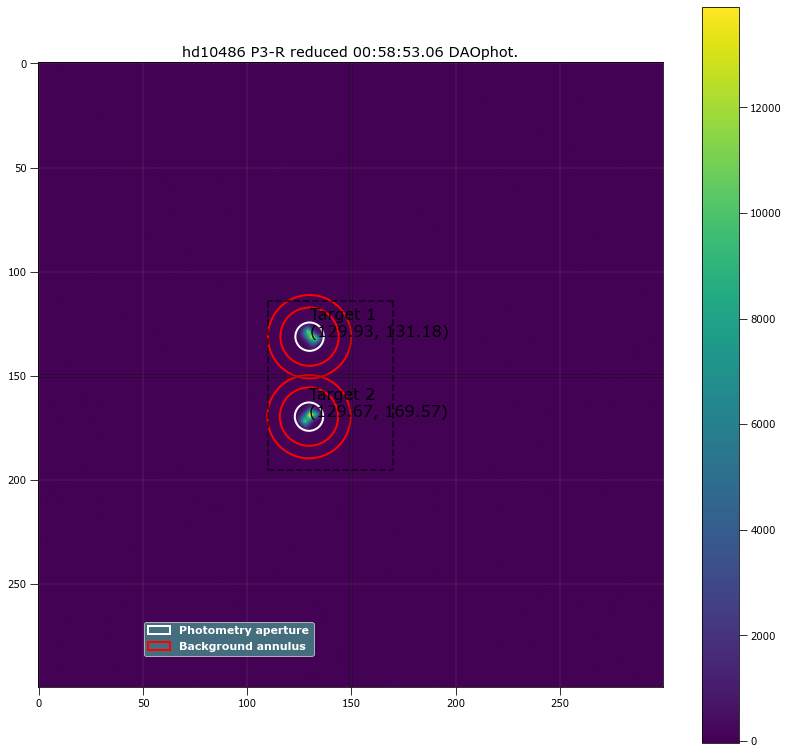

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5034.5826      34057.401          137.65469
  2 129.66823 169.56957 ...          5136.0535      33863.947          137.05764

 Aperture are: 145.48457464583316 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5003.3341             386331.36
  2 129.66823 169.56957 ...                 5104.9407             391826.91
508 00:58:53.06 P3-R 2.0 129.9343788858006 131.1831210601847 386331.3649828086 5003.334144215445 129.66823091590214 169.56956908830477 391826.9129

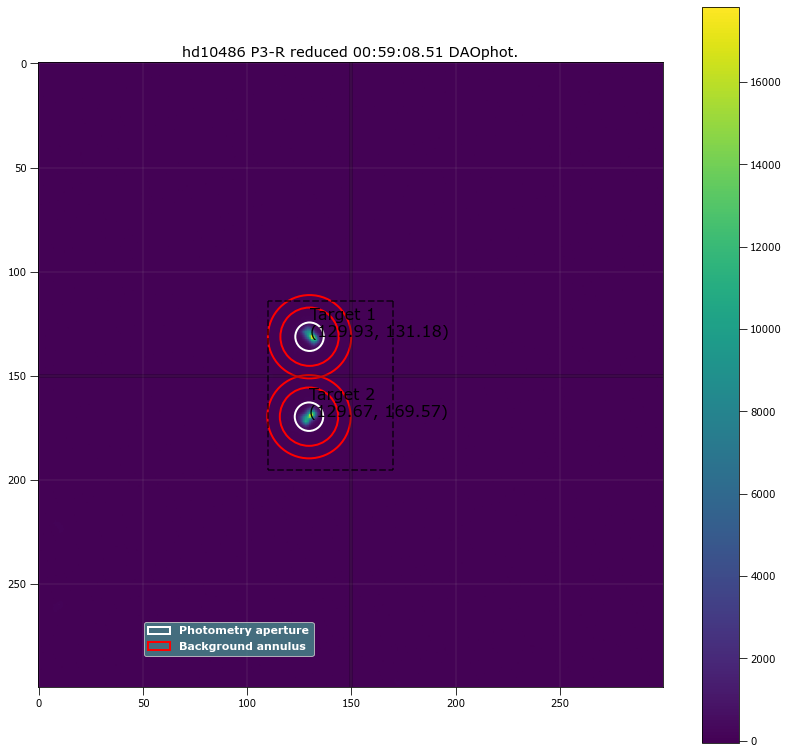

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5609.8598      33755.609          136.31199
  2 129.66823 169.56957 ...           5650.158       33633.15          136.04765

 Aperture are: 146.75557269350875 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5578.6459             389281.74
  2 129.66823 169.56957 ...                 5619.0046             395989.59
509 00:59:08.51 P3-R 2.0 129.9343788858006 131.1831210601847 389281.7395489018 5578.6458585218 129.66823091590214 169.56956908830477 395989.587912

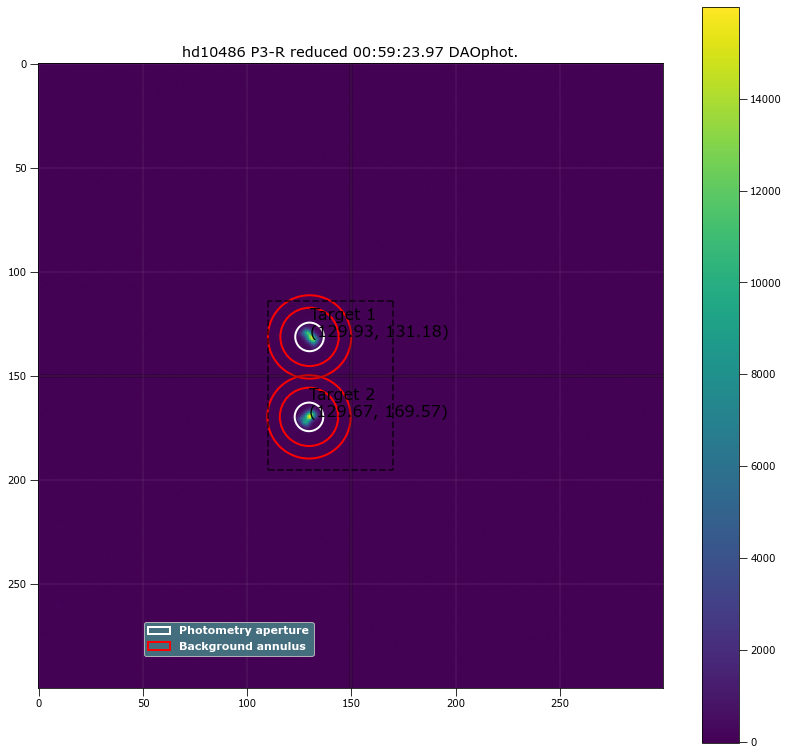

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...           5390.287      33962.268          137.48486
  2 129.66823 169.56957 ...          5460.2888      34324.256          138.75681

 Aperture are: 148.03209853635906 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5358.5306             387735.49
  2 129.66823 169.56957 ...                 5428.2386             393814.88
510 00:59:23.97 P3-R 2.0 129.9343788858006 131.1831210601847 387735.4868249132 5358.530633636069 129.66823091590214 169.56956908830477 393814.8795

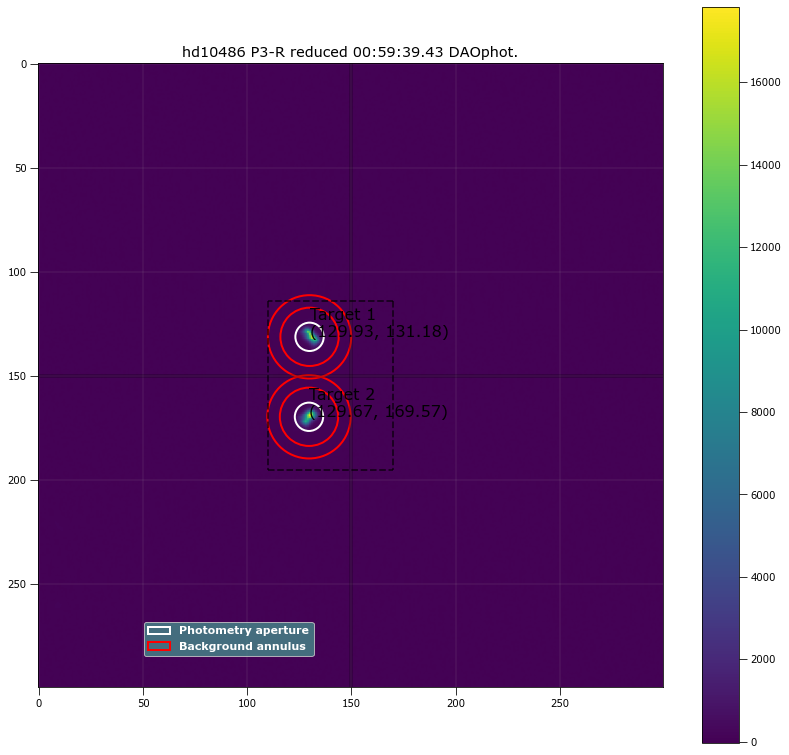

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5760.9075      33987.814          137.51765
  2 129.66823 169.56957 ...          5795.8598      34004.177          137.32487

 Aperture are: 145.48457464583316 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5729.6902             395679.14
  2 129.66823 169.56957 ...                 5764.6863             402272.03
511 00:59:39.43 P3-R 2.0 129.9343788858006 131.1831210601847 395679.1404218369 5729.690224663229 129.66823091590214 169.56956908830477 402272.0296

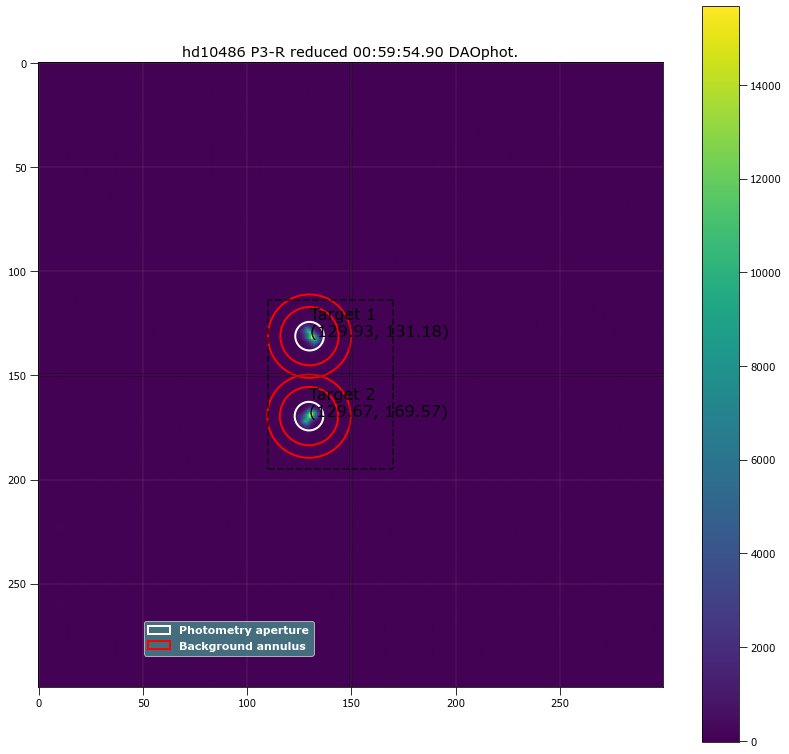

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5140.7857      34117.758          138.19312
  2 129.66823 169.56957 ...          5246.6038      34304.266           138.7199

 Aperture are: 148.03209853635906 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5108.8657              382682.1
  2 129.66823 169.56957 ...                 5214.5622              390533.7
512 00:59:54.90 P3-R 2.0 129.9343788858006 131.1831210601847 382682.09988249553 5108.865736285123 129.66823091590214 169.56956908830477 390533.696

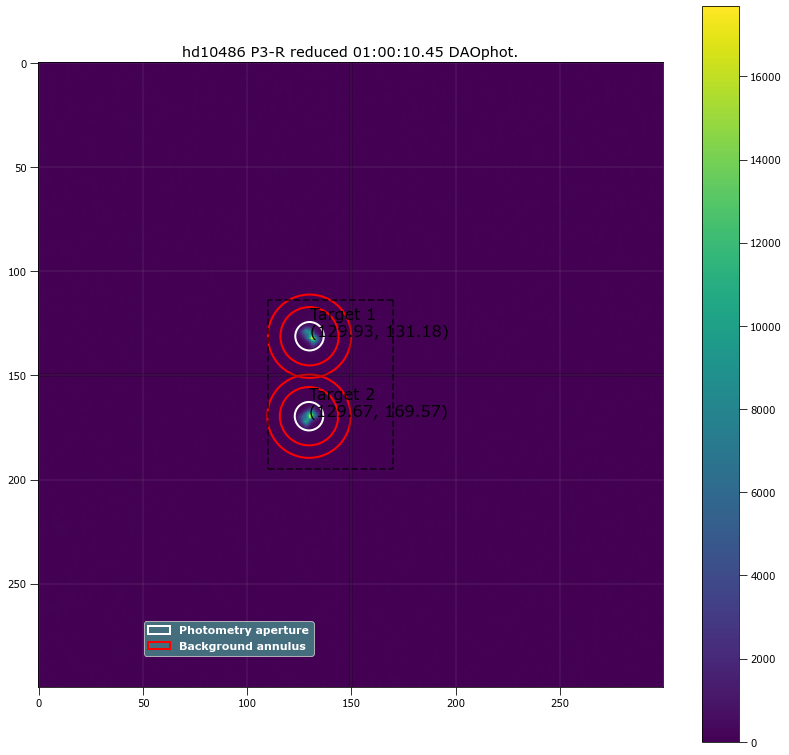

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5217.7658      34404.366          139.22013
  2 129.66823 169.56957 ...          5271.4058      34683.059          140.51199

 Aperture are: 146.75557269350875 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5185.8859             382673.22
  2 129.66823 169.56957 ...                 5239.2301             389227.02
513 01:00:10.45 P3-R 2.0 129.9343788858006 131.1831210601847 382673.21615693986 5185.885909799557 129.66823091590214 169.56956908830477 389227.016

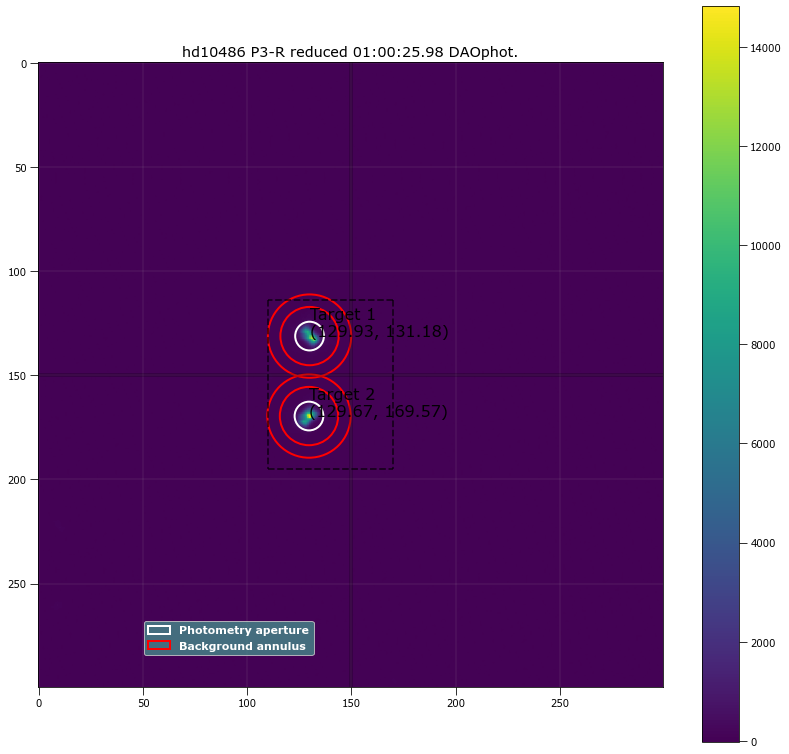

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          4959.6569      34481.179          139.36614
  2 129.66823 169.56957 ...          5086.6495       34370.98          139.22881

 Aperture are: 149.31415217438408 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 4927.1872             383990.03
  2 129.66823 169.56957 ...                 5054.2118              388571.6
514 01:00:25.98 P3-R 2.0 129.9343788858006 131.1831210601847 383990.0262609622 4927.187240815868 129.66823091590214 169.56956908830477 388571.5987

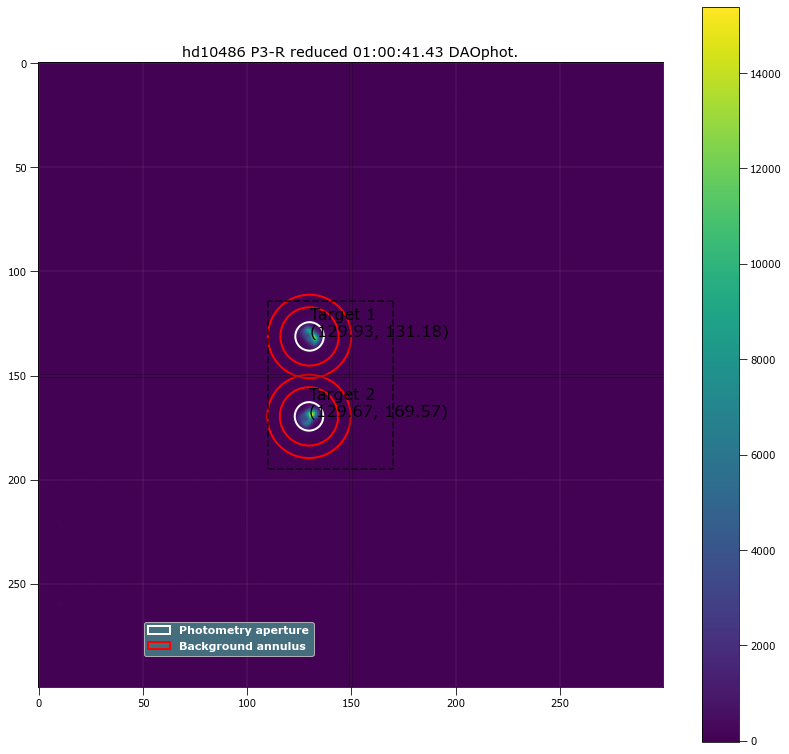

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          4726.7134       34555.92           139.9633
  2 129.66823 169.56957 ...          4911.3128      34255.541          138.57901

 Aperture are: 146.75557269350875 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 4694.6633             378472.58
  2 129.66823 169.56957 ...                 4879.5797             385068.89
515 01:00:41.43 P3-R 2.0 129.9343788858006 131.1831210601847 378472.58140820585 4694.6633243478545 129.66823091590214 169.56956908830477 385068.89

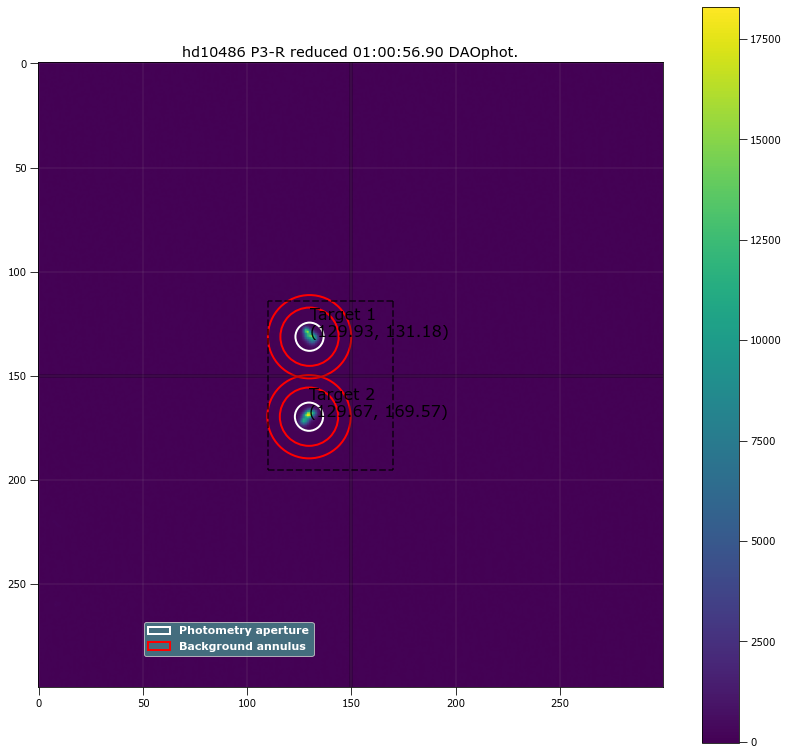

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5708.7381      33902.615          137.31192
  2 129.66823 169.56957 ...           5952.867      33409.241          135.35487

 Aperture are: 144.2191043933323 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5677.8386             396498.85
  2 129.66823 169.56957 ...                 5922.4079             402832.59
516 01:00:56.90 P3-R 2.0 129.9343788858006 131.1831210601847 396498.8506048237 5677.838592130972 129.66823091590214 169.56956908830477 402832.59219

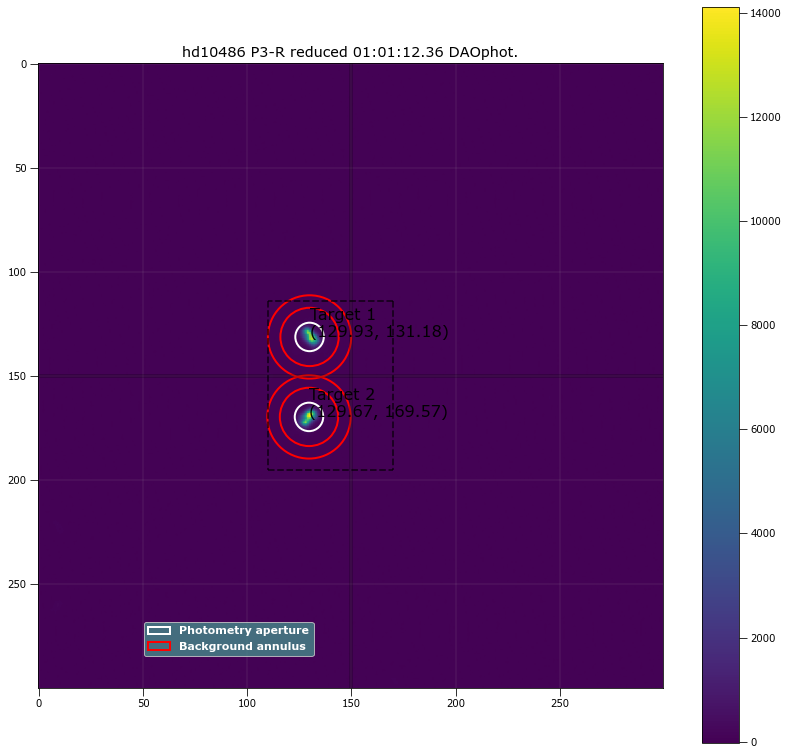

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5259.9925      33622.087          135.92736
  2 129.66823 169.56957 ...          5404.0311      33763.666          136.48977

 Aperture are: 146.75557269350875 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5228.8666             391369.48
  2 129.66823 169.56957 ...                 5372.7764             398360.72
517 01:01:12.36 P3-R 2.0 129.9343788858006 131.1831210601847 391369.4822091402 5228.866620155371 129.66823091590214 169.56956908830477 398360.7208

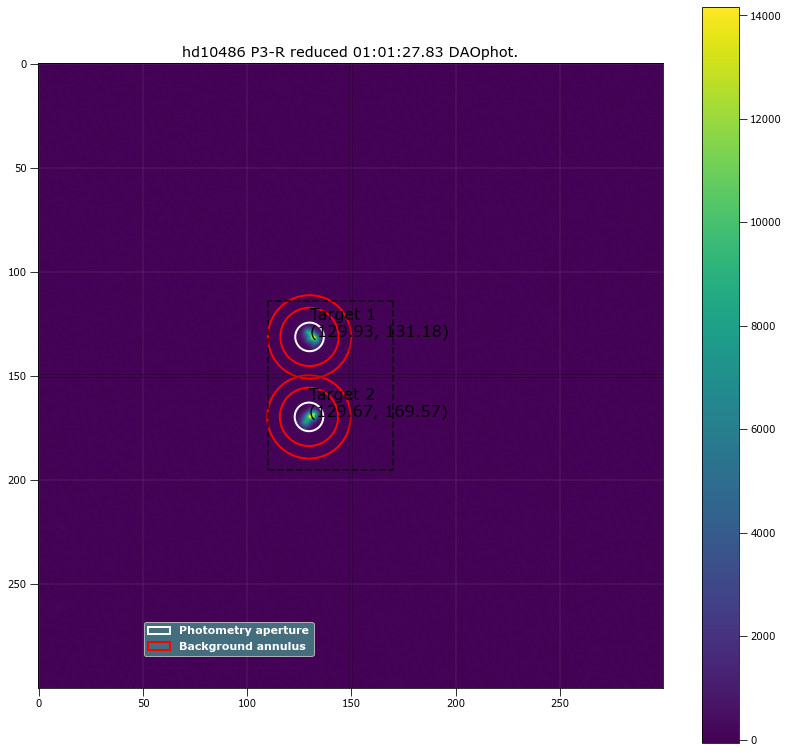

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          4968.9825      34375.263          139.49973
  2 129.66823 169.56957 ...          5104.8304      34461.725          139.36611

 Aperture are: 148.03209853635906 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 4936.7608             384846.29
  2 129.66823 169.56957 ...                 5072.6396              392103.5
518 01:01:27.83 P3-R 2.0 129.9343788858006 131.1831210601847 384846.28606282704 4936.760780692275 129.66823091590214 169.56956908830477 392103.499

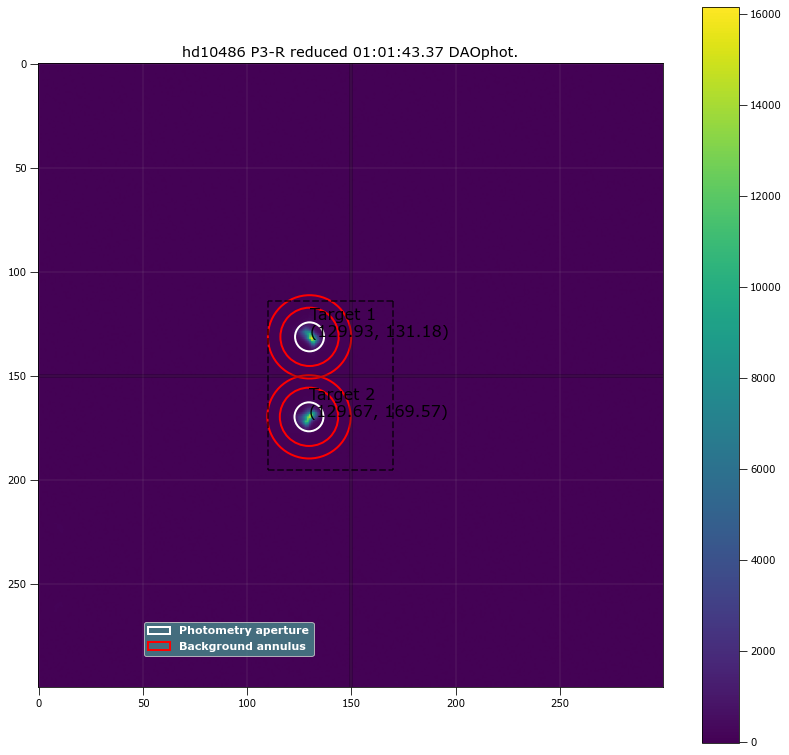

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5142.3035      34772.979          140.93449
  2 129.66823 169.56957 ...          5152.7924      34129.777          138.29733

 Aperture are: 151.89484283595834 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5108.9009             382336.54
  2 129.66823 169.56957 ...                 5120.0148             387235.71
519 01:01:43.37 P3-R 2.0 129.9343788858006 131.1831210601847 382336.5385508816 5108.900914499075 129.66823091590214 169.56956908830477 387235.7147

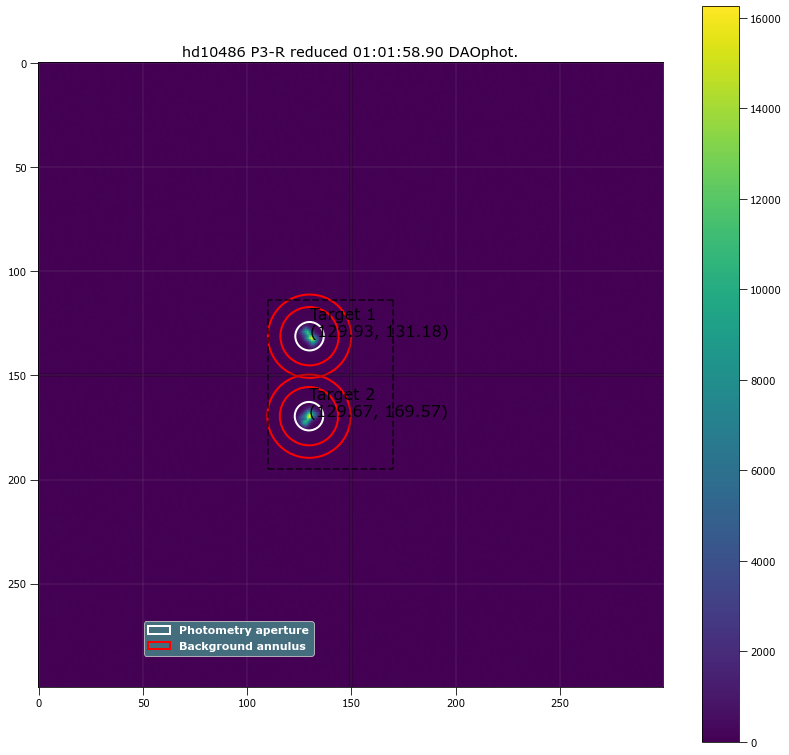

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5369.9113      34036.796          137.86942
  2 129.66823 169.56957 ...          5445.4248       33940.34          137.28414

 Aperture are: 146.75557269350875 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5338.3407             389906.27
  2 129.66823 169.56957 ...                 5413.9883             394513.16
520 01:01:58.90 P3-R 2.0 129.9343788858006 131.1831210601847 389906.2736809924 5338.340700872956 129.66823091590214 169.56956908830477 394513.1604

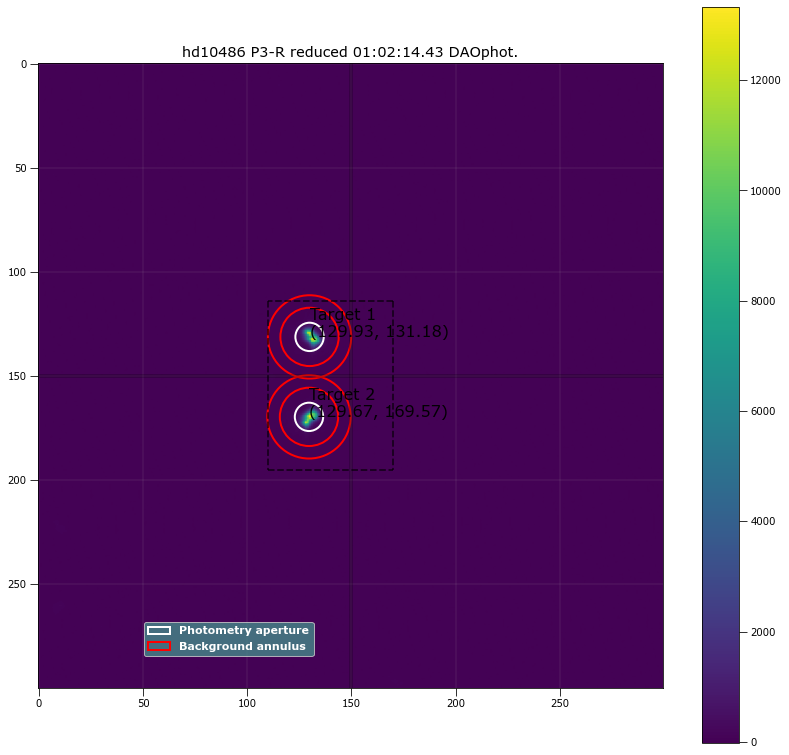

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5175.4542      34318.514          138.82088
  2 129.66823 169.56957 ...           5261.297      34094.974          137.65678

 Aperture are: 145.48457464583316 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5143.9411             385656.43
  2 129.66823 169.56957 ...                 5230.0481             393163.02
521 01:02:14.43 P3-R 2.0 129.9343788858006 131.1831210601847 385656.4330213744 5143.941088412302 129.66823091590214 169.56956908830477 393163.0229

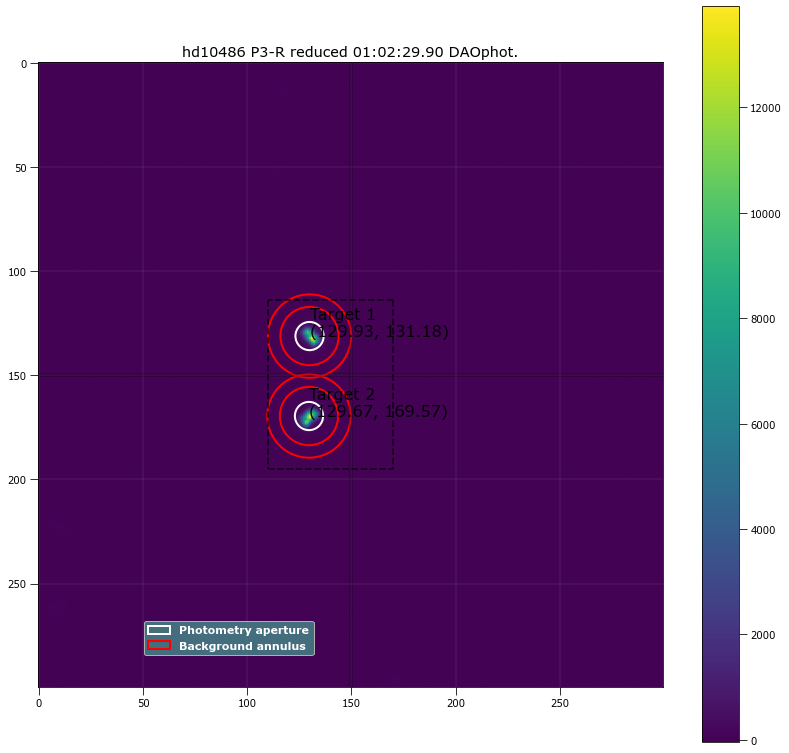

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5128.9351      33725.562          136.70194
  2 129.66823 169.56957 ...          5206.5411       33672.37          136.53999

 Aperture are: 144.2191043933323 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5098.1729             386827.73
  2 129.66823 169.56957 ...                 5175.8153             392980.26
522 01:02:29.90 P3-R 2.0 129.9343788858006 131.1831210601847 386827.7295037927 5098.1729351128915 129.66823091590214 169.56956908830477 392980.2576

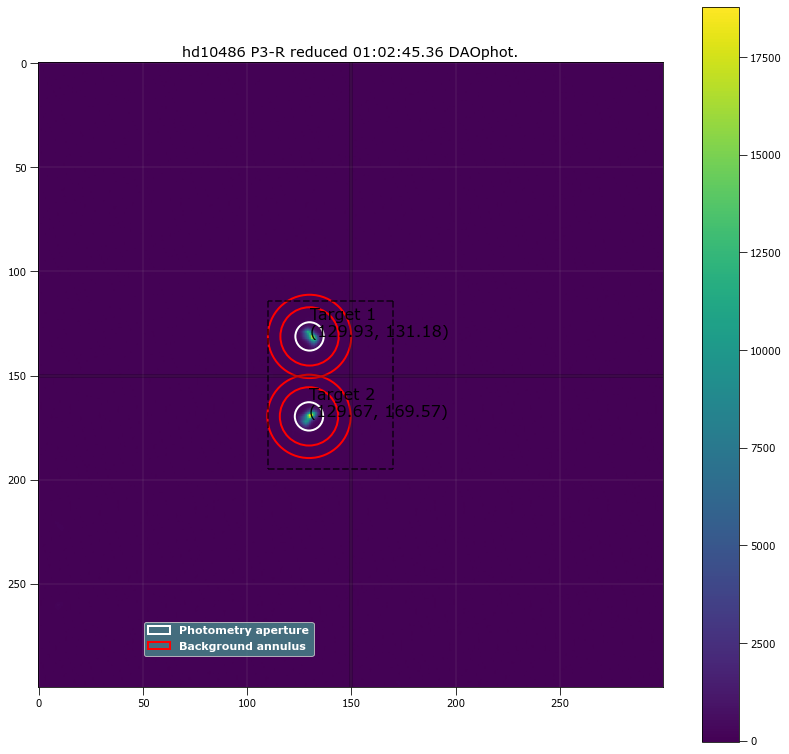

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5573.3906      34256.358          138.47593
  2 129.66823 169.56957 ...          5760.6979      34191.541          138.26154

 Aperture are: 145.48457464583316 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5541.9558             390703.99
  2 129.66823 169.56957 ...                 5729.3117             395326.91
523 01:02:45.36 P3-R 2.0 129.9343788858006 131.1831210601847 390703.99004609714 5541.955793359609 129.66823091590214 169.56956908830477 395326.911

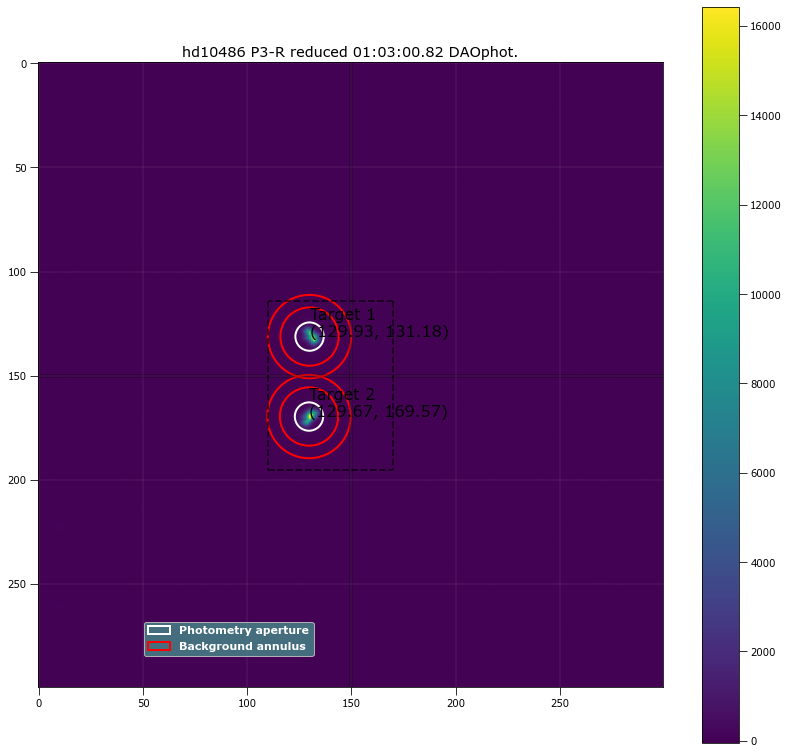

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5190.3466      34535.897          139.79658
  2 129.66823 169.56957 ...          5358.5951      34567.002          140.07116

 Aperture are: 145.48457464583316 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5158.6119             383075.55
  2 129.66823 169.56957 ...                 5326.7981             388075.08
524 01:03:00.82 P3-R 2.0 129.9343788858006 131.1831210601847 383075.5488754955 5158.611928710904 129.66823091590214 169.56956908830477 388075.0767

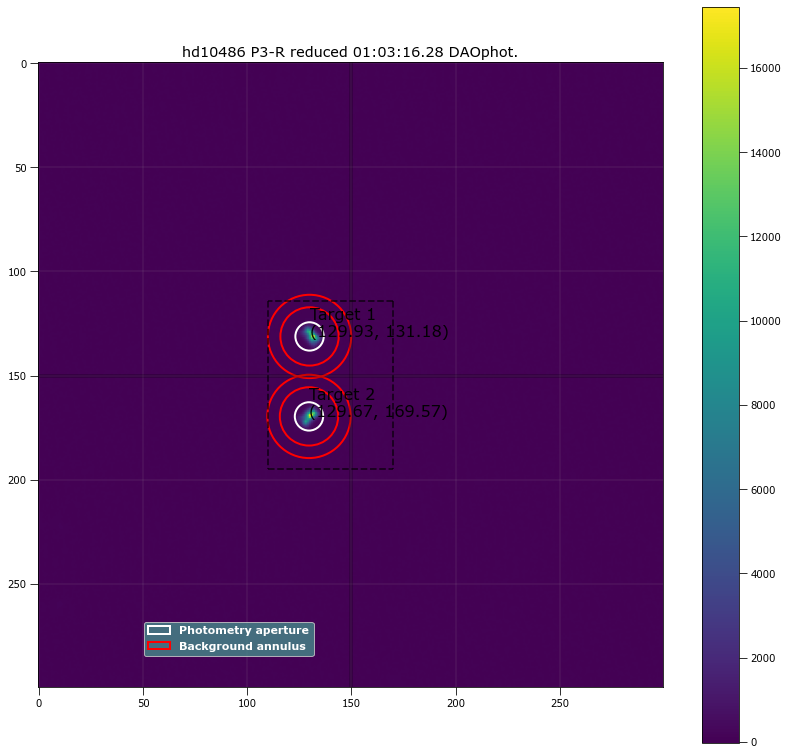

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5382.1245      34110.752          137.83168
  2 129.66823 169.56957 ...          5533.1581      33398.528            135.333

 Aperture are: 145.48457464583316 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5350.8359             388018.98
  2 129.66823 169.56957 ...                 5502.4367             394715.57
525 01:03:16.28 P3-R 2.0 129.9343788858006 131.1831210601847 388018.9806409595 5350.835907951531 129.66823091590214 169.56956908830477 394715.5653

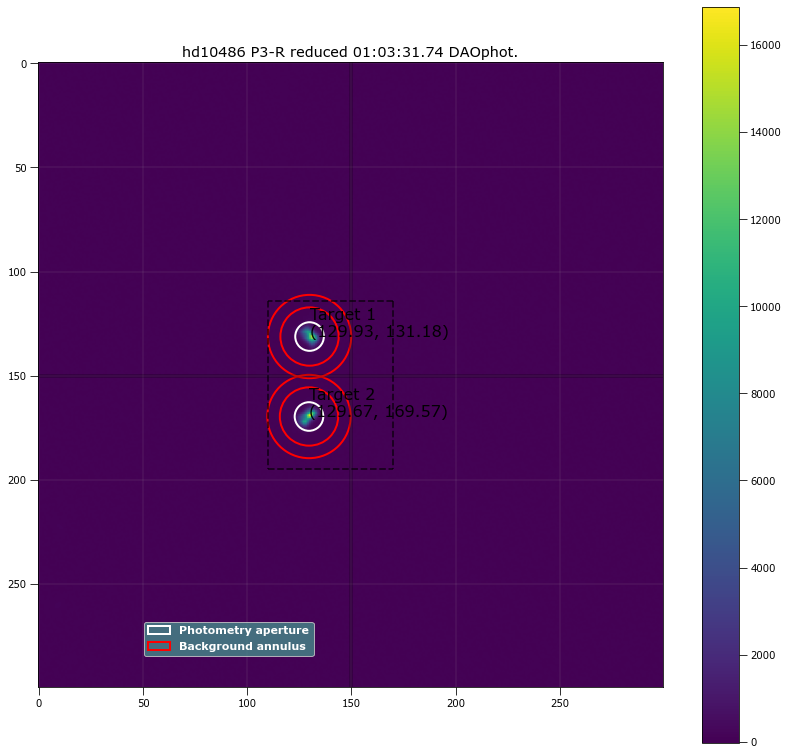

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5207.8762       33845.14          136.78817
  2 129.66823 169.56957 ...          5370.9173      33774.177           136.7616

 Aperture are: 148.03209853635906 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5176.2808             386857.19
  2 129.66823 169.56957 ...                  5339.328             390121.89
526 01:03:31.74 P3-R 2.0 129.9343788858006 131.1831210601847 386857.1850811946 5176.280769529181 129.66823091590214 169.56956908830477 390121.8901

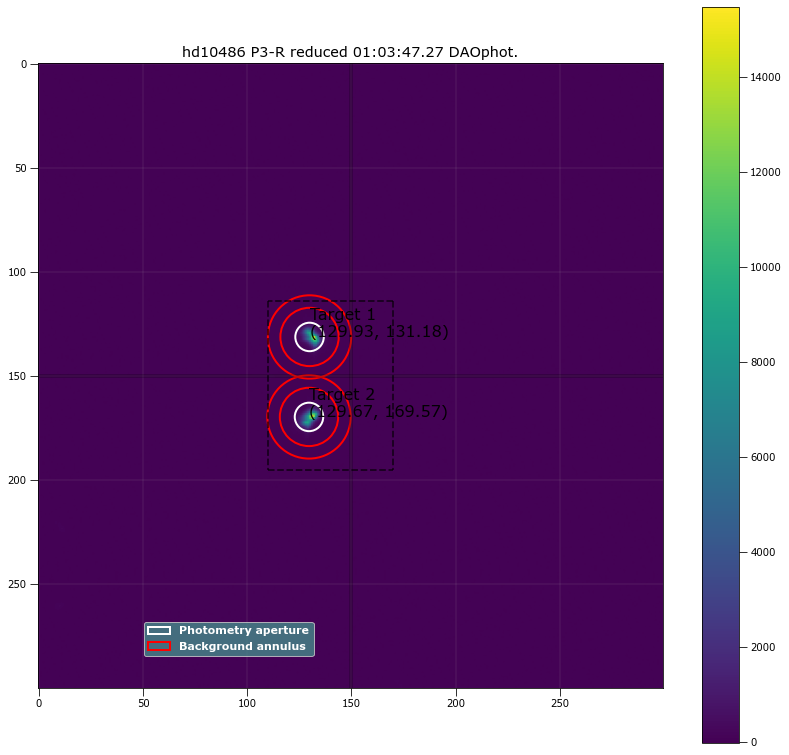

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5040.1942       34625.49          139.90339
  2 129.66823 169.56957 ...          5137.6424       34255.34          138.54617

 Aperture are: 146.75557269350875 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5008.1579              382967.1
  2 129.66823 169.56957 ...                 5105.9169             390088.18
527 01:03:47.27 P3-R 2.0 129.9343788858006 131.1831210601847 382967.0995727571 5008.157909471517 129.66823091590214 169.56956908830477 390088.1838

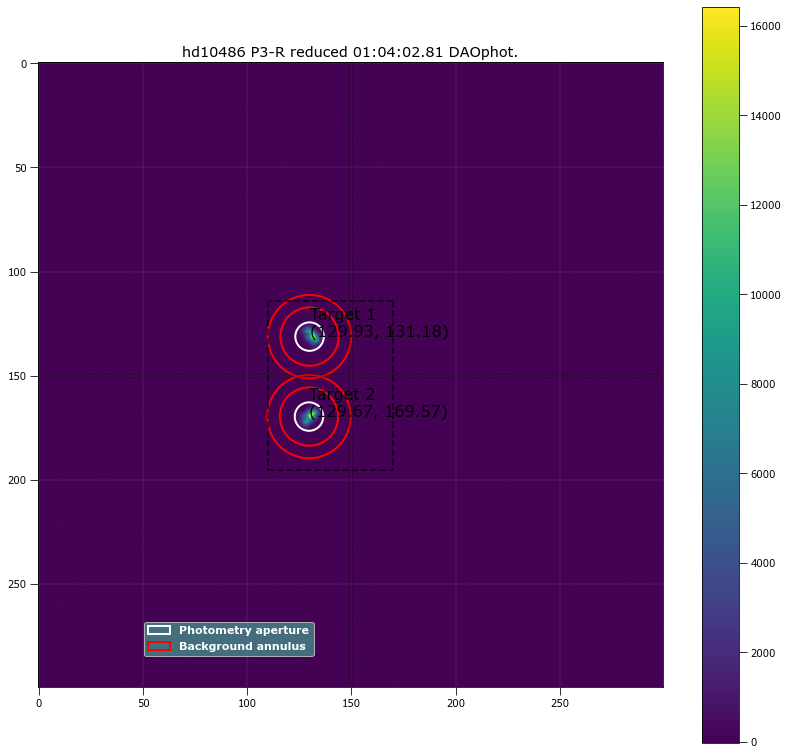

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5234.4198      34281.364          138.73878
  2 129.66823 169.56957 ...          5363.6407      33624.165          135.98518

 Aperture are: 146.75557269350875 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5202.6502             383538.34
  2 129.66823 169.56957 ...                 5332.5016             390265.59
528 01:04:02.81 P3-R 2.0 129.9343788858006 131.1831210601847 383538.33839154674 5202.650165175912 129.66823091590214 169.56956908830477 390265.591

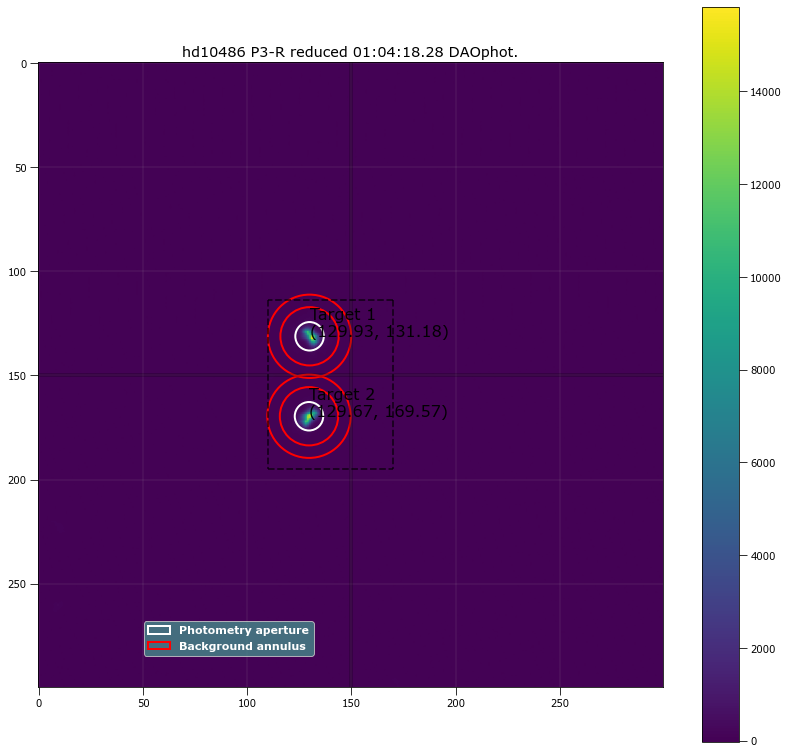

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...          5193.9469      34754.911          140.59404
  2 129.66823 169.56957 ...          5327.0719      34098.513          137.79785

 Aperture are: 146.75557269350875 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                 5161.7524             383084.08
  2 129.66823 169.56957 ...                 5295.5177             389040.02
529 01:04:18.28 P3-R 2.0 129.9343788858006 131.1831210601847 383084.08325577946 5161.752374968117 129.66823091590214 169.56956908830477 389040.023

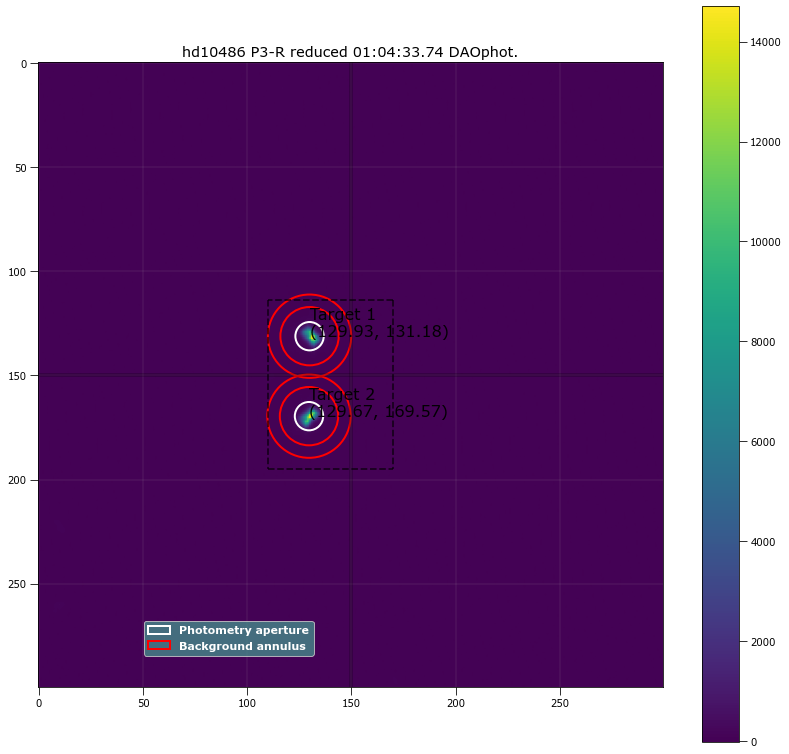

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 129.93438 131.18312 ...           5193.464      33563.015          135.82479
  2 129.66823 169.56957 ...          5315.1782      33750.311          136.34124

 Aperture are: 145.48457464583316 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 129.93438 131.18312 ...                  5162.631             387565.43
  2 129.66823 169.56957 ...                 5284.2279             392927.52
530 01:04:33.74 P3-R 2.0 129.9343788858006 131.1831210601847 387565.433634592 5162.63098558844 129.66823091590214 169.56956908830477 392927.523625

In [17]:
print("P3-R Filter")

res_apt_sum_list = []

start = 481
end = 531
filename = astropy.io.fits.open(target[start])[0].header['OBJECT']+"_"+astropy.io.fits.open(target[start])[0].header['FILTER']

workbook = xlsxwriter.Workbook('./stats/'+MJD+"_"+ filename+str(start)+"-" +str(end)  +'.xlsx')
worksheet = workbook.add_worksheet()
worksheet.write('A1', 'int')
worksheet.write('B1', 'time obs')
worksheet.write('C1', 'filter')
worksheet.write('D1', 'exptime')
worksheet.write('E1', 'pol_std 1 x center')
worksheet.write('F1', 'pol_std 1 y center')
worksheet.write('G1', 'pol_std 1 counts')
worksheet.write('H1', 'pol_std 1 error')
worksheet.write('I1', 'pol_std 2 x center')
worksheet.write('J1', 'pol_std 2 y center')
worksheet.write('K1', 'pol_std 2 counts')
worksheet.write('L1', 'pol_std 2 error')
worksheet.write('M1', 'q')
worksheet.write('N1', 'q error')
worksheet.write('O1', 'u')
worksheet.write('P1', 'u error')
worksheet.write('Q1', 'PD')
worksheet.write('R1', 'PD error')
worksheet.write('S1', 'PA')
worksheet.write('T1', 'PA error')

row = 1
column = 0
search_off = 150
siegma_search = 3
search_bracket = [36, 45, 40, 20]

target_1_x_p3 = []
target_1_y_p3 = []
target_2_x_p3 = []
target_2_y_p3 = []

for k in range(start, end ):
    reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(target[k]),
                                        [512, 512, 512, 512], 
                                        (m_biast, m_dark, m_flat), 
                                        False, True, False)

    #trial_radii = np.linspace(3.0, 7, num=60)
    #target_a = []
    #target_b = []
    #for radii in trial_radii:
    #Find the position
    DAO_positions = funcs_star_finder.dao_star_finder(reduced_obj, search_bracket, siegma_search, 
                                                        2200, search_off, 6.5, 14 , 20, False, False)
        
    if (len(DAO_positions) != 2):
        x_targ, y_targ, peak_targ  = funcs_star_finder.source_peak_finder(reduced_obj, 5,search_bracket, 900 , False, False) #what do I return from this?
        apt_pos = funcs_star_finder.plot_spotted(reduced_obj, search_off, search_bracket , x_targ, y_targ, peak_targ, False, False)
        DAO_positions = funcs_star_finder.peak_to_DAO(apt_pos)
            
    print(k, "object DAO positions:", DAO_positions)
    print("DAO position 1:", DAO_positions[0], "DAO position 2:", DAO_positions[1])
    
    target_1_x_p3.append( DAO_positions[0][0]         )
    target_1_y_p3.append( DAO_positions[0][1]         )
    target_2_x_p3.append( DAO_positions[1][0]         )
    target_2_y_p3.append( DAO_positions[1][1]         )
    
    print("\n")
    
print("mean target_1_x:", np.mean(target_1_x_p3)   )
print("mean target_1_y:", np.mean(target_1_y_p3)   )
print("mean target_2_x:", np.mean(target_2_x_p3)   )
print("mean target_2_y:", np.mean(target_2_y_p3)   )

#apply one last correction here

print("\n")
phot_tab = funcs_apt_phot.apt_phot_local_bkg_sub(reduced_obj, search_off, search_bracket, DAO_positions, 6.5, 14 , 20, False, False)
print("These are your points")
t_1_x_f_offset = -0.96
t_1_y_f_offset = -8.5
t_2_x_f_offset = 0
t_2_y_f_offset = 0

print("\n")

for k in range(start, end ):
    reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(target[k]),
                                        [512, 512, 512, 512], 
                                        (m_biast, m_dark, m_flat), 
                                        False, True, False)
    
    trial_radii = np.linspace(5.5, 9, num=60)
    target_a = []
    target_b = []
    for radii in trial_radii:
        phot_tab = funcs_apt_phot.apt_phot_local_bkg_sub(reduced_obj, search_off, search_bracket, DAO_positions, radii, 14 , 20, False, False)
        target_a.append(phot_tab['residual_aperture_sum'][0])
        target_b.append(phot_tab['residual_aperture_sum'][1])

    combine_target = [target_a, target_b] #, target_c, target_d]
    
    good_radii=funcs_apt_phot.solve_apt(combine_target, trial_radii, False)

    print("Aperture radius for", reduced_obj[0].header['TIME-OBS'],"is", good_radii)
    phot_tab = funcs_apt_phot.apt_phot_local_bkg_sub(reduced_obj, search_off, search_bracket, [[np.mean(target_1_x_p3)+ t_1_x_f_offset,
                                                                                                np.mean(target_1_y_p3)+ t_1_y_f_offset ],
                                                                                               [np.mean(target_2_x_p3)+ t_2_x_f_offset, 
                                                                                                np.mean(target_2_y_p3)+ t_2_y_f_offset]],good_radii, 14 , 20, True, False)        

    print(k, 
          astropy.io.fits.open(target[k])[0].header['TIME-OBS'],
          astropy.io.fits.open(target[k])[0].header['FILTER'],
          astropy.io.fits.open(target[k])[0].header['EXPTIME'],
          phot_tab['xcenter'][0].value, phot_tab['ycenter'][0].value,
          phot_tab['residual_aperture_sum'][0], phot_tab['residual_aperture_sum_err'][0],
          phot_tab['xcenter'][1].value, phot_tab['ycenter'][1].value,
          phot_tab['residual_aperture_sum'][1], phot_tab['residual_aperture_sum_err'][1],"\n")
    
    write_this = [k, 
          astropy.io.fits.open(target[k])[0].header['TIME-OBS'],
          astropy.io.fits.open(target[k])[0].header['FILTER'],
          astropy.io.fits.open(target[k])[0].header['EXPTIME'],
          phot_tab['xcenter'][0].value, phot_tab['ycenter'][0].value,
          phot_tab['residual_aperture_sum'][0], phot_tab['residual_aperture_sum_err'][0],
          phot_tab['xcenter'][1].value, phot_tab['ycenter'][1].value,
          phot_tab['residual_aperture_sum'][1], phot_tab['residual_aperture_sum_err'][1]] #,

    for item in write_this :
        worksheet.write(row, column, item)
        column += 1
        
    column = 0
    row += 1
    
workbook.close()

In [ ]:
6.953389830508474
7.309322033898305
7.0423728813559325
7.01271186440678
6.983050847457627
6.953389830508475
7.101694915254237

In [ ]:
#Now I am seeing a case where with the threshold lowered, long compute time I am picking up unwanted background sources
#I'm looking at the example from P1-R
#Target_1

#The pipe!
#we expect 4 targets
#37 doesnt work
#Here is a work around. Incorporate the peak finder into the pipeline and tell the process such that if DAO cannot find the 
#targets, use the peak find coordinates. I suspect the problem is the FWHM.